Analisar os níveis de energia no processo adiabático

In [1]:
import numpy as np

def P1(J, h, T):
    denominador = (1 + (2*np.cosh(h/T)) + np.exp(J/T))
    numerador = np.exp((-1)*h/T)
    P1 = numerador/denominador  
    
    return P1

def P2(J, h, T):
    denominador = (1 + (2*np.cosh(h/T)) + np.exp(J/T))
    numerador = 1
    P2 = numerador/denominador  
    
    return P2

def P3(J, h, T):
    denominador = (1 + (2*np.cosh(h/T)) + np.exp(J/T))
    numerador = np.exp(h/T)
    P3 = numerador/denominador  
    
    return P3

def P4(J, h, T):
    denominador = (1 + (2*np.cosh(h/T)) + np.exp(J/T))
    numerador = np.exp(J/T)
    P4 = numerador/denominador  
    
    return P4

Plotando P1,P2,P3 e P4

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def plot_P1P2P3P4_T(J, h_values, T_values):    
    
    P1_values = P1(J, h_values, T_values)
    P2_values = P2(J, h_values, T_values)
    P3_values = P3(J, h_values, T_values)
    P4_values = P4(J, h_values, T_values)

    plt.figure(figsize=(10, 6))

    plt.plot(T_values, P1_values, label='P1(T)')
    plt.plot(T_values, P2_values, label='P2(T)')
    plt.plot(T_values, P3_values, label='P3(T)')
    plt.plot(T_values, P4_values, label='P4(T)')

    plt.xlabel('T (Temperatura)')
    plt.ylabel('Probabilidade')
    plt.title('Probabilidades P1 = +h, P2 = 0, P3 = -h e P4 = -J em função de T')

    plt.legend()
    plt.grid(True)
    plt.show()
    
    
def plot_P1P2P3P4_h(J, h_values, T_values):


    P1_values = P1(J, h_values, T_values)
    P2_values = P2(J, h_values, T_values)
    P3_values = P3(J, h_values, T_values)
    P4_values = P4(J, h_values, T_values)


    plt.figure(figsize=(10, 6)) # Define o tamanho da figura do gráfico

    plt.plot(h_values, P1_values, label='P1(h)')
    plt.plot(h_values, P2_values, label='P2(h)')
    plt.plot(h_values, P3_values, label='P3(h)')
    plt.plot(h_values, P4_values, label='P4(h)')

    plt.xlabel('h')
    plt.ylabel('Probabilidade')
    plt.title('Probabilidades P1 = +h, P2 = 0, P3 = -h e P4 = -J em função de h')

    plt.legend()

    plt.grid(True)

    plt.show()
    

def plot_P1P2P3P4_3D(J, h_values, T_values):
    H, T_grid = np.meshgrid(h_values, T_values)

    # Calcular os valores das funções para cada ponto na grade
    # Cada P_values será uma matriz 2D correspondente à grade (H, T_grid)
    P1_values_3d = P1(J, H, T_grid)
    P2_values_3d = P2(J, H, T_grid)
    P3_values_3d = P3(J, H, T_grid)
    P4_values_3d = P4(J, H, T_grid)

    # Configurar e plotar o gráfico 3D
    fig = plt.figure(figsize=(12, 10)) # Define o tamanho da figura
    ax = fig.add_subplot(111, projection='3d') # Adiciona um subplot 3D

    # Plotar cada função como uma superfície 3D
    # 'alpha' controla a transparência da superfície
    ax.plot_surface(H, T_grid, P1_values_3d, cmap='viridis', alpha=0.7, label='P1(h, T)')
    ax.plot_surface(H, T_grid, P2_values_3d, cmap='plasma', alpha=0.7, label='P2(h, T)')
    ax.plot_surface(H, T_grid, P3_values_3d, cmap='cividis', alpha=0.7, label='P3(h, T)')
    ax.plot_surface(H, T_grid, P4_values_3d, cmap='magma', alpha=0.7, label='P4(h, T)')

    # Adicionar rótulos aos eixos e título ao gráfico
    ax.set_xlabel('h')
    ax.set_ylabel('T (Temperatura)')
    ax.set_zlabel('Probabilidade')
    ax.set_title('Probabilidades P1, P2, P3 e P4 em função de h e T')

    # Para a legenda funcionar corretamente em 3D, é preciso um pequeno truque:
    # Criar proxies para as legendas, pois plot_surface não as adiciona diretamente
    from matplotlib.lines import Line2D
    handles = [Line2D([0], [0], linestyle="none", c=plt.cm.viridis(0.5), marker='s', markersize=10, label='P1(h, T)'),
            Line2D([0], [0], linestyle="none", c=plt.cm.plasma(0.5), marker='s', markersize=10, label='P2(h, T)'),
            Line2D([0], [0], linestyle="none", c=plt.cm.cividis(0.5), marker='s', markersize=10, label='P3(h, T)'),
            Line2D([0], [0], linestyle="none", c=plt.cm.magma(0.5), marker='s', markersize=10, label='P4(h, T)')]
    ax.legend(handles=handles)

    # Exibir o gráfico
    plt.show()


Gerando T no processo Adiabático

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import fsolve


import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import fsolve

def Temp(J, h, T, entropy):    
    function = (entropy - entropia(J, h, T)) 
    return function


def calcula_T(J, hi, hf, T):
    
    #calculando a entropia para os valores iniciais do problema, e depois precisamos garantir que ela vai ser constante durante todo o processo
    S = round(entropia(J, hi, T), 5)   
    #print(f"entropia incial = {S}")
    
    
    temperature_guess = T
    temperatures = []
    #temperatura_guess é a temperatura inicial do banho quente ou frio, onde há equilibrio termodinamico
    
    
    #criando um linspace de h de hi até hf
    h_values = np.linspace(hi, hf, 200)
    S_values = np.zeros_like(h_values)
    T_values = np.zeros_like(h_values)
    M_values = np.zeros_like(h_values)
    
    
    for i, h in enumerate(h_values):
        calculed_temperature = fsolve(lambda temperature: Temp(J, h, temperature, S), temperature_guess)
        
        
        T_values[i] = calculed_temperature[0]
        S_values[i] = round(entropia(J, h, T_values[i]), 10)
        S = S_values[i]
        M_values[i] = round(magnetizacao(J, h, T_values[i]), 10)
        
        temperatures.append(calculed_temperature[0])
        
        
        temperature_guess = calculed_temperature[0]
        #print(f"T_values[i] = {T_values[i]}, Temperature_guess = {temperature_guess}, entropia[i] = {S_values[i]}")
    return [h_values, T_values, M_values, S_values, temperature_guess]


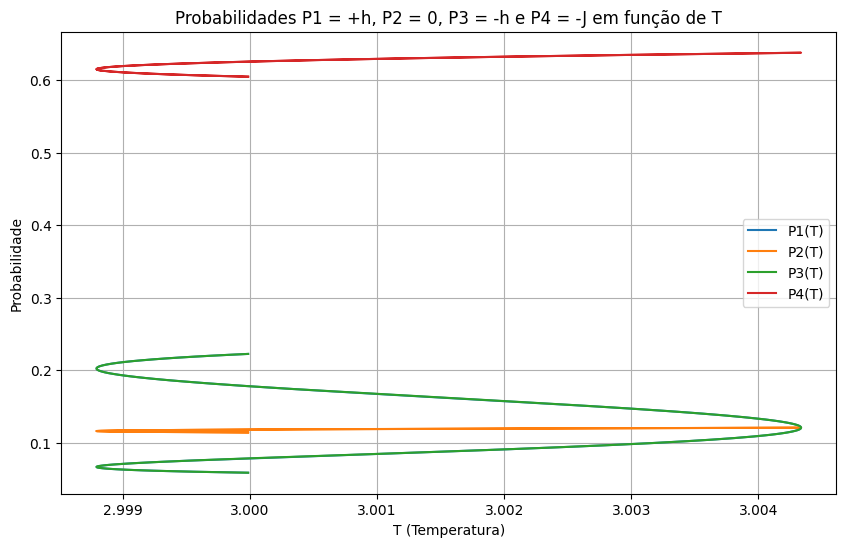

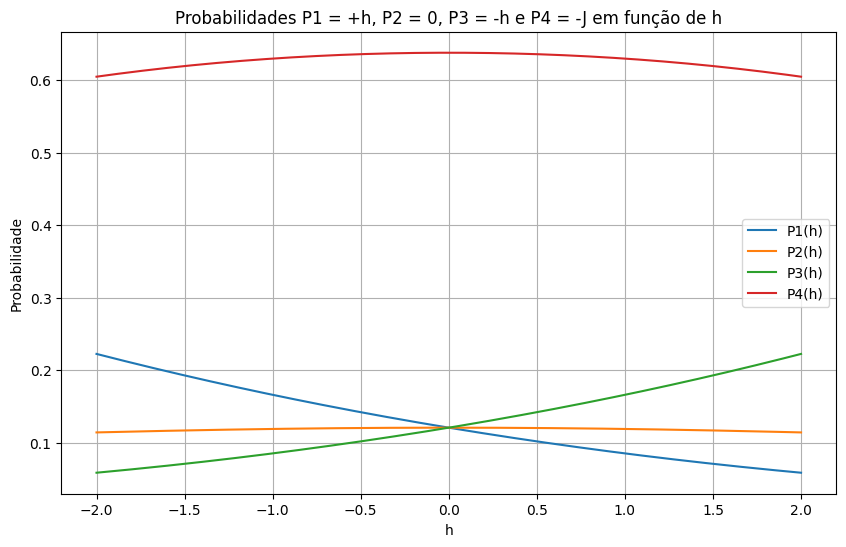

In [7]:
#plot_P1P2P3P4(J, hi, hf , T)
J = 5
[h_values, T_values, M_values, S_values, temperature_guess] = calcula_T(J, -2, 2, 3)

plot_P1P2P3P4_T(J, h_values, T_values)

plot_P1P2P3P4_h(J, h_values, T_values)

#plot_P1P2P3P4_3D(J, h_values, T_values)

-------------------


O codigo antigo começa aqui

In [3]:
import numpy as np

def Z(J,h,T):
    Z = 1 + 2*(np.cosh(h/T)) + np.exp(J/T)
    return Z

def energia_Livre(J, h, T):
    F = (-1) * T * (np.log(Z(J, h, T)))
    return F

def energia_Media(J, h, T):
    numerador = ((-1) * ((J * np.exp(J/T)) + (2 * h * np.sinh(h/T)))) 
    denominador = Z(J, h, T)
    U = (numerador / denominador)
    return U

def entropia(J, h, T):
    numerador = (((-1) * ((J*np.exp(J/T)) + (2*h*np.sinh(h/T))))/T)
    denominador = Z(J, h, T)
    S = (np.log(Z(J, h, T)) + (numerador / denominador))
    return S 

def magnetizacao(J, h, T):
    numerador = (2 * np.sinh(h/T))
    denominador = Z(J, h, T)
    M = (numerador / denominador)
    return M

def susceptibilidade(J, h, T):
    term1 = ((2 * np.cosh(h/T)) / (T * Z(J, h, T)))
    term2 = ((4 * (np.sinh(h/T))**2) / (T * (Z(J, h, T))**2))
    X = term1 - term2
    return X

Plotando:$\\$
Energia Livre de Helmholtz: $\rightarrow F(J, h, T)\\$
Energia Média: $\rightarrow U(J, h, T)\\$
Entropia: $\rightarrow S(J, h, T)\\$
Magnetização: $\rightarrow M(J, h, T)\\$
Susceptibilidade: $\rightarrow X(J, h, T)\\$

En função de $h = [-2,2]$, para diferentes valores $T = (0.1, 0.4, 1)$, com $J=0$ constante 

In [6]:
import numpy as np
import matplotlib.pyplot as plt

def plot_FB_UB_SB_MB_XB(Ji, Jf, hi, hf, Temperature):
    
    #definindo os valores de T
    T_values = Temperature
    J_values = J
    #criando os intervalos de h
    h_values = np.linspace(hi, hf, 200)
    J_values = np.linspace(Ji, Jf, 200)  # J é constante, mas mantemos a estrutura para compatibilidade
    plt.figure(figsize=(18,6))


    for T in T_values:
        U_values = [energia_Media(J, h, T) for h in h_values]
        S_values = [entropia(J, h, T) for h in h_values]
        M_values = [magnetizacao(J, h, T) for h in h_values]
        X_values = [susceptibilidade(J, h, T) for h in h_values]

        # U x h
        plt.subplot(1, 4, 1)
        plt.plot(h_values, U_values, label=f"T = {T}")
        plt.xlabel('h')
        plt.ylabel('U')
        plt.title('U vs. h')
        plt.grid(True)
        plt.legend()

        # S x h
        plt.subplot(1, 4, 2)
        plt.plot(h_values, S_values, label=f"T = {T}")
        plt.xlabel('h')
        plt.ylabel('S')
        plt.title('S vs. h')
        plt.grid(True)
        plt.legend()

        # M x h
        plt.subplot(1, 4, 3)
        plt.plot(h_values, M_values, label=f"T = {T}")
        plt.xlabel('h')
        plt.ylabel('M')
        plt.title('M vs. h')
        plt.grid(True)
        plt.legend()
        
        # X x h
        plt.subplot(1, 4, 4)
        plt.plot(h_values, X_values, label=f"T = {T}")
        plt.xlabel('h')
        plt.ylabel('X')
        plt.title('X vs. h')
        plt.grid(True)
        plt.legend()

    plt.tight_layout()
    plt.show()

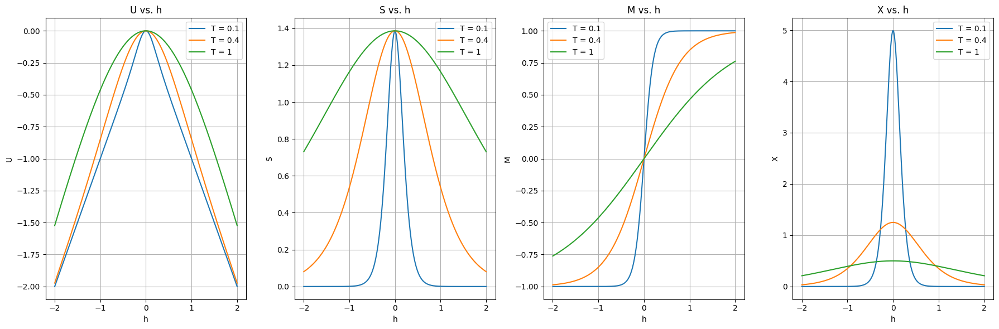

In [11]:
J = 0
hi = -2
hf = 2
T = [0.1, 0.4, 1]

plot_FB_UB_SB_MB_XB(J, hi, hf, T)

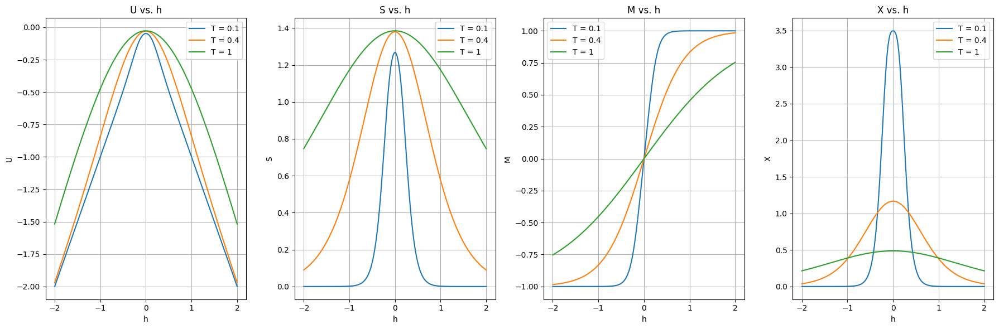

In [12]:
J = 0.1
hi = -2
hf = 2
T = [0.1, 0.4, 1]

plot_FB_UB_SB_MB_XB(J, hi, hf,  T)

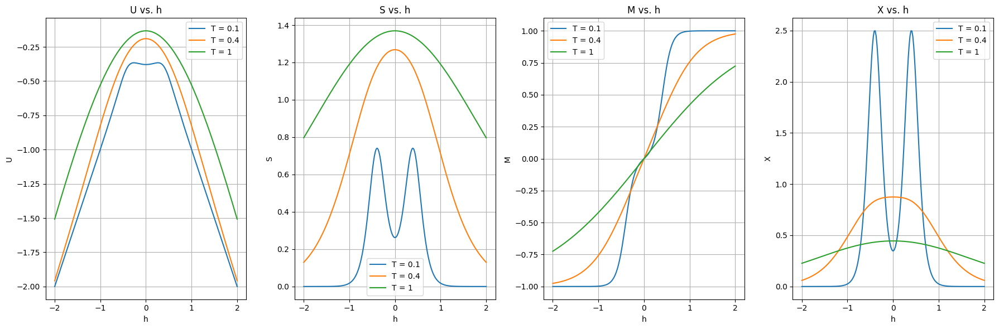

In [14]:
J = 0.4
h = 2
T = [0.1, 0.4, 1]

plot_FB_UB_SB_MB_XB(J, h, T)

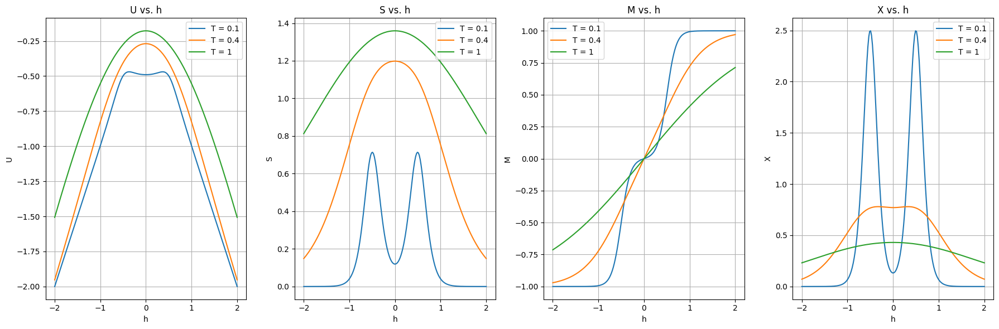

In [15]:
J = 0.5
h = 2
T = [0.1, 0.4, 1]

plot_FB_UB_SB_MB_XB(J, h, T)

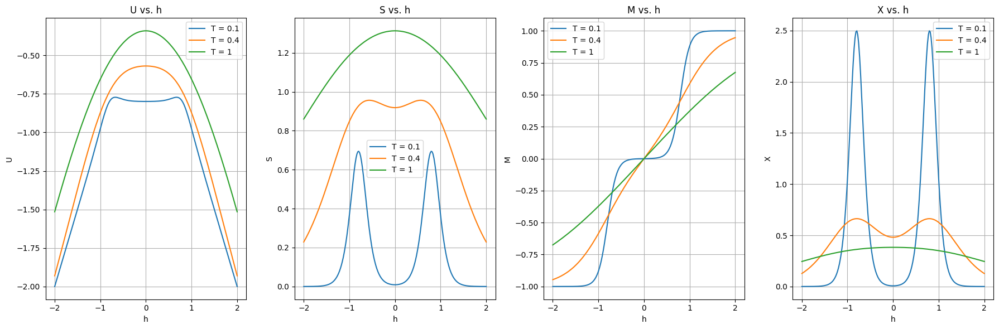

In [16]:
J = 0.8
h = 2
T = [0.1, 0.4, 1]

plot_FB_UB_SB_MB_XB(J, h, T)

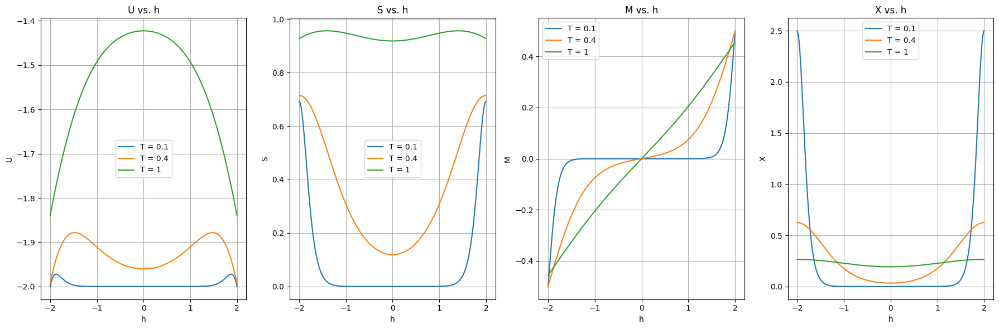

In [17]:
J = 2
h = 2
T = [0.1, 0.4, 1]

plot_FB_UB_SB_MB_XB(J, h, T)

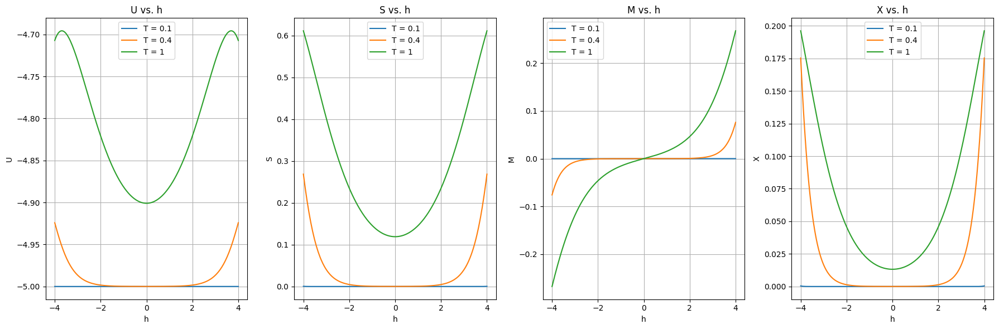

In [18]:
J = 5
h = 4
T = [0.1, 0.4, 1]

plot_FB_UB_SB_MB_XB(J, h, T)

Agora, vamos analisar o comportamento da $\underline{Magnetização}$ $\rightarrow M(J, h, T)$ conforme a temperatura aumenta, para diferentes valores fixos de J e h.

In [9]:
def plot_MT(J, h, Tc, Th):
    
    T_values = np.linspace(Tc, Th, 200)
    J_values = J
    h_values = h
    
    
    
    for J in J_values:
        for h in h_values:
            M_values = [magnetizacao(J, h, T) for T in T_values]
            plt.plot(T_values, M_values, label=f"h = {h}, J = {J} ")
            
        plt.xlabel('T')
        plt.ylabel('M')
        plt.title(f"M vs. T, J = {J}")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

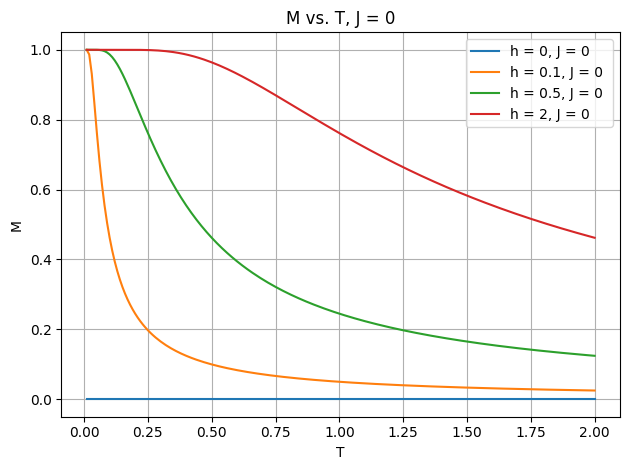

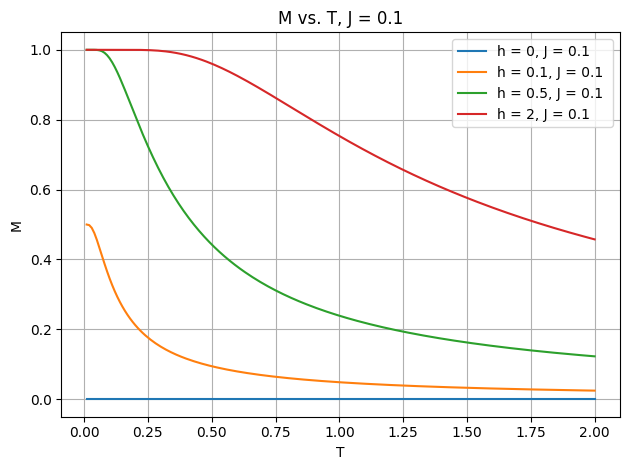

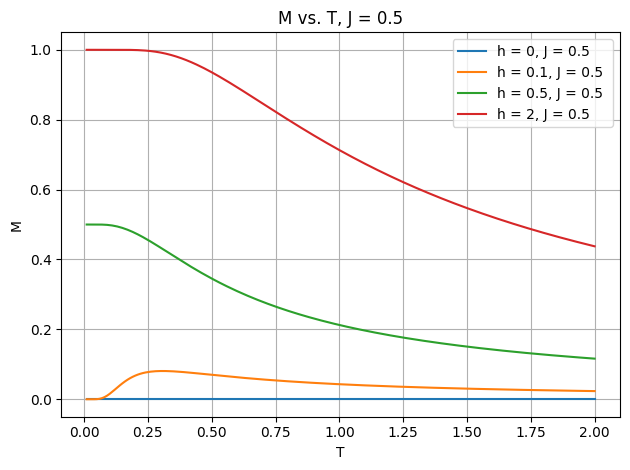

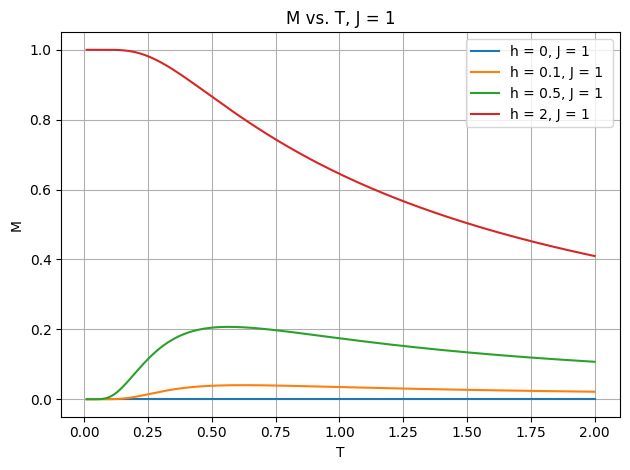

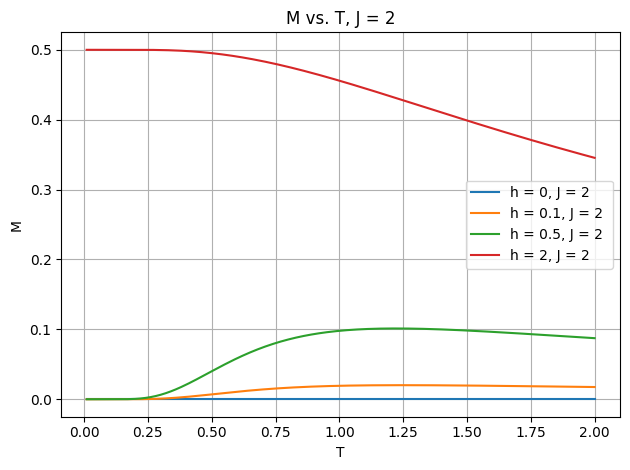

In [20]:
J = [0, 0.1, 0.5, 1, 2]
h = [0, 0.1, 0.5 , 2]
# T define o limite final do gráfico: [0.01, T]
T=2

plot_MT(J, h, T)

Agora, vamos analisar o comportamento da $\underline{Entropia}$ $\rightarrow S(J, h, T)$ conforme a temperatura aumenta, para diferentes valores fixos de J e h.

In [10]:
def plot_ST(J, h, Tc, Th):
    
    T_values = np.linspace(Tc, Th, 200)
    J_values = J
    h_values = h
    
    
    
    for J in J_values:
        for h in h_values:
            S_values = [entropia(J, h, T) for T in T_values]
            plt.plot(T_values, S_values, label=f"h = {h}, J = {J} ")
            
        plt.xlabel('T')
        plt.ylabel('S')
        plt.title(f"S vs. T")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

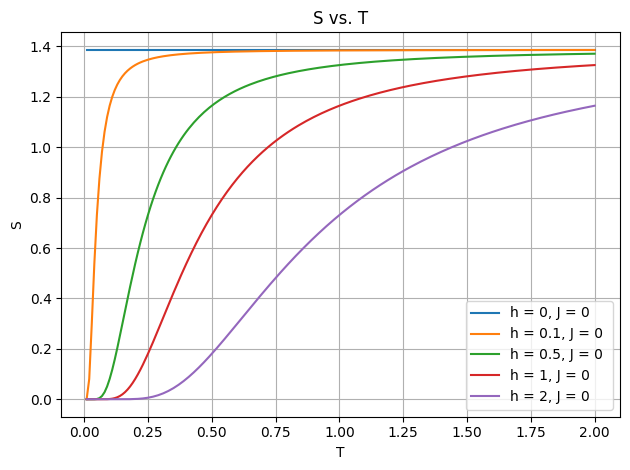

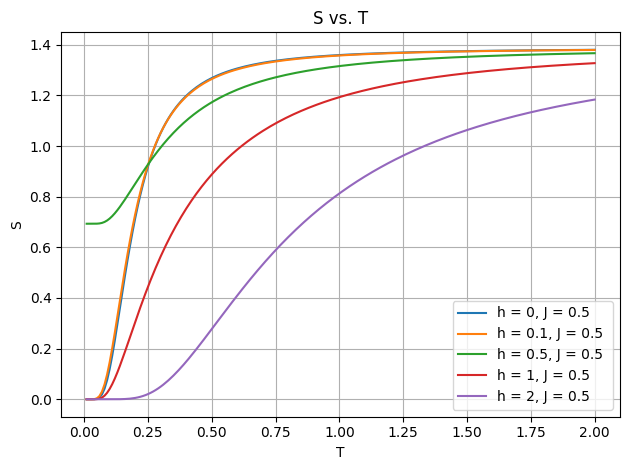

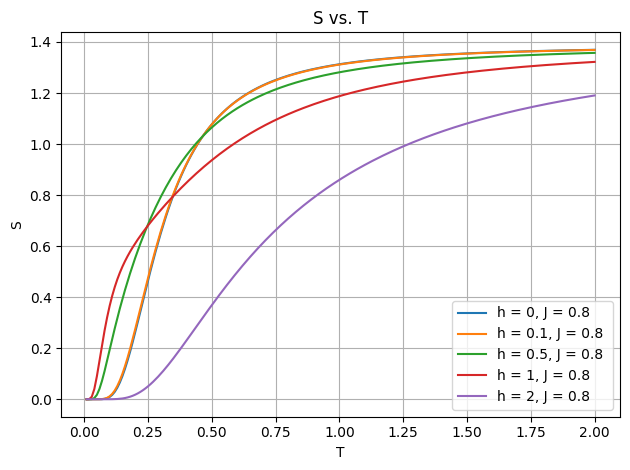

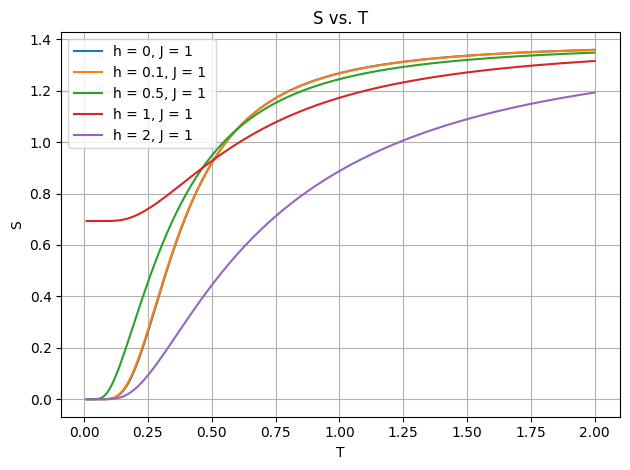

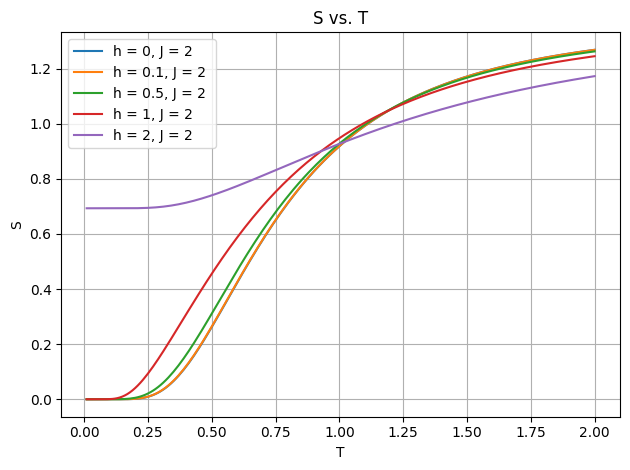

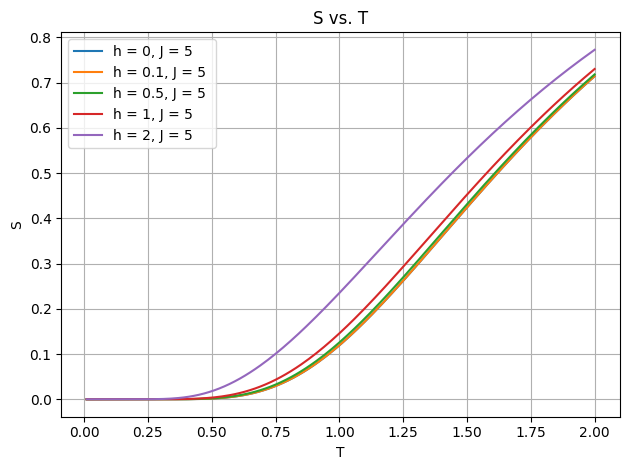

In [22]:
J = [0, 0.5, 0.8, 1, 2, 5]
h = [0, 0.1, 0.5, 1, 2]
# T define o limite final do gráfico: [0.01, T]
T=2

plot_ST(J, h, T)

Agora, vamos analisar o comportamento da $\underline{Energia Média}$ $\rightarrow U(J, h, T)$ conforme a temperatura aumenta, para diferentes valores fixos de J e h.

In [7]:
def plot_UT(J, h, Tc, Th):
    
    T_values = np.linspace(Tc, Th, 200)
    J_values = J
    h_values = h
    
    
    
    for J in J_values:
        for h in h_values:
            U_values = [energia_Media(J, h, T) for T in T_values]
            plt.plot(T_values, U_values, label=f"h = {h}, J = {J} ")
            
        plt.xlabel('T')
        plt.ylabel('U')
        plt.title(f"U vs. T, J = {J}")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

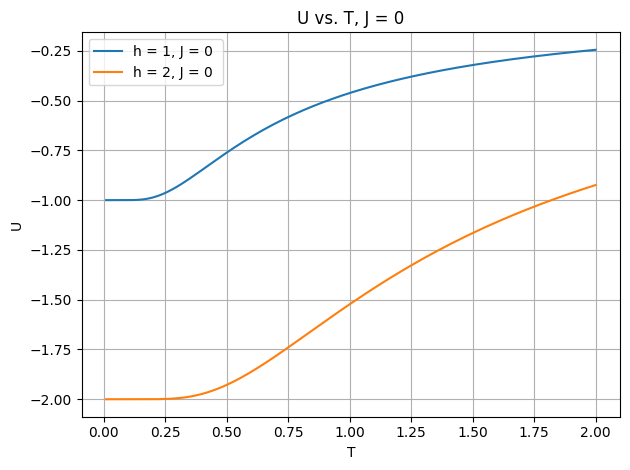

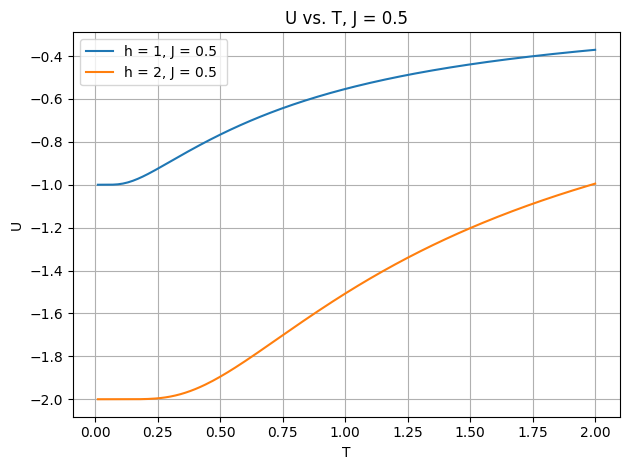

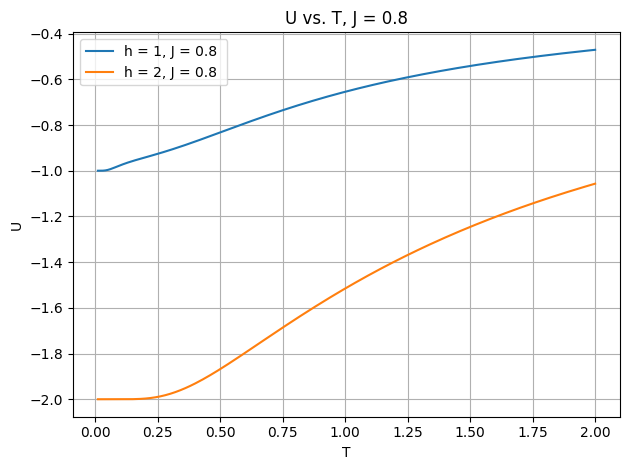

In [25]:
J = [0, 0.5, 0.8]
h = [1, 2]
# T define o limite final do gráfico: [0.01, T]
T=2

plot_UT(J, h, T)

--------

Vamos analisar os Counterplot. Aqui, buscaremos entender o comportamento da Entropia e do Magnetismo em uma determinada região. Assim, podemos comparar dois gráficos.

In [11]:
import numpy as np
import matplotlib.pyplot as plt

def counterplot_M_ht(J):
    h_values = np.linspace(0.01, 2, 1_000)
    T_values = np.linspace(0.01, 3, 1_000)


    H, T = np.meshgrid(h_values, T_values)

    M = magnetizacao(J, H ,T)
    S = entropia(J, H, T)

    # Criando a figura com dois subplots
    plt.figure(figsize=(16, 6))

    # Magnetização
    plt.subplot(1, 2, 1)
    contour1 = plt.contourf(H, T, M, levels=50, cmap='coolwarm')
    plt.colorbar(contour1, label='Magnetização M')
    plt.xlabel('Campo h')
    plt.ylabel('Temperatura T')
    plt.title(f'Magnetização M(h, T) para J = {J}')
    plt.grid(True)

    # Entropia
    plt.subplot(1, 2, 2)
    contour2 = plt.contourf(H, T, S, levels=50, cmap='viridis')
    plt.colorbar(contour2, label='Entropia S')
    plt.xlabel('Campo h')
    plt.ylabel('Temperatura T')
    plt.title(f'Entropia S(h, T) para J = {J}')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

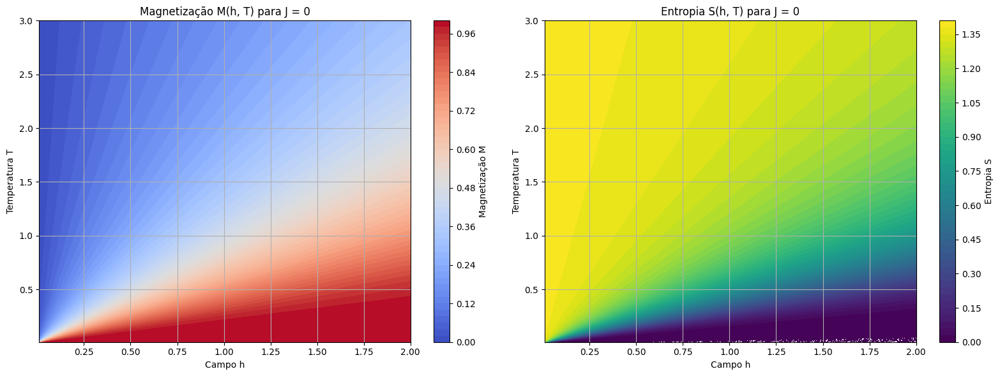

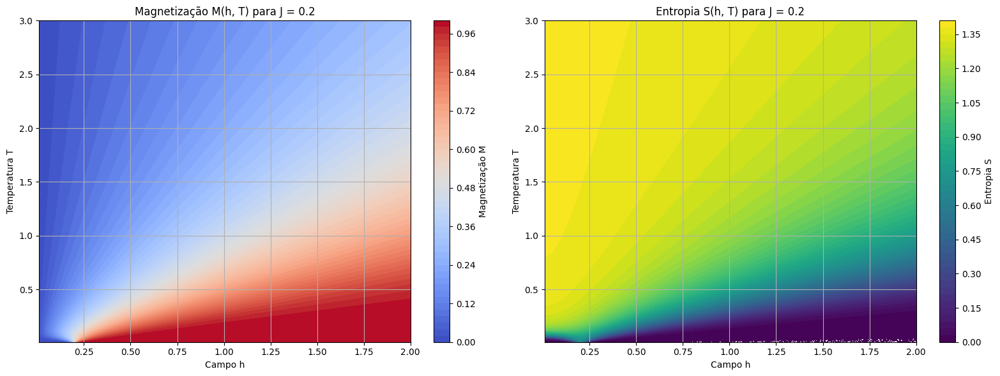

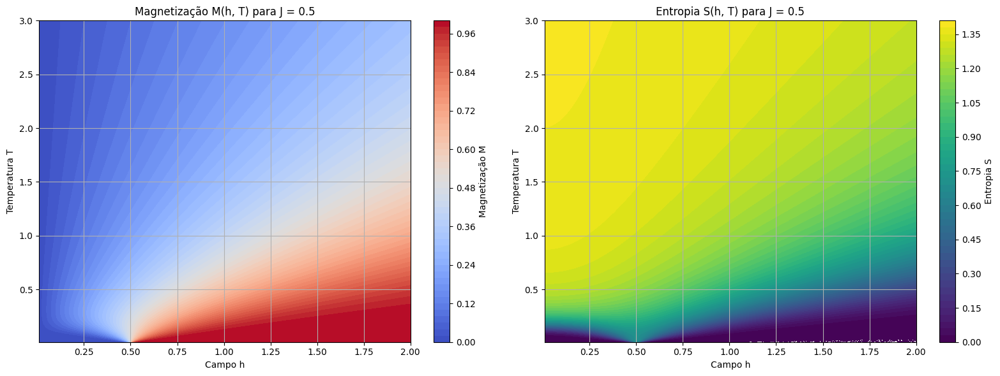

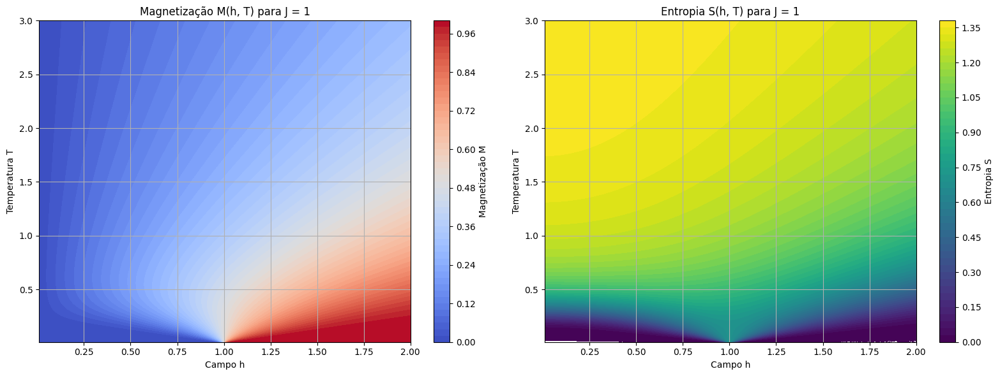

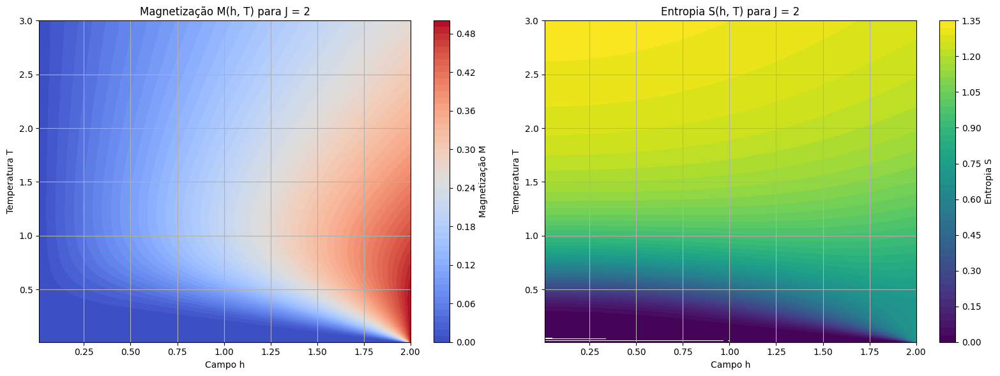

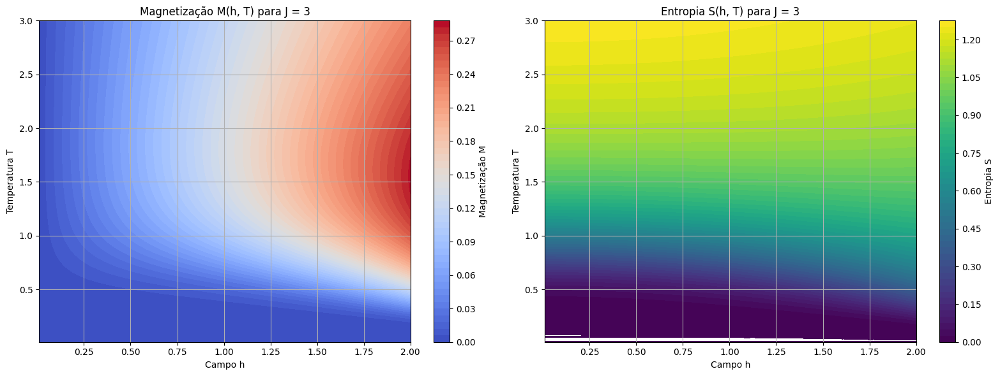

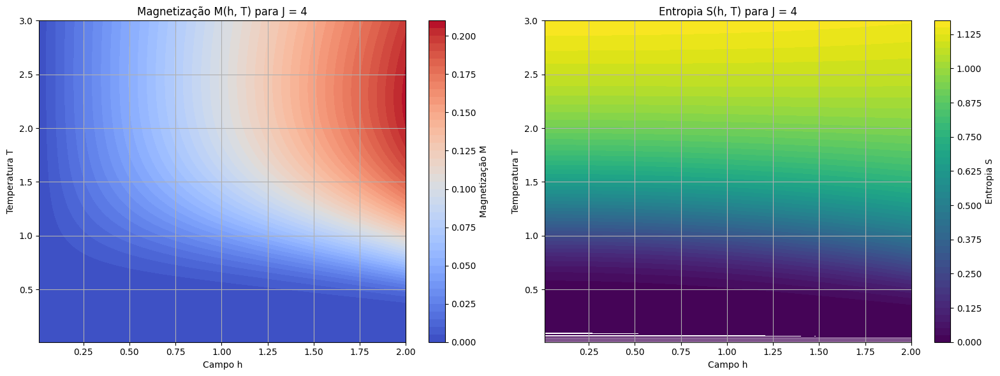

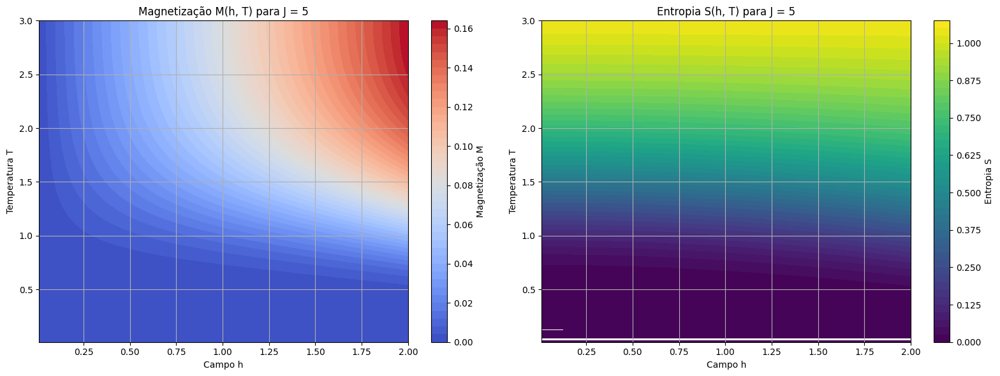

In [17]:
counterplot_M_ht(0)
counterplot_M_ht(0.2)
counterplot_M_ht(0.5)
counterplot_M_ht(1)
counterplot_M_ht(2)
counterplot_M_ht(3)
counterplot_M_ht(4)
counterplot_M_ht(5)

Acho que entendi o counterplot...
Uma duvida... como existe área que eu tenho magnetização e não tenho entropia... teoricamente magnetização e entropia, nesse caso, pelo menos, não são inversamente proporcionais? Quero dizer o seguinte, quando o spins estão "alinhados" eu tenho magnetização e tenho a "menor" entropia, pq o sistema está "organizado"... não?

$\\$
O lance é só para ver que a magnetização muda em algumas regiões em que a entropia é constante? Interessante...

Acho que entendi o counterplot...
Uma duvida... como existe área que eu tenho magnetização e não tenho entropia... teoricamente magnetização e entropia, nesse caso, pelo menos, não são inversamente proporcionais? Quero dizer o seguinte, quando o spins estão "alinhados" eu tenho magnetização e tenho a "menor" entropia, pq o sistema está "organizado"... não?

$\\$
O lance é só para ver que a magnetização muda em algumas regiões em que a entropia é constante? Interessante...

----------

Agora começaremos a construir o que falta para fecharmos o Ciclo de Otto. $\\$
Nesta parte, precisaremos construir uma função capaz de encontrar a temperatura $T$ no final do processo adiabático.$\\$
Você pode se perguntar, o pq disso? Simples de responder, neste sistema nós só temos dois estados de equilíbrio, i.e., quando o sistema está devidamente termalizado com o banho quente (frio), e isso ocorre no final do aquecimento (resfriamento) isocórico.$\\$

Para isso, vamos nos apoiar a termodinâmica e usar o que temos em nossas mãos. No inicio da expansão (compressão) adiabática nós sabemos a temperatura $T_c$ da fonte fria ($T_h$, da fonte quente) e que durante todo processo $\underline{adibático}$ a entropia é constante, i.e., $S(J,hi,T_c) = S(J, hf, addT_c)$, para a compressão, e $S(J, hf, T_h) = S(J, hi, addT_h)$ para a expansão, onde $addT_c$ e $addT_h$ são as respectiva temperaturadas depois da compressão e expansão adiabática. $\\$

Pensamento lógico: Precisamos de uma função $f(J, h_i, h_f, T_i, T_f, S)$, em que $J, h_i, h_f e T_f$ são valores conhecidos, e $h_i$ vai até $h_f$ deixando $T$ livre e $S$ constante para cada valor de $J, h, T$ obtidos durante o processo. $\\$
Para a expansão adiabática: 

Criando a Função capaz de terminar o valor final de $T$ em cada um dos processos $\underline{adibático}.$

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import fsolve

def Temp(J, h, T, entropy):    
    function = (entropy - entropia(J, h, T)) 
    return function

Criando o mencanicos que calcula a temperatura final

In [68]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import fsolve

def calcula_T(Ji, Jf, hi, hf, T):
    
    #calculando a entropia para os valores iniciais do problema, e depois precisamos garantir que ela vai ser constante durante todo o processo
    

    S = round(entropia(Ji, hi, T), 5)   
    
    
    temperature_guess = T
    temperatures = []
    #temperatura_guess é a temperatura inicial do banho quente ou frio, onde há equilibrio termodinamico
    
    #criando um linspace de J de Ji até Jf
    J_values = np.linspace(Ji, Jf, 10)
    #criando um linspace de h de hi até hf
    h_values = np.linspace(hi, hf, 10)
    S_values = np.zeros_like(h_values)
    T_values = np.zeros_like(h_values)
    M_values = np.zeros_like(h_values)
    
    
    for i, h in enumerate(h_values):
        
        J = J_values[i]
        
        calculed_temperature = fsolve(lambda temperature: Temp(J, h, temperature, S), temperature_guess)
        
        
        T_values[i] = calculed_temperature[0]
        S_values[i] = round(entropia(J, h, T_values[i]), 10)
        S = S_values[i]
        M_values[i] = round(magnetizacao(J, h, T_values[i]), 10)
        
        temperatures.append(calculed_temperature[0])
         
        
        temperature_guess = calculed_temperature[0]

    return [h_values, T_values, M_values, S_values, J_values, temperature_guess]




In [60]:
return_calcula_T = calcula_T(2, 3, 1, 2, 2)
h_values_returned = return_calcula_T[0]
temp_returned = return_calcula_T[1]
M_values_returned = return_calcula_T[2] 
S_values_returned = return_calcula_T[3]
J_values_returned = return_calcula_T[4]
temperature_guess_returned = return_calcula_T[5]

for i in range(len(h_values_returned)):
    print(f"h = {h_values_returned[i]}, T = {temp_returned[i]}, M = {M_values_returned[i]}, S = {S_values_returned[i]}, J = {J_values_returned[i]}")

#print(f"Temperature retornada = {temp_returned}")
#print(f"J_values retornados = {J_values_returned}")
#print(f"h_values retornados = {h_values_returned}")
#print(f"M_values retornados = {M_values_returned}")
#print(f"S_values retornados = {S_values_returned}")
#print(f"temperature_guess retornada = {temperature_guess_returned}")

Calculando para J = 2.0
Calculando para J = 2.111111111111111
Calculando para J = 2.2222222222222223
Calculando para J = 2.3333333333333335
Calculando para J = 2.4444444444444446
Calculando para J = 2.5555555555555554
Calculando para J = 2.6666666666666665
Calculando para J = 2.7777777777777777
Calculando para J = 2.888888888888889
Calculando para J = 3.0
h = 1.0, T = 1.9999966520859047, M = 0.1744681782, S = 1.24505, J = 2.0
h = 1.1111111111111112, T = 2.132351090735729, M = 0.182600218, S = 1.24505, J = 2.111111111111111
h = 1.2222222222222223, T = 2.2660957367829013, M = 0.1897608882, S = 1.24505, J = 2.2222222222222223
h = 1.3333333333333333, T = 2.4010590804030127, M = 0.1961028736, S = 1.24505, J = 2.3333333333333335
h = 1.4444444444444444, T = 2.537093332064665, M = 0.201750198, S = 1.24505, J = 2.4444444444444446
h = 1.5555555555555556, T = 2.67407111190438, M = 0.2068043429, S = 1.24505, J = 2.5555555555555554
h = 1.6666666666666665, T = 2.811882532878498, M = 0.2113489202, S 

Agora vamos plotar a Temperatura, Entropia e Magnetismo em função do campo magnético $h$ durante o processo adiabático. PS: o fato de ser compressão ou expansão é determinado ao trocar $h_i$ por $h_f$ ao chamar a função $calcula T$

In [13]:
import matplotlib.pyplot as plt

def plot_BTeBSeBM(Ji, Jf, hi, hf, T_guesses, calcula_T):
    fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharex=True)

    colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown']
    markers = ['s', 'o', '^', 'D', 'v', '*']

    for idx, T in enumerate(T_guesses):
        h_values, T_values, M_values, S_values, J_values, T_guess = calcula_T(Ji, Jf, hi, hf, T)

        color = colors[idx % len(colors)]
        marker = markers[idx % len(markers)]
        label = f"$T_{{guess}} = {T}$"

        
        axes[0].plot(np.arange(1, len(h_values) + 1), M_values, label=label, color=color, marker=marker)
        axes[1].plot(np.arange(1, len(h_values) + 1), S_values, label=label, color=color, marker=marker)
        axes[2].plot(np.arange(1, len(h_values) + 1), T_values, label=label, color=color, marker=marker)

    
    titles = [f"M vs h  [Ji = {Ji}, Jf = {Jf} , hi ={hi}, hf = {hf}]",f"S vs h  [J = {J}, hi ={hi}, hf = {hf}]",f"T vs h  [J = {J}, hi ={hi}, hf = {hf}]"]
    ylabels = ['M', 'S', 'T']

    for ax, title, ylabel in zip(axes, titles, ylabels):
        ax.set_xlabel('h')
        ax.set_ylabel(ylabel)
        ax.set_title(title)
        ax.grid(True)
        ax.legend()

    plt.tight_layout()
    plt.show()

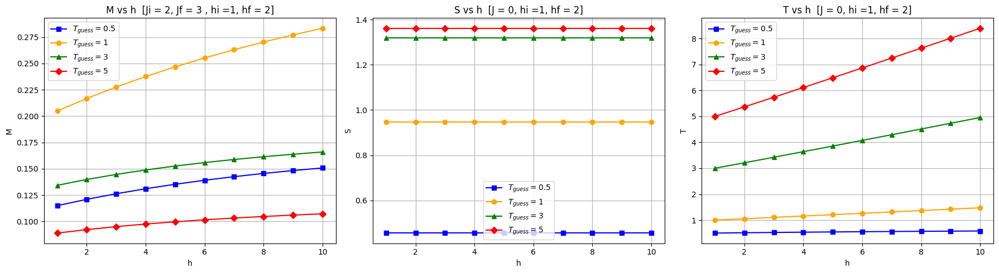

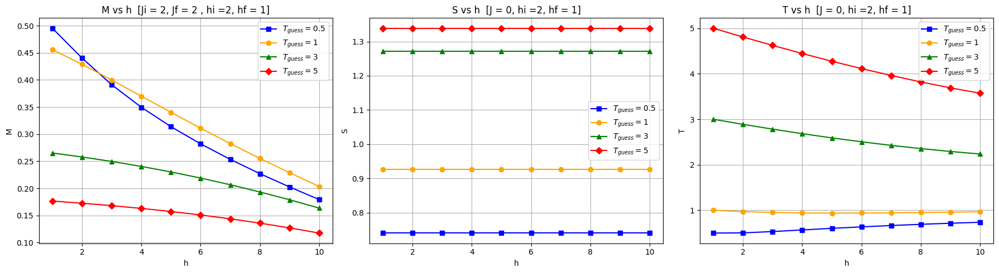

In [74]:
#Indo
Ji = 2; Jf = 3; hi = 1; hf = 2; T_guesses = [0.5, 1, 3, 5]
plot_BTeBSeBM(Ji, Jf, hi, hf, T_guesses, calcula_T)
#voltando
J1 = 3; Jf = 2; hi = 2; hf = 1; T_guesses = [0.5, 1, 3, 5]
plot_BTeBSeBM(Ji, Jf, hi, hf, T_guesses, calcula_T)

TypeError: calcula_T() missing 1 required positional argument: 'T'

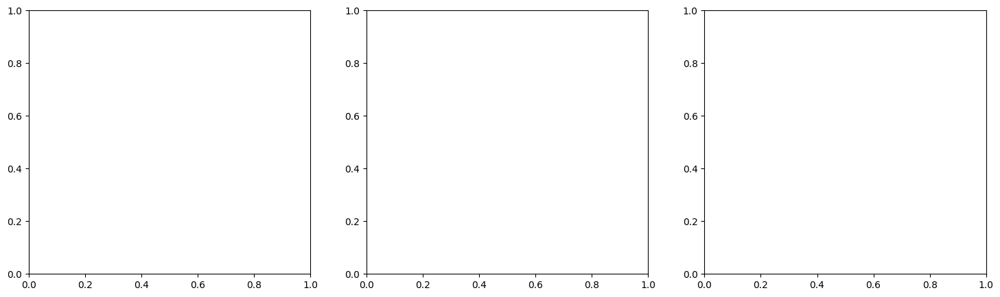

In [ ]:
#Indo
J = 0, Jf= 1; hi = 1; hf = 2; T_guesses = [0.5, 1, 3, 5]
plot_BTeBSeBM(Ji, Jf, hi, hf, T_guesses, calcula_T)
#voltando
J = 0; hi = 2; hf = 1; T_guesses = [0.5, 1, 3, 5]
plot_BTeBSeBM(J, hi, hf, T_guesses, calcula_T)


#indo
J = 1; hi = 1; hf = 2; T_guesses = [0.3, 2, 3, 10]
plot_BTeBSeBM(J, hi, hf, T_guesses, calcula_T)
#voltando
J = 1; hi = 2; hf = 1; T_guesses = [0.3, 2, 3, 10]
plot_BTeBSeBM(J, hi, hf, T_guesses, calcula_T)


#indo
J = 1.5; hi = 1; hf = 2; T_guesses = [0.5, 2, 3, 10]
plot_BTeBSeBM(J, hi, hf, T_guesses, calcula_T)
#voltando
J = 1.5; hi = 2; hf = 1; T_guesses = [0.5, 2, 3, 10]
plot_BTeBSeBM(J, hi, hf, T_guesses, calcula_T)


#indo
J = 3; hi = 1; hf = 2; T_guesses = [0.5, 2, 3, 10]
plot_BTeBSeBM(J, hi, hf, T_guesses, calcula_T)
#voltando
J = 3; hi = 2; hf = 1; T_guesses = [0.5, 2, 3, 10]
plot_BTeBSeBM(J, hi, hf, T_guesses, calcula_T)

--------------------

Agora, vamos buscar mostra que o ciclo é capaz de girar ao contrário. Para isso, vamos determinar dois banhos, um frio e outro quente, e vamos buscar diferentes valores de $h_i$, $h_f$ e $J$ que nos mostre alguma diferença, conforme vamos aumentando o valor de $T_h$, a temperatura do banho quente.

para isso é interesasnte criar uma função que calcule as grandezes indo e voltando


In [14]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import fsolve

def calcula_T_ciclo(Ji, Jf, hi, hf, Tc, Th):
    
    #calculando a entropia para os valores iniciais do problema, e depois precisamos garantir que ela vai ser constante durante todo o processo
    S_c = round(entropia(Ji, hi, Tc), 10)
    S_h = round(entropia(Jf, hf, Th), 10)    
    
    temperature_guess_c = Tc
    temperature_guess_h = Th
    temperatures = []
    #temperatura_guess é a temperatura inicial do banho quente ou frio, onde há equilibrio termodinamico
    
    
    #criando um linspace de h de hi até hf
    h_values_i = np.linspace(hi, hf, 10)
    h_values_f = np.linspace(hf, hi, 10)
    J_values_i = np.linspace(Ji, Jf, 10)
    J_values_f = np.linspace(Jf, Ji, 10)

    
    S_values_i = np.zeros_like(h_values_i)
    T_values_i = np.zeros_like(h_values_i)
    M_values_i = np.zeros_like(h_values_i)
    
    S_values_f = np.zeros_like(h_values_i)
    T_values_f = np.zeros_like(h_values_i)
    M_values_f = np.zeros_like(h_values_i)    
    
    for i, h in enumerate(h_values_i):
        J = J_values_i[i]
        calculed_temperature_c = fsolve(lambda temperature_c: Temp(J, h, temperature_c, S_c), temperature_guess_c)
        #print(f"temperature_calculed_c: {temperature_guess_c}")
        
        T_values_i[i] = calculed_temperature_c[0]
        S_values_i[i] = round(entropia(J, h, T_values_i[i]), 5)
        S = S_values_i[i]
        M_values_i[i] = round(magnetizacao(J, h, T_values_i[i]), 5)
        
        temperatures.append(calculed_temperature_c[0])
        
        
        temperature_guess_c = calculed_temperature_c[0]
        
    for i, h in enumerate(h_values_f):
        J = J_values_f[i]
        calculed_temperature_f = fsolve(lambda temperature_h: Temp(J, h, temperature_h, S_h), temperature_guess_h)
        
        T_values_f[i] = calculed_temperature_f[0]
        S_values_f[i] = round(entropia(J, h, T_values_f[i]), 5)
        S = S_values_f[i]
        M_values_f[i] = round(magnetizacao(J, h, T_values_f[i]), 5)
        
        temperatures.append(calculed_temperature_f[0])
        
        
        temperature_guess_h = calculed_temperature_f[0]        
        

    T_heating_values = np.linspace(temperature_guess_c, Th, 10)
    T_cooling_values = np.linspace(temperature_guess_h, Tc, 10)
    S_values_heating = np.zeros_like(T_heating_values)
    M_values_heating = np.zeros_like(T_heating_values) 
    S_values_cooling = np.zeros_like(T_cooling_values)
    M_values_cooling = np.zeros_like(T_cooling_values)

    for i, T_heating in enumerate(T_heating_values):
        Tti = T_heating
        print(f"T_heating = {Tti}")
        S_values_heating[i] = round(entropia(Jf, hf, Tti), 10)
        M_values_heating[i] = round(magnetizacao(Jf, hf, Tti), 10)
    
    for i, T_cooling in enumerate(T_cooling_values):
        Ttf = T_cooling
        print(f"T_cooling = {Ttf}")
        S_values_cooling[i] = round(entropia(Ji, hi, Ttf), 10)
        M_values_cooling[i] = round(magnetizacao(Ji, hi, Ttf), 10)

    return [h_values_i, T_values_i, M_values_i, S_values_i, temperature_guess_c, h_values_f, T_values_f, M_values_f, S_values_f, temperature_guess_h, T_heating_values, S_values_heating, M_values_heating, T_cooling_values, S_values_cooling, M_values_cooling, J_values_i, J_values_f]

In [15]:
import matplotlib.pyplot as plt

def plot_BTeBSeBM_Spinning(Ji, Jf, hi, hf, Tc, Th, calcula_T):
    fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharex=True)

    colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown']
    markers = ['>', '<', '<', '<', '<', '<', '<', '<', '<', '<', '<']
    #T_list = [Tc] + [Th]
    #hi_hf_list = [(hi,hf)] + ([(hf, hi)]*5)
    
    
    # 1. Primeiro: ida (hi -> hf) com Tc
    h_values, T_values, M_values, S_values, J_values, _ = calcula_T(Ji, Jf, hi, hf, Tc)
    axes[0].plot(h_values, M_values, label=f"$T_c = {Tc}$", color=colors[0], marker=markers[0])
    axes[1].plot(h_values, S_values, label=f"$T_c = {Tc}$", color=colors[0], marker=markers[0])
    axes[2].plot(h_values, T_values, label=f"$T_c = {Tc}$", color=colors[0], marker=markers[0])

    
    for idx, T in enumerate(Th):
        color = colors[(idx + 1) % len(colors)]
        marker = markers[(idx + 1)]
        label = f"$T_h = {T}$"

        h_values, T_values, M_values, S_values,  J_values, _ = calcula_T(Jf, Ji, hf, hi, T)

        axes[0].plot(h_values, M_values, label=label, color=color, marker=marker)
        axes[1].plot(h_values, S_values, label=label, color=color, marker=marker)
        axes[2].plot(h_values, T_values, label=label, color=color, marker=marker)

    
    titles = [f"M vs h  [Ji = {Ji}, Jf = {Jf}, hi ={hi}, hf = {hf}]",f"S vs h  [Ji = {Ji}, Jf = {Jf}, hi ={hi}, hf = {hf}]",f"T vs h  [Ji = {Ji}, Jf = {Jf}, hi ={hi}, hf = {hf}]"]
    ylabels = ['M', 'S', 'T']

    for ax, title, ylabel in zip(axes, titles, ylabels):
        ax.set_xlabel('h')
        ax.set_ylabel(ylabel)
        ax.set_title(title)
        ax.grid(True)
        ax.legend()

    plt.tight_layout()
    plt.show()

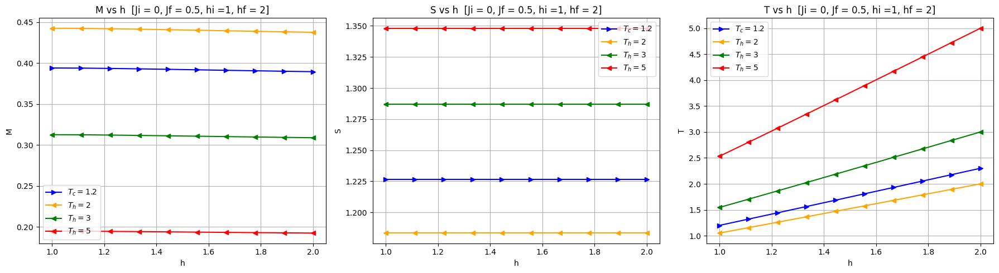

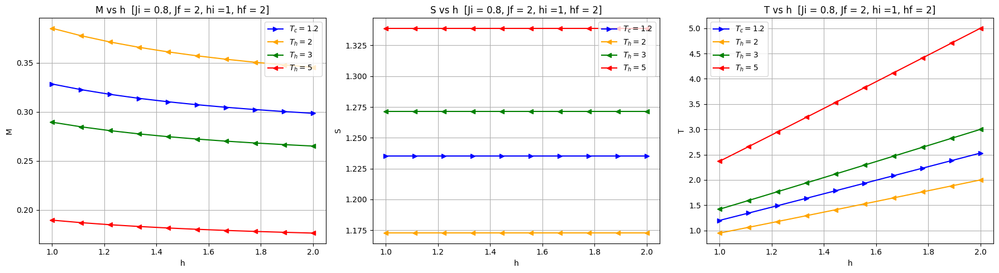

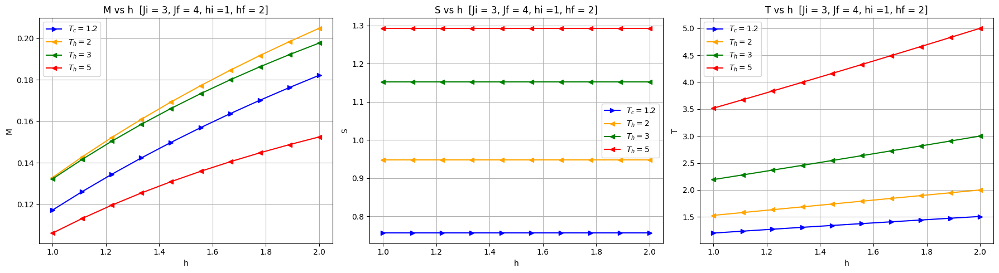

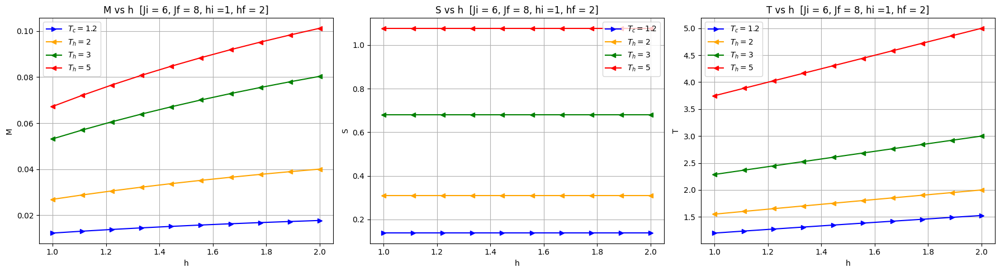

In [91]:
Th = [2,3,5]
Ji = 0
Jf = 0.5
hi = 1
hf = 2
Tc = 1.2
plot_BTeBSeBM_Spinning(Ji, Jf, hi ,hf , Tc, Th, calcula_T)


Th = [2,3,5]
Ji = 0.8
Jf = 2
hi = 1
hf = 2
Tc = 1.2
plot_BTeBSeBM_Spinning(Ji, Jf ,hi ,hf , Tc, Th, calcula_T)


Th = [2,3,5]
Ji = 3
Jf = 4
hi = 1
hf = 2
Tc = 1.2
plot_BTeBSeBM_Spinning(Ji, Jf ,hi ,hf , Tc, Th, calcula_T)

Th = [2,3,5]
Ji = 6
Jf = 8
hi = 1
hf = 2
Tc = 1.2
plot_BTeBSeBM_Spinning(Ji, Jf ,hi ,hf , Tc, Th, calcula_T)

h_values: [1.         1.05263158 1.10526316 1.15789474 1.21052632 1.26315789
 1.31578947 1.36842105 1.42105263 1.47368421 1.52631579 1.57894737
 1.63157895 1.68421053 1.73684211 1.78947368 1.84210526 1.89473684
 1.94736842 2.        ]
h_values: [2.         1.94736842 1.89473684 1.84210526 1.78947368 1.73684211
 1.68421053 1.63157895 1.57894737 1.52631579 1.47368421 1.42105263
 1.36842105 1.31578947 1.26315789 1.21052632 1.15789474 1.10526316
 1.05263158 1.        ]
h_values: [2.         1.94736842 1.89473684 1.84210526 1.78947368 1.73684211
 1.68421053 1.63157895 1.57894737 1.52631579 1.47368421 1.42105263
 1.36842105 1.31578947 1.26315789 1.21052632 1.15789474 1.10526316
 1.05263158 1.        ]
h_values: [2.         1.94736842 1.89473684 1.84210526 1.78947368 1.73684211
 1.68421053 1.63157895 1.57894737 1.52631579 1.47368421 1.42105263
 1.36842105 1.31578947 1.26315789 1.21052632 1.15789474 1.10526316
 1.05263158 1.        ]


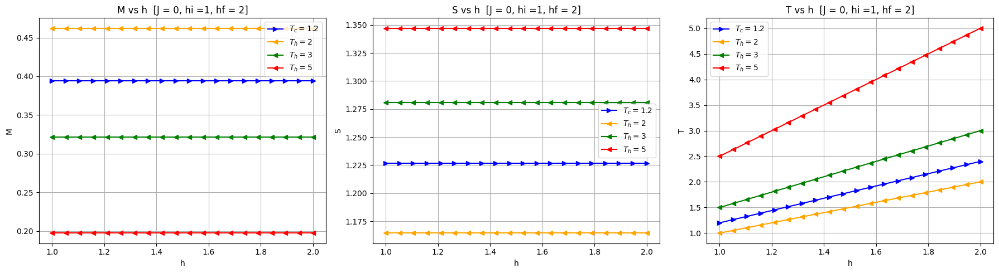

h_values: [1.         1.05263158 1.10526316 1.15789474 1.21052632 1.26315789
 1.31578947 1.36842105 1.42105263 1.47368421 1.52631579 1.57894737
 1.63157895 1.68421053 1.73684211 1.78947368 1.84210526 1.89473684
 1.94736842 2.        ]
h_values: [2.         1.94736842 1.89473684 1.84210526 1.78947368 1.73684211
 1.68421053 1.63157895 1.57894737 1.52631579 1.47368421 1.42105263
 1.36842105 1.31578947 1.26315789 1.21052632 1.15789474 1.10526316
 1.05263158 1.        ]
h_values: [2.         1.94736842 1.89473684 1.84210526 1.78947368 1.73684211
 1.68421053 1.63157895 1.57894737 1.52631579 1.47368421 1.42105263
 1.36842105 1.31578947 1.26315789 1.21052632 1.15789474 1.10526316
 1.05263158 1.        ]
h_values: [2.         1.94736842 1.89473684 1.84210526 1.78947368 1.73684211
 1.68421053 1.63157895 1.57894737 1.52631579 1.47368421 1.42105263
 1.36842105 1.31578947 1.26315789 1.21052632 1.15789474 1.10526316
 1.05263158 1.        ]


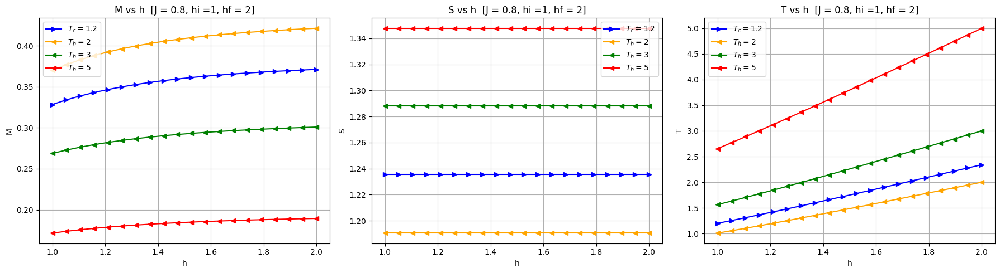

h_values: [1.         1.05263158 1.10526316 1.15789474 1.21052632 1.26315789
 1.31578947 1.36842105 1.42105263 1.47368421 1.52631579 1.57894737
 1.63157895 1.68421053 1.73684211 1.78947368 1.84210526 1.89473684
 1.94736842 2.        ]
h_values: [2.         1.94736842 1.89473684 1.84210526 1.78947368 1.73684211
 1.68421053 1.63157895 1.57894737 1.52631579 1.47368421 1.42105263
 1.36842105 1.31578947 1.26315789 1.21052632 1.15789474 1.10526316
 1.05263158 1.        ]
h_values: [2.         1.94736842 1.89473684 1.84210526 1.78947368 1.73684211
 1.68421053 1.63157895 1.57894737 1.52631579 1.47368421 1.42105263
 1.36842105 1.31578947 1.26315789 1.21052632 1.15789474 1.10526316
 1.05263158 1.        ]
h_values: [2.         1.94736842 1.89473684 1.84210526 1.78947368 1.73684211
 1.68421053 1.63157895 1.57894737 1.52631579 1.47368421 1.42105263
 1.36842105 1.31578947 1.26315789 1.21052632 1.15789474 1.10526316
 1.05263158 1.        ]


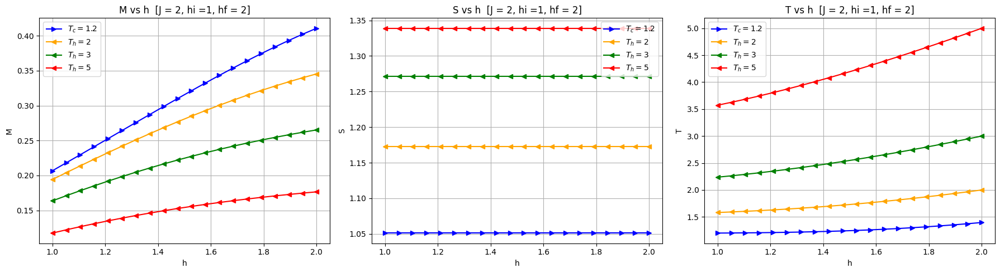

h_values: [2.         2.10526316 2.21052632 2.31578947 2.42105263 2.52631579
 2.63157895 2.73684211 2.84210526 2.94736842 3.05263158 3.15789474
 3.26315789 3.36842105 3.47368421 3.57894737 3.68421053 3.78947368
 3.89473684 4.        ]
h_values: [4.         3.89473684 3.78947368 3.68421053 3.57894737 3.47368421
 3.36842105 3.26315789 3.15789474 3.05263158 2.94736842 2.84210526
 2.73684211 2.63157895 2.52631579 2.42105263 2.31578947 2.21052632
 2.10526316 2.        ]
h_values: [4.         3.89473684 3.78947368 3.68421053 3.57894737 3.47368421
 3.36842105 3.26315789 3.15789474 3.05263158 2.94736842 2.84210526
 2.73684211 2.63157895 2.52631579 2.42105263 2.31578947 2.21052632
 2.10526316 2.        ]
h_values: [4.         3.89473684 3.78947368 3.68421053 3.57894737 3.47368421
 3.36842105 3.26315789 3.15789474 3.05263158 2.94736842 2.84210526
 2.73684211 2.63157895 2.52631579 2.42105263 2.31578947 2.21052632
 2.10526316 2.        ]


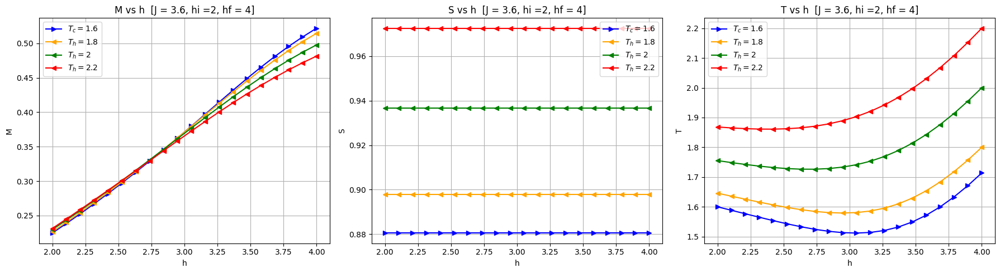

In [ ]:
Th = [2,3,5]
J = 0
hi = 1
hf = 2
Tc = 1.2
plot_BTeBSeBM_Spinning(Ji, Jf, hi ,hf , Tc, Th, calcula_T)


Th = [2,3,5]
J = 0.8
hi = 1
hf = 2
Tc = 1.2
plot_BTeBSeBM_Spinning(Ji, Jf ,hi ,hf , Tc, Th, calcula_T)

Th = [2,3,5]
J = 2
hi = 1
hf = 2
Tc = 1.2
plot_BTeBSeBM_Spinning(J ,hi ,hf , Tc, Th, calcula_T)

Th = [1.8,2,2.2]
J = (8*0.45)
hi = 2
hf = 4
Tc = 1.6
plot_BTeBSeBM_Spinning(J ,hi ,hf , Tc, Th, calcula_T)

h_values: [1.         1.05263158 1.10526316 1.15789474 1.21052632 1.26315789
 1.31578947 1.36842105 1.42105263 1.47368421 1.52631579 1.57894737
 1.63157895 1.68421053 1.73684211 1.78947368 1.84210526 1.89473684
 1.94736842 2.        ]
h_values: [2.         1.94736842 1.89473684 1.84210526 1.78947368 1.73684211
 1.68421053 1.63157895 1.57894737 1.52631579 1.47368421 1.42105263
 1.36842105 1.31578947 1.26315789 1.21052632 1.15789474 1.10526316
 1.05263158 1.        ]
h_values: [2.         1.94736842 1.89473684 1.84210526 1.78947368 1.73684211
 1.68421053 1.63157895 1.57894737 1.52631579 1.47368421 1.42105263
 1.36842105 1.31578947 1.26315789 1.21052632 1.15789474 1.10526316
 1.05263158 1.        ]
h_values: [2.         1.94736842 1.89473684 1.84210526 1.78947368 1.73684211
 1.68421053 1.63157895 1.57894737 1.52631579 1.47368421 1.42105263
 1.36842105 1.31578947 1.26315789 1.21052632 1.15789474 1.10526316
 1.05263158 1.        ]


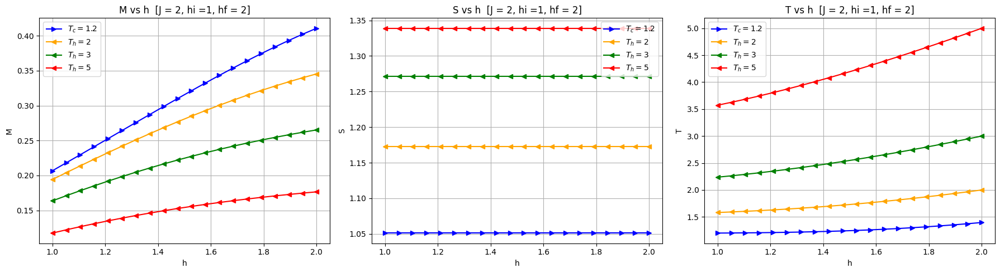

In [248]:
Th = [2,3,5]
J = 2
hi = 1
hf = 2
Tc = 1.2
plot_BTeBSeBM_Spinning(J ,hi ,hf , Tc, Th, calcula_T)

--------------------------

IN: calcula_T_ciclo(J, hi, hf, Tc, Th): $\\$ OUT:  return [h_values_i, T_values_i, M_values_i, S_values_i, temperature_guess_c, h_values_f, T_values_f, M_values_f, S_values_f, temperature_guess_h]

In [16]:
import numpy as np


def Ciclo_de_Otto(Ji, Jf, hi, hf, Tc, Th):
        
    [h_values_i, T_values_i, M_values_i, S_values_i, temperature_guess_c, h_values_f, T_values_f, M_values_f, S_values_f, temperature_guess_h, T_heating_values, S_values_heating, M_values_heating, T_cooling_values, S_values_cooling, M_values_cooling, J_values_i, J_values_f] = calcula_T_ciclo(Ji, Jf, hi, hf, Tc, Th)
    
    E1 = energia_Media(Ji, hi, Tc)
    
    E2 = energia_Media(Jf, hf, temperature_guess_c)
    
    E3 = energia_Media(Jf, hf, Th)
    
    E4 = energia_Media(Ji, hi, temperature_guess_h)
    
    Win = E4 - E3
    Wout = E2 - E1
    Qin = E3 - E2
    Qout = E1 - E4
    
    Qin_entropia = (entropia(Jf, hf, Th) - entropia(Jf, hf, temperature_guess_h))*Th
    Qout_entropia = (entropia(Ji, hi, Tc) - entropia(Ji, hi, temperature_guess_c))*Tc
    
    eff = -(Wout + Win)/abs(Qin)
    
    #print(f"Win: {Win}, Wout: {Wout}")
    #print(f"Qin: {Qin}, Qout: {Qout}, Qin_entropia: {Qin_entropia}, Qout_entropia: {Qout_entropia}")
    #print(f"Eff: {eff}")
    
    return [Win, Wout, Qin, Qout, eff]    

In [17]:
def engineOrWhat(Ji, Jf, hi, hf, Tc, Th):

    Resultado = Ciclo_de_Otto(Ji, Jf, hi, hf, Tc, Th)
    Win = round(Resultado[0], 10)
    Wout = round(Resultado [1], 10)
    Qhot = Resultado[2]
    Qcold = Resultado[3]
    eff = Resultado[4] 
    
    #Definindo o Trabalho do Ciclo
    W = Win + Wout
    
    
    
    # Definindo as regiões
    # 0: Máquina, [1,2): Refrigerador, [2, 3): Acelerador, [3,4): Aquecedor
    if W < 0:
        print("Máquina!")
    elif (W > 0 and Qcold < 0 and Qhot > 0 and Tc > Th):
        print("Refrigerador!")
    elif (W > 0 and Qcold > 0 and Qhot < 0 and Tc < Th):
        print("Refrigerador!")
    elif (W > 0 and Qcold < 0 and Qhot > 0 and Tc < Th):
        print("Acelerador!")
    elif (W > 0 and Qcold > 0 and Qhot < 0 and Tc > Th):
        print("Acelerador!")
    elif (W > 0 and Qhot < 0 and Qcold < 0):
        print("Aquecedor!")

    eta = abs(W) /abs(Qhot)
    print(f"Eff?: {eta}")
    print(f"Win: {Win}, Wout: {Wout}, Qhot: {Qhot}, Qcold: {Qcold}, eff: {eff}")


In [116]:
engineOrWhat(1.85, 9, 1, 2, 0.5, 3)

Máquina!
Eff?: 0.8290568072832253
Win: 6.1331134104, Wout: -6.1830687782, Qhot: 0.0602556632562985, Qcold: -0.010300295426372452, eff: 0.8290568077798657


In [167]:
J = 2
hi = 1
hf = 2
Tc = 1
Th = 4


Ciclo_de_Otto(J, hi, hf, Tc, Th)

(10,)
(10,)


[np.float64(0.1806824838386345),
 np.float64(-0.326377207666408),
 np.float64(0.7215884305094309),
 np.float64(-0.5758937066816574),
 np.float64(0.20190834230104707)]

---------------------


Ciclo_de_Otto(J, hi, hf, Tc, Th) $\\$  return [Win, Wout, Qin, Qout, Qin_entropia, Qout_entropia]  

In [18]:
import numpy as np
import matplotlib.pyplot as plt

def counterplot_Ciclo(Ji, Jf, hi, hf):
    Th_values = np.linspace(0.01, 20,100)
    Tc_values = np.linspace(0.01, 20, 100)

    Tc_grid, Th_grid = np.meshgrid(Th_values, Tc_values)
    
    Win = np.zeros_like(Th_grid)
    Wout = np.zeros_like(Th_grid)
    Qhot = np.zeros_like(Th_grid)
    Qcold = np.zeros_like(Th_grid)
    eff = np.zeros_like(Th_grid)
    W = np.zeros_like(Th_grid)
    # 5. Identificar as regiões
    #regions = np.zeros_like(Th_grid, dtype=float)
    #regions = np.full(Th_grid.shape, None, dtype=object)
    regions = np.full_like(Th_grid, np.nan, dtype=float)

    
    
    for i, Th in enumerate(Th_values):
        for j, Tc in enumerate(Tc_values):
            
            Tcold = Tc_grid[i,j]
            Thot = Th_grid[i,j]
            
            Resultado = Ciclo_de_Otto(Ji, Jf, hi, hf, Tcold, Thot)
            Win[i,j] = round(Resultado[0], 5)
            Wout[i,j] = round(Resultado [1], 5)
            Qhot[i,j] = Resultado[2]
            Qcold[i,j] = Resultado[3]
            eff[i,j] = Resultado[4] 
            
            #Definindo o Trabalho do Ciclo
            W[i,j] = Win[i,j] + Wout[i,j]
    
            # Definindo as regiões
            # 0: Máquina, [1,2): Refrigerador, [2, 3): Acelerador, [3,4): Aquecedor
            if W[i,j] < 0:
                regions[i, j] = 0.5  # Máquina
            elif (W[i,j] > 0 and Qcold[i,j] < 0 and Qhot[i,j] > 0 and Tc > Th):
                regions[i, j] = 1.1  # Refrigerador
            elif (W[i,j] > 0 and Qcold[i,j] > 0 and Qhot[i,j] < 0 and Tc < Th):
                regions[i, j] = 1.5 #refrigerador
            elif (W[i,j] > 0 and Qcold[i,j] < 0 and Qhot[i,j] > 0 and Tc < Th):
                regions[i, j] = 2.1  # Acelerador
            elif(W[i,j] > 0 and Qcold[i,j] > 0 and Qhot[i,j] < 0 and Tc > Th):
                regions[i, j] = 2.5 #acelerador
            elif (W[i,j] > 0 and Qhot[i,j] < 0 and Qcold[i,j] < 0):
                regions[i, j] = 3.5  # Aquecedor


    # 6. Plotar as regiões
    plt.figure(figsize=(10, 8))
    cmap = plt.cm.get_cmap('Set1', 5)
    contour = plt.contourf(Tc_grid, Th_grid, regions, levels=np.arange(5), cmap=cmap)
    
    cbar = plt.colorbar(contour, ticks=[0.5, 1.5, 2.5, 3.5])
    cbar.ax.set_yticklabels(['Máquina', 'Refrigerador', 'Acelerador', 'Aquecedor'])

    # Adicionar os parâmetros no gráfico
    param_text = (
        f"$Ji = {Ji}$\n"
        f"Jf = {Jf}\n"
        f"$h_i = {hi}$\n"
        f"$h_f = {hf}$"
    )
    plt.text(1, 9, param_text, fontsize=12, bbox=dict(facecolor='white', alpha=0.7))

    plt.title("Regiões de Operação")
    plt.xlabel("Tb (Temperatura b)")
    plt.ylabel("Ta (Temperatura a)")
    plt.grid(True)
    plt.show()

C:\Users\bolar\AppData\Local\Temp\ipykernel_28412\1067972659.py:18: RuntimeWarning: overflow encountered in exp
  numerador = (((-1) * ((J*np.exp(J/T)) + (2*h*np.sinh(h/T))))/T)
C:\Users\bolar\AppData\Local\Temp\ipykernel_28412\1067972659.py:4: RuntimeWarning: overflow encountered in exp
  Z = 1 + 2*(np.cosh(h/T)) + np.exp(J/T)
C:\Users\bolar\AppData\Local\Temp\ipykernel_28412\1067972659.py:20: RuntimeWarning: invalid value encountered in scalar divide
  S = (np.log(Z(J, h, T)) + (numerador / denominador))
C:\Users\bolar\AppData\Local\Temp\ipykernel_28412\1067972659.py:20: RuntimeWarning: invalid value encountered in divide
  S = (np.log(Z(J, h, T)) + (numerador / denominador))
C:\Users\bolar\AppData\Local\Temp\ipykernel_28412\2740527159.py:34: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  calculed_temperature_c = fsolve(lambda temperature_c: Temp(J, h, temperature_c, S_c), temperature_guess_c)
C:\Users\bola

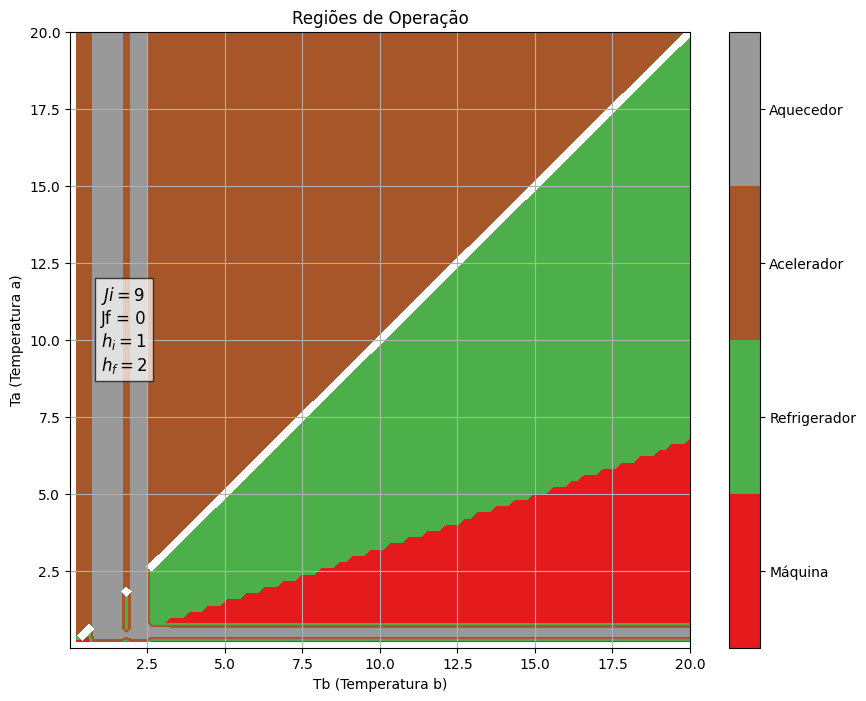

In [127]:
Ji = 0
Jf = 9
hi = 1
hf = 2
counterplot_Ciclo(Jf, Ji, hi, hf)

C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\580817547.py:24: RuntimeWarning: invalid value encountered in scalar divide
  eff = -(Wout + Win)/abs(Qin)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\580817547.py:24: RuntimeWarning: divide by zero encountered in scalar divide
  eff = -(Wout + Win)/abs(Qin)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1968221323.py:45: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  calculed_temperature_f = fsolve(lambda temperature_h: Temp(J, h, temperature_h, S_h), temperature_guess_h)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1311014051.py:57: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('Set1', 5)


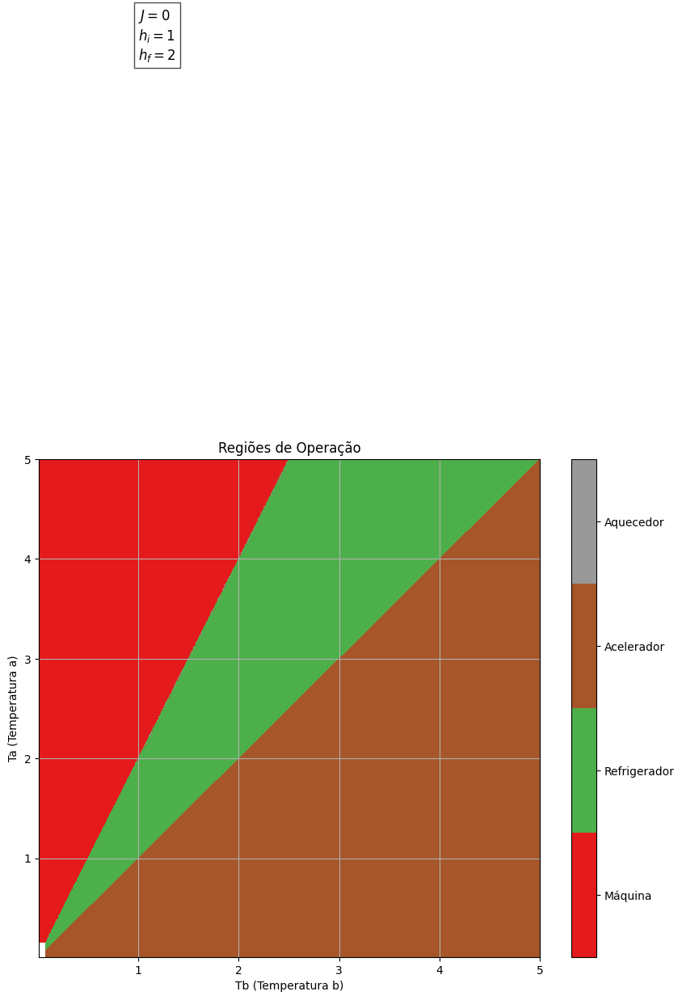

In [190]:
J = 0
hi = 1
hf = 2
counterplot_Ciclo(J, hi, hf)

C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1968221323.py:45: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  calculed_temperature_f = fsolve(lambda temperature_h: Temp(J, h, temperature_h, S_h), temperature_guess_h)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1968221323.py:31: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  calculed_temperature_c = fsolve(lambda temperature_c: Temp(J, h, temperature_c, S_c), temperature_guess_c)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1067972659.py:18: RuntimeWarning: overflow encountered in sinh
  numerador = (((-1) * ((J*np.exp(J/T)) + (2*h*np.sinh(h/T))))/T)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1067972659.py:4: RuntimeWarning: overflow encountered in cosh
  Z = 1 + 2*(np.cosh(h/T)) + np.exp(J/T)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1067972659.py:20: 

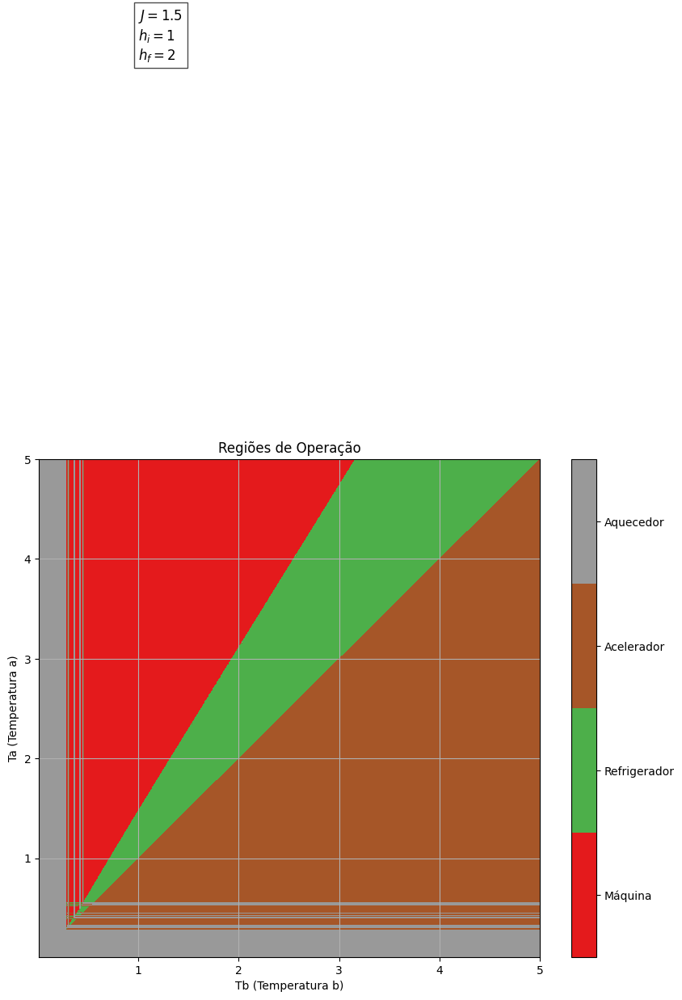

In [191]:
J = 1.5
hi = 1
hf = 2
counterplot_Ciclo(J, hi, hf)

C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1968221323.py:45: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  calculed_temperature_f = fsolve(lambda temperature_h: Temp(J, h, temperature_h, S_h), temperature_guess_h)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1067972659.py:18: RuntimeWarning: overflow encountered in exp
  numerador = (((-1) * ((J*np.exp(J/T)) + (2*h*np.sinh(h/T))))/T)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1067972659.py:18: RuntimeWarning: overflow encountered in sinh
  numerador = (((-1) * ((J*np.exp(J/T)) + (2*h*np.sinh(h/T))))/T)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1067972659.py:4: RuntimeWarning: overflow encountered in cosh
  Z = 1 + 2*(np.cosh(h/T)) + np.exp(J/T)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1067972659.py:4: RuntimeWarning: overflow encountered in exp
  Z = 1 + 2*(np.cosh(h/T)) + np.exp(J/T)
C:\Users\bolar\AppData\Local\Temp\ipyk

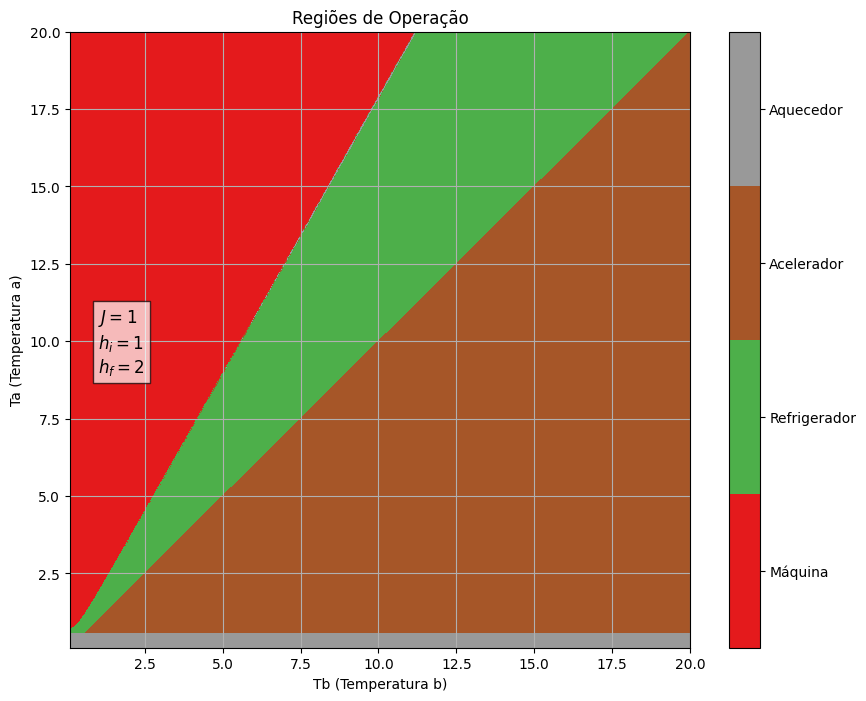

In [187]:
J = 1
hi = 1
hf = 2
counterplot_Ciclo(J, hi, hf)

C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1067972659.py:18: RuntimeWarning: overflow encountered in exp
  numerador = (((-1) * ((J*np.exp(J/T)) + (2*h*np.sinh(h/T))))/T)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1067972659.py:18: RuntimeWarning: overflow encountered in sinh
  numerador = (((-1) * ((J*np.exp(J/T)) + (2*h*np.sinh(h/T))))/T)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1067972659.py:4: RuntimeWarning: overflow encountered in cosh
  Z = 1 + 2*(np.cosh(h/T)) + np.exp(J/T)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1067972659.py:4: RuntimeWarning: overflow encountered in exp
  Z = 1 + 2*(np.cosh(h/T)) + np.exp(J/T)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1067972659.py:20: RuntimeWarning: invalid value encountered in divide
  S = (np.log(Z(J, h, T)) + (numerador / denominador))
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1968221323.py:45: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement fr

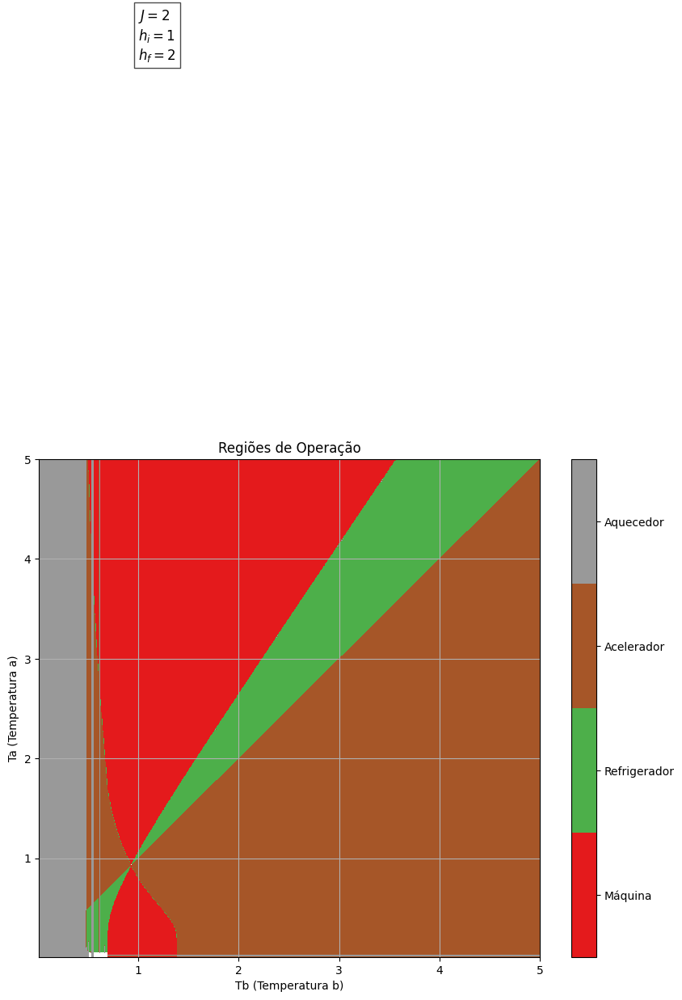

In [192]:
J = 2
hi = 1
hf = 2
counterplot_Ciclo(J, hi, hf)

C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1968221323.py:45: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  calculed_temperature_f = fsolve(lambda temperature_h: Temp(J, h, temperature_h, S_h), temperature_guess_h)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\645761713.py:57: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('Set1', 5)


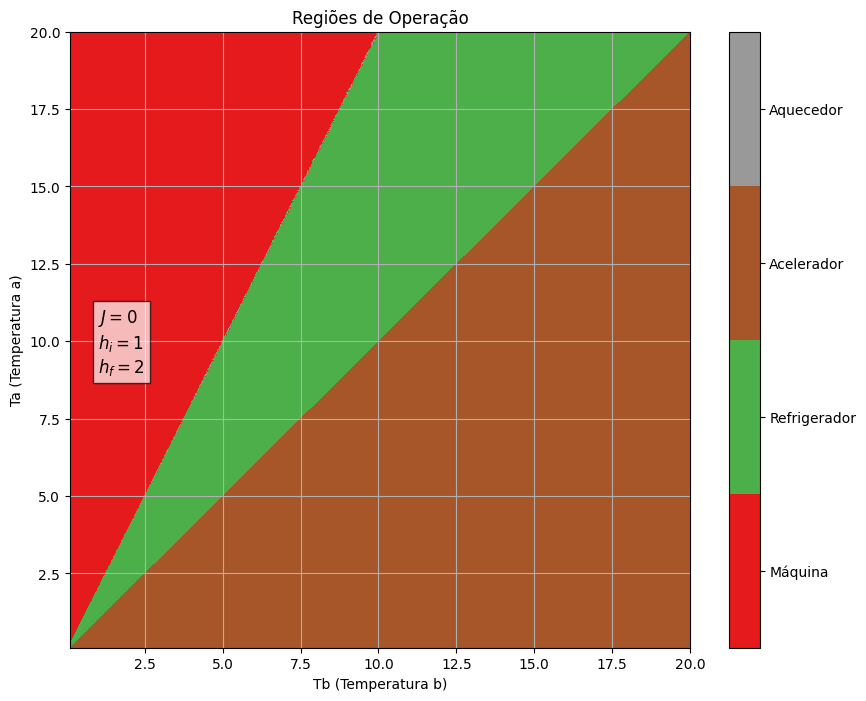

In [175]:
J = 0
hi = 1
hf = 2
counterplot_Ciclo(J, hi, hf)

C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1968221323.py:45: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  calculed_temperature_f = fsolve(lambda temperature_h: Temp(J, h, temperature_h, S_h), temperature_guess_h)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1067972659.py:18: RuntimeWarning: overflow encountered in exp
  numerador = (((-1) * ((J*np.exp(J/T)) + (2*h*np.sinh(h/T))))/T)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1067972659.py:18: RuntimeWarning: overflow encountered in sinh
  numerador = (((-1) * ((J*np.exp(J/T)) + (2*h*np.sinh(h/T))))/T)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1067972659.py:4: RuntimeWarning: overflow encountered in cosh
  Z = 1 + 2*(np.cosh(h/T)) + np.exp(J/T)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1067972659.py:4: RuntimeWarning: overflow encountered in exp
  Z = 1 + 2*(np.cosh(h/T)) + np.exp(J/T)
C:\Users\bolar\AppData\Local\Temp\ipyk

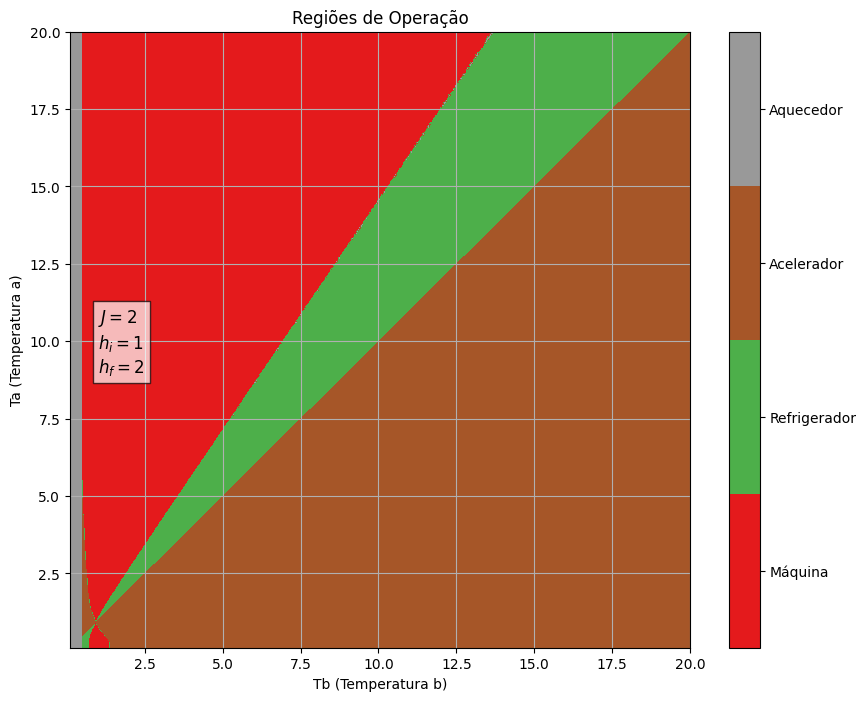

In [176]:
J = 2
hi = 1
hf = 2
counterplot_Ciclo(J, hi, hf)

C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1968221323.py:31: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  calculed_temperature_c = fsolve(lambda temperature_c: Temp(J, h, temperature_c, S_c), temperature_guess_c)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1968221323.py:45: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  calculed_temperature_f = fsolve(lambda temperature_h: Temp(J, h, temperature_h, S_h), temperature_guess_h)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\645761713.py:57: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('Set1', 5)


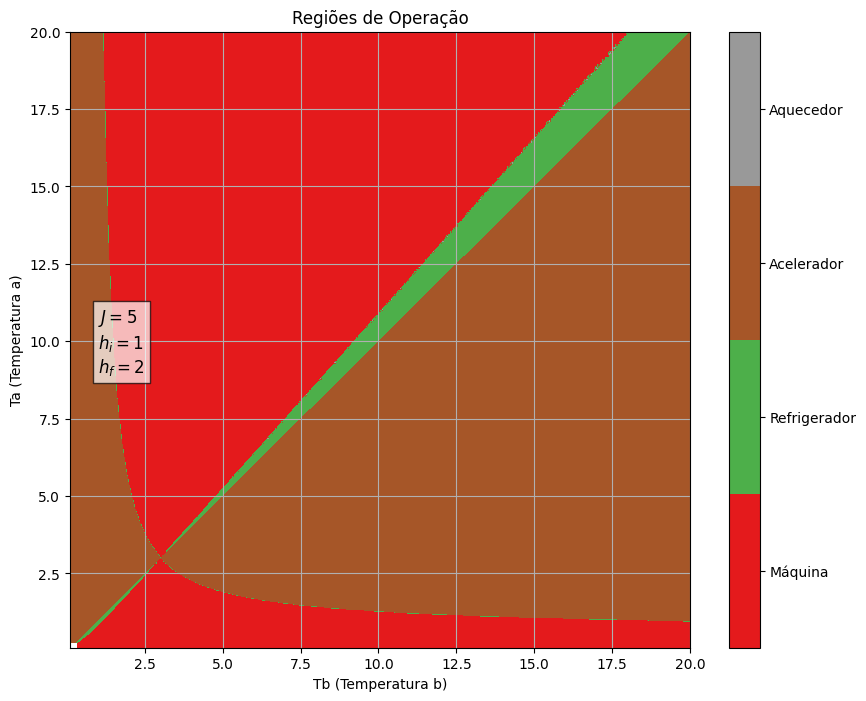

In [177]:
J = 5
hi = 1
hf = 2
counterplot_Ciclo(J, hi, hf)

C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\580817547.py:24: RuntimeWarning: invalid value encountered in scalar divide
  eff = -(Wout + Win)/abs(Qin)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1968221323.py:31: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  calculed_temperature_c = fsolve(lambda temperature_c: Temp(J, h, temperature_c, S_c), temperature_guess_c)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1968221323.py:45: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  calculed_temperature_f = fsolve(lambda temperature_h: Temp(J, h, temperature_h, S_h), temperature_guess_h)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\580817547.py:24: RuntimeWarning: divide by zero encountered in scalar divide
  eff = -(Wout + Win)/abs(Qin)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\645761713.py:57: MatplotlibDeprecat

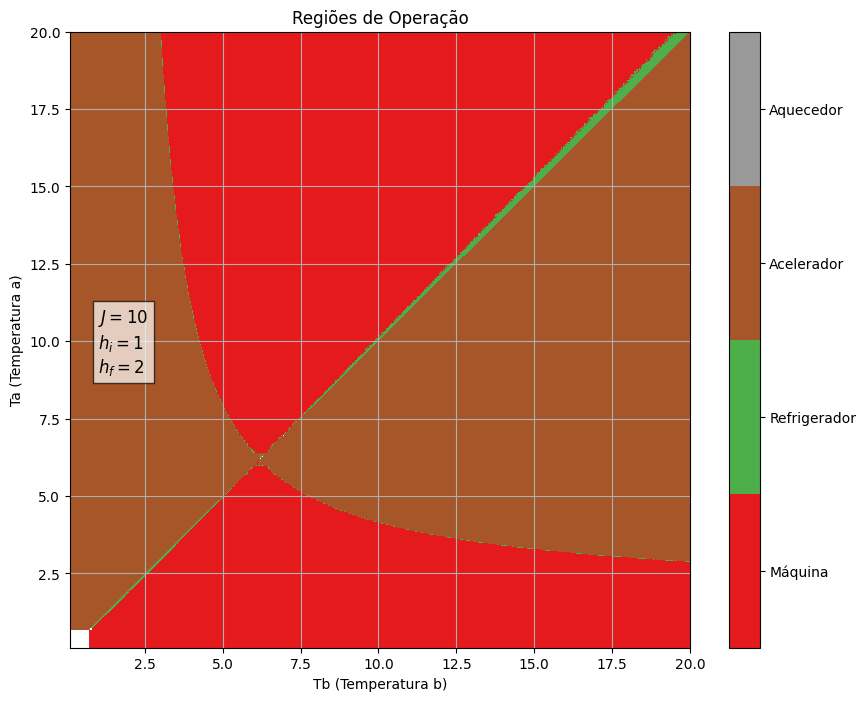

In [178]:
J = 10
hi = 1
hf = 2
counterplot_Ciclo(J, hi, hf)

C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\580817547.py:24: RuntimeWarning: invalid value encountered in scalar divide
  eff = -(Wout + Win)/abs(Qin)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\580817547.py:24: RuntimeWarning: divide by zero encountered in scalar divide
  eff = -(Wout + Win)/abs(Qin)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1968221323.py:31: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  calculed_temperature_c = fsolve(lambda temperature_c: Temp(J, h, temperature_c, S_c), temperature_guess_c)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1968221323.py:45: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  calculed_temperature_f = fsolve(lambda temperature_h: Temp(J, h, temperature_h, S_h), temperature_guess_h)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\645761713.py:57: MatplotlibDeprecat

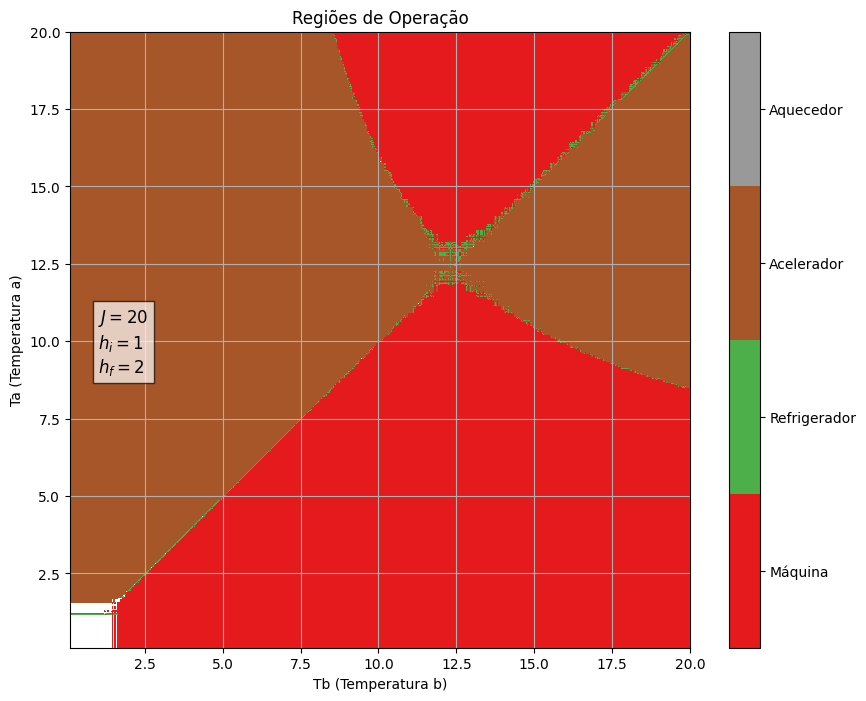

In [179]:
J = 20
hi = 1
hf = 2
counterplot_Ciclo(J, hi, hf)

C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1968221323.py:31: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  calculed_temperature_c = fsolve(lambda temperature_c: Temp(J, h, temperature_c, S_c), temperature_guess_c)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1968221323.py:45: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  calculed_temperature_f = fsolve(lambda temperature_h: Temp(J, h, temperature_h, S_h), temperature_guess_h)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\645761713.py:57: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('Set1', 5)


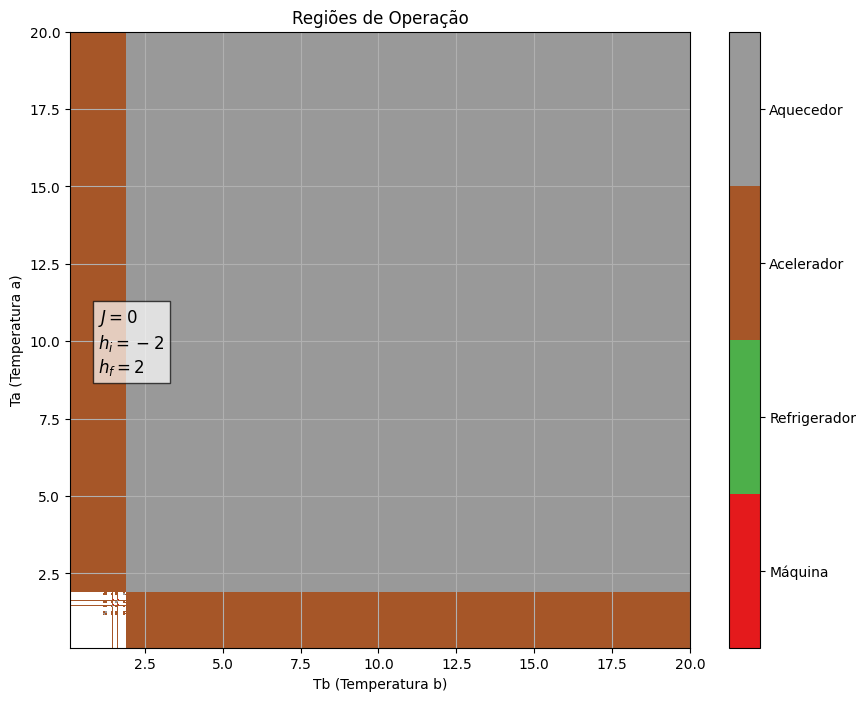

In [180]:
J = 0
hi = -2
hf = 2
counterplot_Ciclo(J, hi, hf)

C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1968221323.py:31: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  calculed_temperature_c = fsolve(lambda temperature_c: Temp(J, h, temperature_c, S_c), temperature_guess_c)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1067972659.py:18: RuntimeWarning: overflow encountered in sinh
  numerador = (((-1) * ((J*np.exp(J/T)) + (2*h*np.sinh(h/T))))/T)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1067972659.py:4: RuntimeWarning: overflow encountered in cosh
  Z = 1 + 2*(np.cosh(h/T)) + np.exp(J/T)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1067972659.py:20: RuntimeWarning: invalid value encountered in divide
  S = (np.log(Z(J, h, T)) + (numerador / denominador))
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1067972659.py:20: RuntimeWarning: invalid value encountered in scalar divide
  S = (np.log(Z(J, h, T)) + (numerador / denominador))
C:\Users\bo

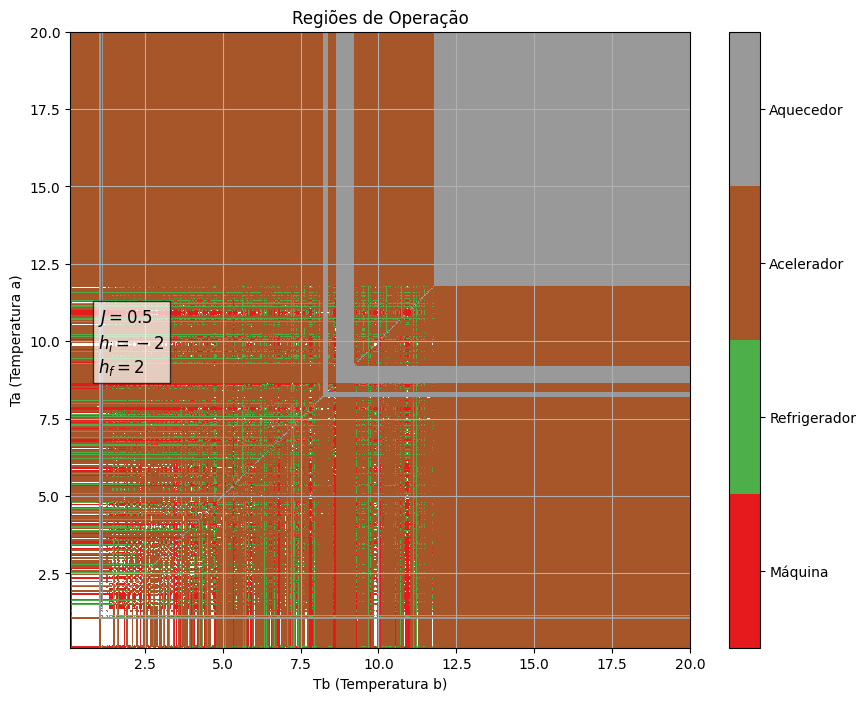

In [181]:
J = 0.5
hi = -2
hf = 2
counterplot_Ciclo(J, hi, hf)

C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1968221323.py:31: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  calculed_temperature_c = fsolve(lambda temperature_c: Temp(J, h, temperature_c, S_c), temperature_guess_c)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\580817547.py:24: RuntimeWarning: invalid value encountered in scalar divide
  eff = -(Wout + Win)/abs(Qin)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1968221323.py:45: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  calculed_temperature_f = fsolve(lambda temperature_h: Temp(J, h, temperature_h, S_h), temperature_guess_h)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\645761713.py:57: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.g

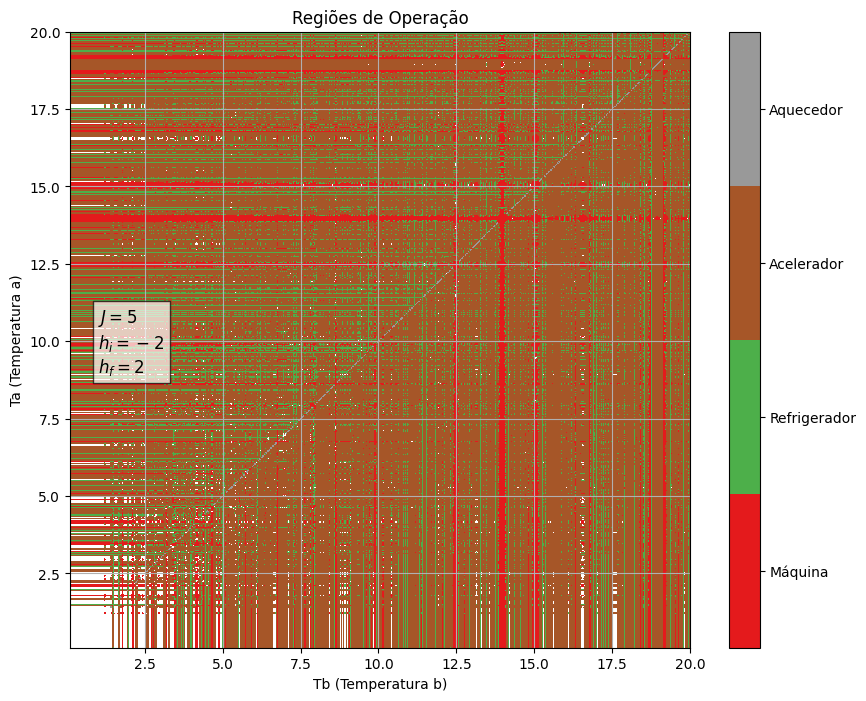

In [182]:
J = 5
hi = -2
hf = 2
counterplot_Ciclo(J, hi, hf)

C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\580817547.py:24: RuntimeWarning: invalid value encountered in scalar divide
  eff = -(Wout + Win)/abs(Qin)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1968221323.py:31: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  calculed_temperature_c = fsolve(lambda temperature_c: Temp(J, h, temperature_c, S_c), temperature_guess_c)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\580817547.py:24: RuntimeWarning: divide by zero encountered in scalar divide
  eff = -(Wout + Win)/abs(Qin)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1968221323.py:45: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  calculed_temperature_f = fsolve(lambda temperature_h: Temp(J, h, temperature_h, S_h), temperature_guess_h)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\645761713.py:57: MatplotlibDeprecat

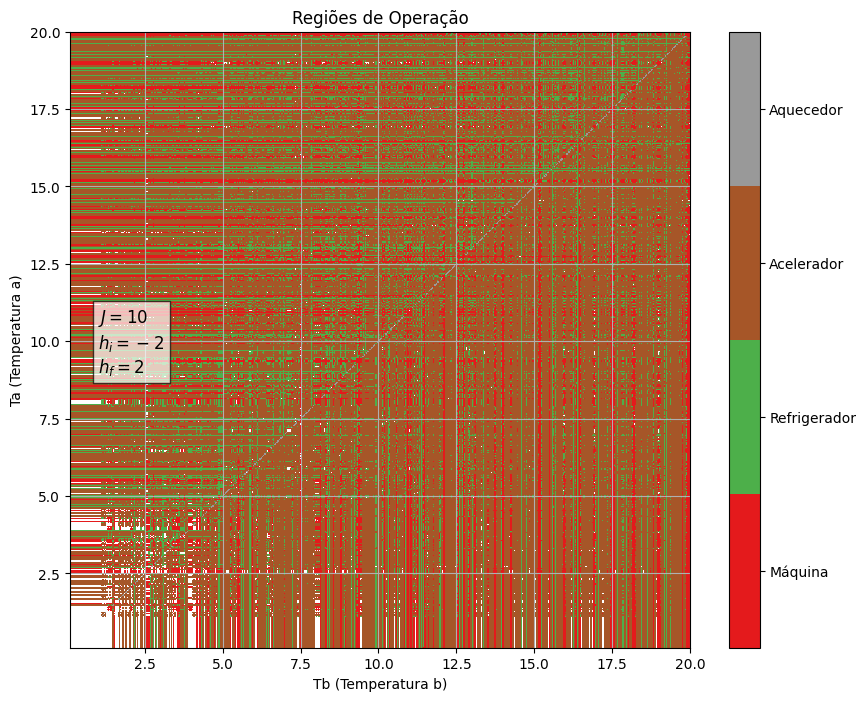

In [183]:
J = 10
hi = -2
hf = 2
counterplot_Ciclo(J, hi, hf)

C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\580817547.py:24: RuntimeWarning: invalid value encountered in scalar divide
  eff = -(Wout + Win)/abs(Qin)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\580817547.py:24: RuntimeWarning: divide by zero encountered in scalar divide
  eff = -(Wout + Win)/abs(Qin)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1968221323.py:31: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  calculed_temperature_c = fsolve(lambda temperature_c: Temp(J, h, temperature_c, S_c), temperature_guess_c)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\1968221323.py:45: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  calculed_temperature_f = fsolve(lambda temperature_h: Temp(J, h, temperature_h, S_h), temperature_guess_h)
C:\Users\bolar\AppData\Local\Temp\ipykernel_30600\645761713.py:57: MatplotlibDeprecat

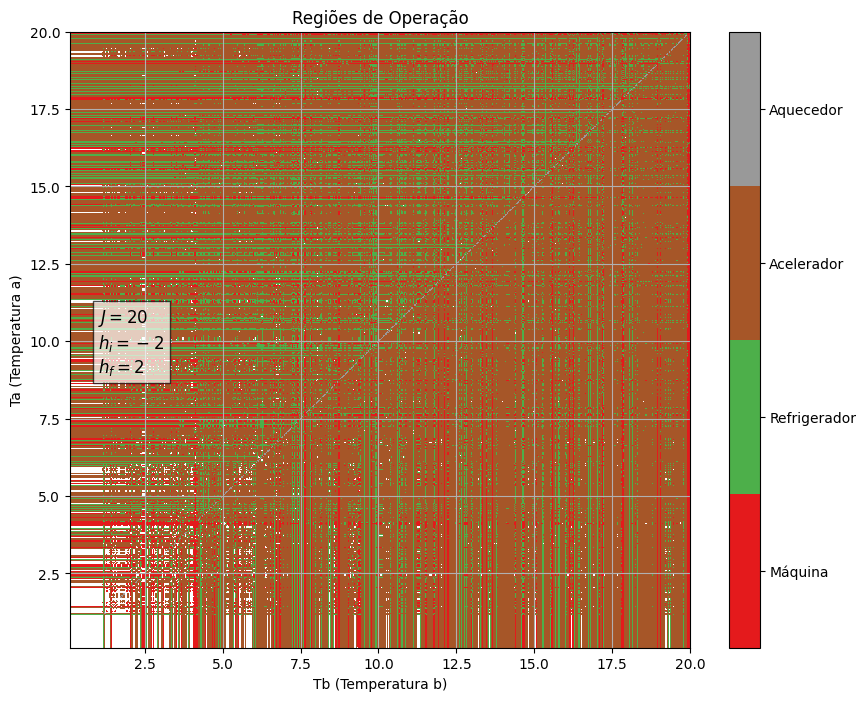

In [184]:
J = 20
hi = -2
hf = 2
counterplot_Ciclo(J, hi, hf)

-----------------

Aqui a ideia é plotar o Ciclo de Otto em um gráfico SxM e ver ele rodando ao contrário

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_ciclo_M(Ji, Jf, hi, hf, Tc, Th):
    [h_values_i, T_values_i, M_values_i, S_values_i, temperature_guess_c, h_values_f, T_values_f, M_values_f, S_values_f, temperature_guess_h, T_heating_values, S_values_heating, M_values_heating, T_cooling_values, S_values_cooling, M_values_cooling, J_values_i, J_values_f] = calcula_T_ciclo(Ji, Jf, hi, hf, Tc, Th)

    

    # Plotando a magnetização para o ciclo de Otto
    plt.plot(M_values_i, S_values_i, label='Ida (hi -> hf)', marker='>')
    plt.plot(M_values_f, S_values_f, label='Volta (hf -> hi)', marker='<')
    plt.plot(M_values_heating, S_values_heating, label='Aquecimento (Th)', marker='o') 
    plt.plot(M_values_cooling, S_values_cooling, label='Resfriamento (Tc)', marker='x')

    plt.xlabel('Magnetização M')
    plt.ylabel('Entropia S')
    plt.title(f'Ciclo de Otto: Magnetização (Ji={Ji}, Jf={Jf}, hi={hi}, hf={hf}, Tc={Tc}, Th={Th})')
    plt.grid(True)
    plt.legend()
    plt.show()

    

In [144]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def plot_P1P2P3P4_T(ax, J_values, h_values, T_values):
    
    #[h_values, T_values, M_values, S_values, temperature_guess] = calcula_T(J, hi, hf, T)
    
    
    
    P1_values = P1(J_values, h_values, T_values)
    P2_values = P2(J_values, h_values, T_values)
    P3_values = P3(J_values, h_values, T_values)
    P4_values = P4(J_values, h_values, T_values)

    plt.figure(figsize=(10, 6))

    plt.plot(T_values, P1_values, label='P1(T)')
    plt.plot(T_values, P2_values, label='P2(T)')
    plt.plot(T_values, P3_values, label='P3(T)')
    plt.plot(T_values, P4_values, label='P4(T)')

    plt.xlabel('T (Temperatura)')
    plt.ylabel('Probabilidade')
    plt.title('Probabilidades P1 = +h, P2 = 0, P3 = -h e P4 = -J em função de T')

    plt.legend()
    plt.grid(True)
    
    
def plot_P1P2P3P4_h(ax, J_values, h_values, T_values):


    P1_values = P1(J_values, h_values, T_values)
    P2_values = P2(J_values, h_values, T_values)
    P3_values = P3(J_values, h_values, T_values)
    P4_values = P4(J_values, h_values, T_values)


    plt.figure(figsize=(10, 6)) # Define o tamanho da figura do gráfico

    plt.plot(h_values, P1_values, label='P1(h)')
    plt.plot(h_values, P2_values, label='P2(h)')
    plt.plot(h_values, P3_values, label='P3(h)')
    plt.plot(h_values, P4_values, label='P4(h)')

    plt.xlabel('h')
    plt.ylabel('Probabilidade')
    plt.title('Probabilidades P1 = +h, P2 = 0, P3 = -h e P4 = -J em função de h')

    plt.legend()

    plt.grid(True)

    

def plot_P1P2P3P4_3D(ax, J_values, h_values, T_values):
    H, T_grid = np.meshgrid(h_values, T_values)

    # Calcular os valores das funções para cada ponto na grade
    # Cada P_values será uma matriz 2D correspondente à grade (H, T_grid)
    P1_values_3d = P1(J_values, H, T_grid)
    P2_values_3d = P2(J_values, H, T_grid)
    P3_values_3d = P3(J_values, H, T_grid)
    P4_values_3d = P4(J_values, H, T_grid)

    # Configurar e plotar o gráfico 3D
    fig = plt.figure(figsize=(12, 10)) # Define o tamanho da figura
    ax = fig.add_subplot(111, projection='3d') # Adiciona um subplot 3D

    # Plotar cada função como uma superfície 3D
    # 'alpha' controla a transparência da superfície
    ax.plot_surface(H, T_grid, P1_values_3d, cmap='viridis', alpha=0.7, label='P1(h, T)')
    ax.plot_surface(H, T_grid, P2_values_3d, cmap='plasma', alpha=0.7, label='P2(h, T)')
    ax.plot_surface(H, T_grid, P3_values_3d, cmap='cividis', alpha=0.7, label='P3(h, T)')
    ax.plot_surface(H, T_grid, P4_values_3d, cmap='magma', alpha=0.7, label='P4(h, T)')

    # Adicionar rótulos aos eixos e título ao gráfico
    ax.set_xlabel('h')
    ax.set_ylabel('T (Temperatura)')
    ax.set_zlabel('Probabilidade')
    ax.set_title('Probabilidades P1, P2, P3 e P4 em função de h e T')

    # Para a legenda funcionar corretamente em 3D, é preciso um pequeno truque:
    # Criar proxies para as legendas, pois plot_surface não as adiciona diretamente
    from matplotlib.lines import Line2D
    handles = [Line2D([0], [0], linestyle="none", c=plt.cm.viridis(0.5), marker='s', markersize=10, label='P1(h, T)'),
            Line2D([0], [0], linestyle="none", c=plt.cm.plasma(0.5), marker='s', markersize=10, label='P2(h, T)'),
            Line2D([0], [0], linestyle="none", c=plt.cm.cividis(0.5), marker='s', markersize=10, label='P3(h, T)'),
            Line2D([0], [0], linestyle="none", c=plt.cm.magma(0.5), marker='s', markersize=10, label='P4(h, T)')]
    ax.legend(handles=handles)

def all_plots_Population(J_values, h_values, T_values):
    """
    Gera uma única figura contendo os três gráficos lado a lado.
    """
    # Cria uma figura e 3 subplots em uma linha (1 linha, 3 colunas)
    # A projeção '3d' é especificada apenas para o terceiro subplot.
    fig = plt.figure(figsize=(24, 8)) # Tamanho da figura ajustado para caber 3 gráficos

    # Primeiro subplot (Px vs T)
    ax1 = fig.add_subplot(1, 3, 1)
    plot_P1P2P3P4_T(ax1, J_values, h_values, T_values)

    # Segundo subplot (Px vs h)
    ax2 = fig.add_subplot(1, 3, 2)
    plot_P1P2P3P4_h(ax2, J_values, h_values, T_values)

    # Terceiro subplot (Px vs h e T em 3D)
    ax3 = fig.add_subplot(1, 3, 3, projection='3d')
    plot_P1P2P3P4_3D(ax3, J_values, h_values, T_values)

    plt.tight_layout(pad=3.0) # Ajusta automaticamente o espaçamento entre os subplots
    plt.suptitle('Análise das Probabilidades Px para Diferentes Níveis de Energia', fontsize=16, y=1.03) # Título geral
    plt.show()

In [164]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.lines import Line2D # Importação necessária para a legenda 3D



def plot_P1P2P3P4_T(ax, J_values, h_values, T_values, marker):
    """
    Plota as probabilidades Px em função da Temperatura (T) em um dado eixo.
    Recebe 'ax' (Axes object) como primeiro argumento.
    """

    P1_values = P1(J_values, h_values, T_values)
    P2_values = P2(J_values, h_values, T_values)
    P3_values = P3(J_values, h_values, T_values)
    P4_values = P4(J_values, h_values, T_values)

    ax.plot(T_values, P1_values, label='P1(T): +h', marker=marker)
    ax.plot(T_values, P2_values, label='P2(T): 0', marker=marker)
    ax.plot(T_values, P3_values, label='P3(T): -h', marker=marker)
    ax.plot(T_values, P4_values, label='P4(T): -J', marker=marker)

    ax.set_xlabel('T (Temperatura)')
    ax.set_ylabel('Probabilidade')
    ax.set_title('P vs T') # Título mais curto para subplot

    ax.legend()
    ax.grid(True)


def plot_P1P2P3P4_h(ax, J_values, h_values, T_values, marker):
    """
    Plota as probabilidades Px em função de h em um dado eixo.
    Recebe 'ax' (Axes object) como primeiro argumento.
    """
    P1_values = P1(J_values, h_values, T_values)
    P2_values = P2(J_values, h_values, T_values)
    P3_values = P3(J_values, h_values, T_values)
    P4_values = P4(J_values, h_values, T_values)

    ax.plot(h_values, P1_values, label='P1(h): +h', marker=marker)
    ax.plot(h_values, P2_values, label='P2(h): 0', marker=marker)
    ax.plot(h_values, P3_values, label='P3(h): -h', marker=marker)
    ax.plot(h_values, P4_values, label='P4(h)> -J', marker=marker)

    ax.set_xlabel('h')
    ax.set_ylabel('Probabilidade')
    ax.set_title('P vs h') # Título mais curto para subplot

    ax.legend()
    ax.grid(True)


def plot_P1P2P3P4_3D(ax, J_values, h_values, T_values):
    """
    Plota as probabilidades Px em função de h e T em 3D em um dado eixo.
    Recebe 'ax' (Axes3D object) como primeiro argumento.
    """
    J = J_values  # J é um valor fixo ou uma lista de valores, dependendo do contexto
    H, T_grid = np.meshgrid(h_values, T_values)

    # Calcular os valores das funções para cada ponto na grade
    P1_values_3d = P1(J, H, T_grid)
    P2_values_3d = P2(J, H, T_grid)
    P3_values_3d = P3(J, H, T_grid)
    P4_values_3d = P4(J, H, T_grid)

    # Plotar cada função como uma superfície 3D
    ax.plot_surface(H, T_grid, P1_values_3d, cmap='viridis', alpha=0.7)
    ax.plot_surface(H, T_grid, P2_values_3d, cmap='plasma', alpha=0.7)
    ax.plot_surface(H, T_grid, P3_values_3d, cmap='cividis', alpha=0.7)
    ax.plot_surface(H, T_grid, P4_values_3d, cmap='magma', alpha=0.7)

    # Adicionar rótulos aos eixos e título ao gráfico
    ax.set_xlabel('h')
    ax.set_ylabel('T (Temperatura)')
    ax.set_zlabel('Probabilidade')
    ax.set_title('P vs h e T (3D)') # Título mais curto

    # Legenda para 3D (a mesma lógica, mas com handles para o subplot 3D)
    handles = [Line2D([0], [0], linestyle="none", c=plt.cm.viridis(0.5), marker='s', markersize=10, label='P1(h, T): +h'),
               Line2D([0], [0], linestyle="none", c=plt.cm.plasma(0.5), marker='s', markersize=10, label='P2(h, T): 0'),
               Line2D([0], [0], linestyle="none", c=plt.cm.cividis(0.5), marker='s', markersize=10, label='P3(h, T): -h'),
               Line2D([0], [0], linestyle="none", c=plt.cm.magma(0.5), marker='s', markersize=10, label='P4(h, T): -J')]
    ax.legend(handles=handles, loc='upper left', bbox_to_anchor=(0.7, 0.9)) # Ajuste a localização da legenda se necessário


# --- FUNÇÃO PRINCIPAL PARA GERAR A IMAGEM COM OS TRÊS GRÁFICOS ---
def generate_all_plots_in_one_figure(J_values, h_values, T_values, marker, titulo):
    """
    Gera uma única figura contendo os três gráficos lado a lado.
    """
    # Cria uma figura e 3 subplots em uma linha (1 linha, 3 colunas)
    # A projeção '3d' é especificada apenas para o terceiro subplot.
    fig = plt.figure(figsize=(24, 8)) # Tamanho da figura ajustado para caber 3 gráficos

    # Primeiro subplot (Px vs T)
    ax1 = fig.add_subplot(1, 3, 1)
    plot_P1P2P3P4_T(ax1, J_values, h_values, T_values, marker)

    # Segundo subplot (Px vs h)
    ax2 = fig.add_subplot(1, 3, 2)
    plot_P1P2P3P4_h(ax2, J_values, h_values, T_values, marker)

    # Terceiro subplot (Px vs h e T em 3D)
    ax3 = fig.add_subplot(1, 3, 3, projection='3d')
    plot_P1P2P3P4_3D(ax3, J_values, h_values, T_values)

    plt.tight_layout(pad=3.0) # Ajusta automaticamente o espaçamento entre os subplots
    plt.suptitle(titulo, fontsize=16, y=1.03) # Título geral
    plt.show()



In [166]:
def plot_M_on_ax(ax, Ji, Jf, hi, hf, T_values_cold, T_values_hot):
    """
    Plota Magnetização (M) vs. Temperatura (T) para múltiplos J e h em um dado eixo.
    """


    # Calcular os valores de M para cada T_value
    # Use T_values de forma direta, não recalculado com linspace aqui
    M_values_cold = [magnetizacao(Ji, hi, T) for T in T_values_cold]
    ax.plot(T_values_cold, M_values_cold, label=f"Ji={Ji}, h={hi}", marker='>')

    M_values_hot = [magnetizacao(Jf, hf, T) for T in T_values_hot]
    ax.plot(T_values_hot, M_values_hot, label=f"Jf={Jf}, h={hf}", marker='<')



    ax.set_xlabel('T (Temperatura)')
    ax.set_ylabel('M (Magnetização)')
    ax.set_title('Magnetização vs. T')
    ax.grid(True)
    ax.legend(title='Parâmetros', loc='best', fontsize='small') # Adicionado título à legenda


def plot_S_on_ax(ax, Ji, Jf, hi, hf, T_values_cold, T_values_hot):
    """
    Plota Entropia (S) vs. Temperatura (T) para múltiplos J e h em um dado eixo.
    """

    S_values_cold = [entropia(Ji, hi, T) for T in T_values_cold]
    ax.plot(T_values_cold, S_values_cold, label=f"Ji={Ji}, h={hi}", marker='>')

    S_values_hot = [entropia(Jf, hf, T) for T in T_values_hot]
    ax.plot(T_values_hot, S_values_hot, label=f"Jf={Ji}, h={hf}", marker='<')

 
    ax.set_xlabel('T (Temperatura)')
    ax.set_ylabel('S (Entropia)')
    ax.set_title('Entropia vs. T')
    ax.grid(True)
    ax.legend(title='Parâmetros', loc='best', fontsize='small')


def plot_U_on_ax(ax, Ji, Jf, hi , hf, T_values_cold, T_values_hot):
    """
    Plota Energia Média (U) vs. Temperatura (T) para múltiplos J e h em um dado eixo.
    """


    U_values_cold = [energia_Media(Ji, hi, T) for T in T_values_cold]
    ax.plot(T_values_cold, U_values_cold, label=f"Ji={Ji}, h={hi}", marker='>')

    U_values_hot = [energia_Media(Jf, hf, T) for T in T_values_hot]
    ax.plot(T_values_hot, U_values_hot, label=f"Jf={Jf}, h={hf}", marker='<')

    ax.set_xlabel('T (Temperatura)')
    ax.set_ylabel('U (Energia Média)')
    ax.set_title('Energia Média vs. T')
    ax.grid(True)
    ax.legend(title='Parâmetros', loc='best', fontsize='small')


# --- FUNÇÃO PRINCIPAL PARA GERAR A IMAGEM COM OS TRÊS GRÁFICOS LADO A LADO ---

def generate_MSU_plots(Ji, Jf, hi, hf, Tc, Th):

    [h_values_i, T_values_i, M_values_i, S_values_i, temperature_guess_c, h_values_f, T_values_f, M_values_f, S_values_f, temperature_guess_h, T_heating_values, S_values_heating, M_values_heating, T_cooling_values, S_values_cooling, M_values_cooling, J_values_i, J_valeus_f] = calcula_T_ciclo(Ji, Jf, hi, hf, Tc, Th)
    
    Tc_add = temperature_guess_c
    Th_add = temperature_guess_h

    """
    Gera uma única figura contendo os gráficos de Magnetização, Entropia e Energia Média
    em função da Temperatura, lado a lado.
    
    Args:
        J (float or list/array): Valor(es) do parâmetro J.
        h (float or list/array): Valor(es) do parâmetro h.
        Tc (float): Temperatura inicial (corte inferior do intervalo de T).
        Th (float): Temperatura final (corte superior do intervalo de T).
    """
    # Garante que Tc e Th definem o range de T_values para todos os gráficos
    # O seu código original usava np.linspace(0.01, T, 200) onde T era Th,
    # mas o primeiro gráfico usava Tc e Th. Ajustei para ser consistente.
    T_values_cold = np.linspace(Tc, Tc_add, 20)
    T_values_hot = np.linspace(Th, Th_add, 20)

    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 6)) # 1 linha, 3 colunas

    # Chama cada função de plotagem, passando o eixo apropriado e os valores de J, h, T
    plot_M_on_ax(ax1, Ji, Jf, hi, hf, T_values_cold, T_values_hot)
    plot_S_on_ax(ax2, Ji, Jf, hi, hf, T_values_cold, T_values_hot)
    plot_U_on_ax(ax3, Ji, Jf, hi, hf, T_values_cold, T_values_hot)

    #plt.tight_layout(pad=3.0) # Ajusta o layout para evitar sobreposição
    plt.suptitle('Magnetização, Entropia e Energia Média vs. Temperatura', fontsize=16, y=1.05) # Título geral
    plt.show()



In [149]:
import numpy as np
import matplotlib.pyplot as plt

def plot_populacao(Ji, Jf, hi, hf, Tc, Th):
    [h_values_i, T_values_i, M_values_i, S_values_i, temperature_guess_c, h_values_f, T_values_f, M_values_f, S_values_f, temperature_guess_h, T_heating_values, S_values_heating, M_values_heating, T_cooling_values, S_values_cooling, M_values_cooling, J_values_i, J_values_f] = calcula_T_ciclo(Ji, Jf, hi, hf, Tc, Th)
    
    print('------')
    print(f"T_values_(cold->add_cold) = : {T_values_i}")
    print('------')
    print(f"T_values_(hot->add_cold) = : {T_values_f}")
    print('------')   
    print(f"h_values_(i->f) = : {h_values_i}")
    print('------')
    print(f"h_values_(f->i) = : {h_values_f}")
    print('------')
    print(f"J_values_(i->f) = : {J_values_i}")
    print('------')
    print(f"J_values_(f->i) = : {J_values_f}")
    print('------')
    
    # Plotando a população no processo adiabático (hi -> hf)
    print(f"Ji = {Ji}, Jf = {Jf}, hi = {hi}, hf = {hf}, Tc = {Tc}, Th = {Th}")
    print(f"População no Processo Adiabático (hi->hf), onde hi: {hi} e hf: {hf}")
    titulo = "População no Processo Adiabático (hi->hf)"
    generate_all_plots_in_one_figure(J_values_i, h_values_i, T_values_i, '>', titulo)


    print(f"Ji = {Ji}, Jf = {Jf}, hi = {hi}, hf = {hf}, Tc = {Tc}, Th = {Th}")
    print(f"População no Processo adiabático (hf -> hi), onde hi{hi} e hf{hf}")
    titulo = "População no Processo adiabático (hf -> hi)"
    generate_all_plots_in_one_figure(J_values_f, h_values_f, T_values_f, '<', titulo)


Primeiro caso:
Ji = 0.8, Jf = 1.8, hi = 1, hf = 2, Tc = 1.2, Th = 2
T_heating = 2.4570463956792885
T_heating = 2.4062634628260344
T_heating = 2.35548052997278
T_heating = 2.304697597119526
T_heating = 2.2539146642662713
T_heating = 2.203131731413017
T_heating = 2.1523487985597627
T_heating = 2.1015658657065086
T_heating = 2.050782932853254
T_heating = 2.0
T_cooling = 0.9782413051834935
T_cooling = 1.0028811601631054
T_cooling = 1.0275210151427172
T_cooling = 1.052160870122329
T_cooling = 1.076800725101941
T_cooling = 1.1014405800815525
T_cooling = 1.1260804350611644
T_cooling = 1.1507202900407763
T_cooling = 1.175360145020388
T_cooling = 1.2
Refrigerador!
Eff?: 0.5112797812109736
Win: 0.7337342196, Wout: -0.6728437873, Qhot: -0.11909415262966205, Qcold: 0.058203720295392336, eff: -0.5112797814987275
T_heating = 2.4570463956792885
T_heating = 2.4062634628260344
T_heating = 2.35548052997278
T_heating = 2.304697597119526
T_heating = 2.2539146642662713
T_heating = 2.203131731413017
T_heati

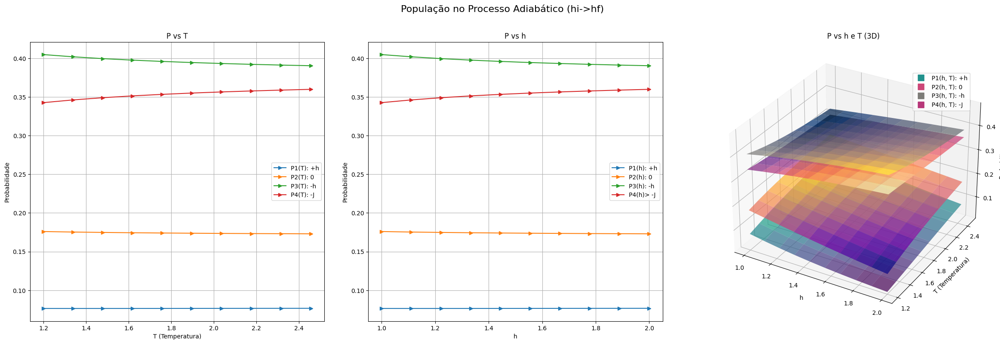

Ji = 0.8, Jf = 1.8, hi = 1, hf = 2, Tc = 1.2, Th = 2
População no Processo adiabático (hf -> hi), onde hi1 e hf2


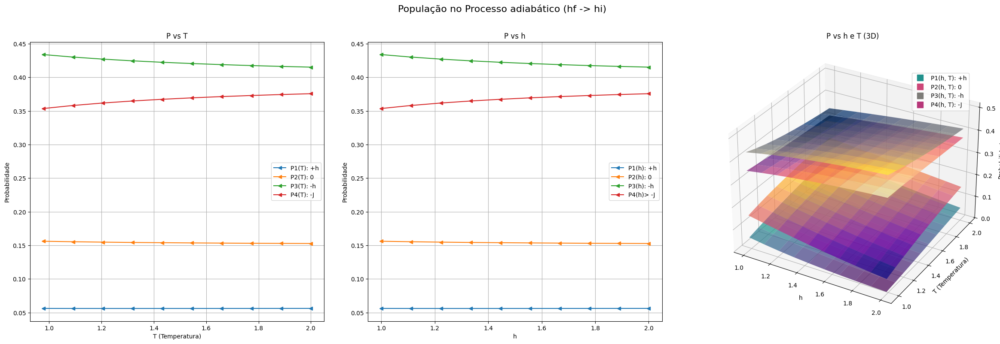

T_heating = 2.4570463956792885
T_heating = 2.4062634628260344
T_heating = 2.35548052997278
T_heating = 2.304697597119526
T_heating = 2.2539146642662713
T_heating = 2.203131731413017
T_heating = 2.1523487985597627
T_heating = 2.1015658657065086
T_heating = 2.050782932853254
T_heating = 2.0
T_cooling = 0.9782413051834935
T_cooling = 1.0028811601631054
T_cooling = 1.0275210151427172
T_cooling = 1.052160870122329
T_cooling = 1.076800725101941
T_cooling = 1.1014405800815525
T_cooling = 1.1260804350611644
T_cooling = 1.1507202900407763
T_cooling = 1.175360145020388
T_cooling = 1.2


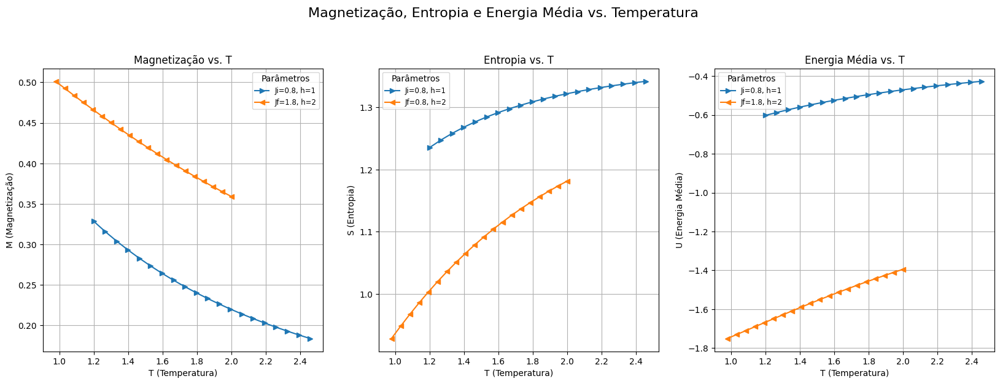

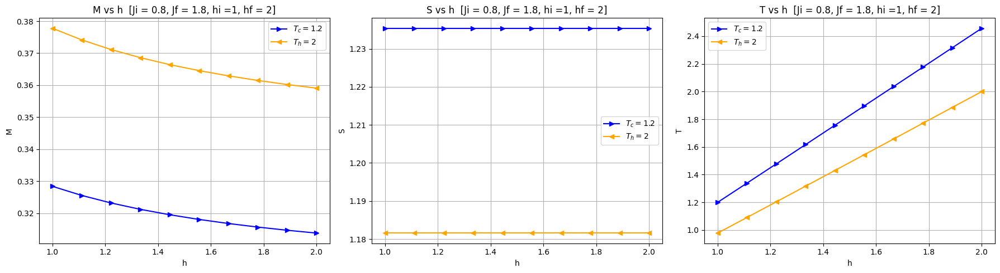

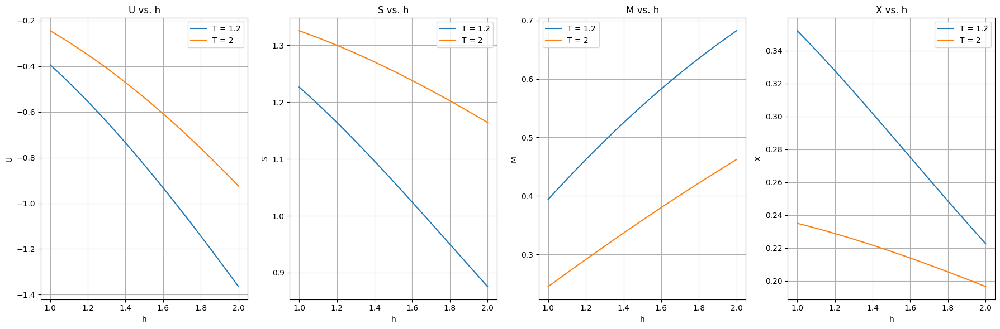

T_heating = 2.4570463956792885
T_heating = 2.4062634628260344
T_heating = 2.35548052997278
T_heating = 2.304697597119526
T_heating = 2.2539146642662713
T_heating = 2.203131731413017
T_heating = 2.1523487985597627
T_heating = 2.1015658657065086
T_heating = 2.050782932853254
T_heating = 2.0
T_cooling = 0.9782413051834935
T_cooling = 1.0028811601631054
T_cooling = 1.0275210151427172
T_cooling = 1.052160870122329
T_cooling = 1.076800725101941
T_cooling = 1.1014405800815525
T_cooling = 1.1260804350611644
T_cooling = 1.1507202900407763
T_cooling = 1.175360145020388
T_cooling = 1.2


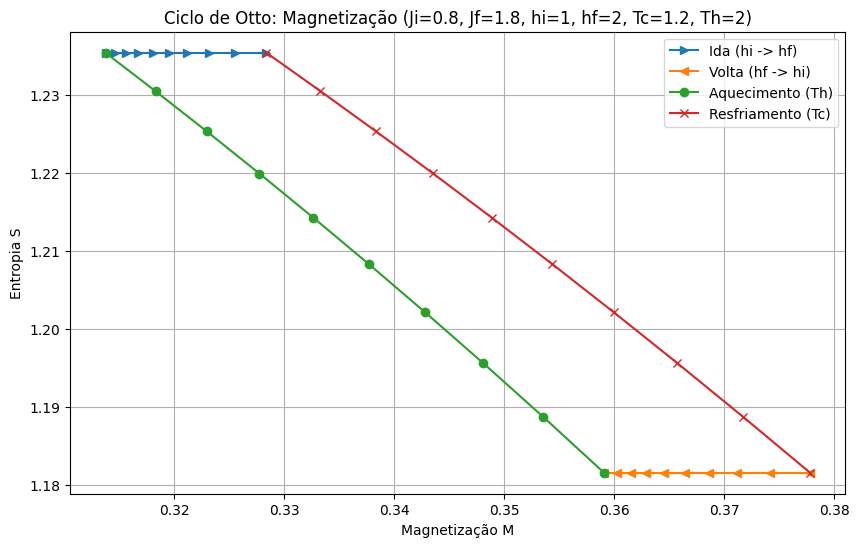

Segundo caso:
Ji = 2,Jf = 4 , hi = 1, hf = 2, Tc = 1.2, Th = 2
T_heating = 2.4000000000754147
T_heating = 2.355555555622591
T_heating = 2.311111111169767
T_heating = 2.2666666667169433
T_heating = 2.2222222222641195
T_heating = 2.1777777778112952
T_heating = 2.1333333333584714
T_heating = 2.0888888889056476
T_heating = 2.044444444452824
T_heating = 2.0
T_cooling = 1.000000000039855
T_cooling = 1.022222222257649
T_cooling = 1.0444444444754428
T_cooling = 1.0666666666932367
T_cooling = 1.0888888889110306
T_cooling = 1.1111111111288243
T_cooling = 1.1333333333466182
T_cooling = 1.1555555555644121
T_cooling = 1.177777777782206
T_cooling = 1.2
Refrigerador!
Eff?: 0.49999999999241673
Win: 1.4926527346, Wout: -1.3793210742, Qhot: -0.22666332080343787, Qcold: 0.11333166035761888, eff: -0.5000000001945619
T_heating = 2.4000000000754147
T_heating = 2.355555555622591
T_heating = 2.311111111169767
T_heating = 2.2666666667169433
T_heating = 2.2222222222641195
T_heating = 2.1777777778112952
T_heatin

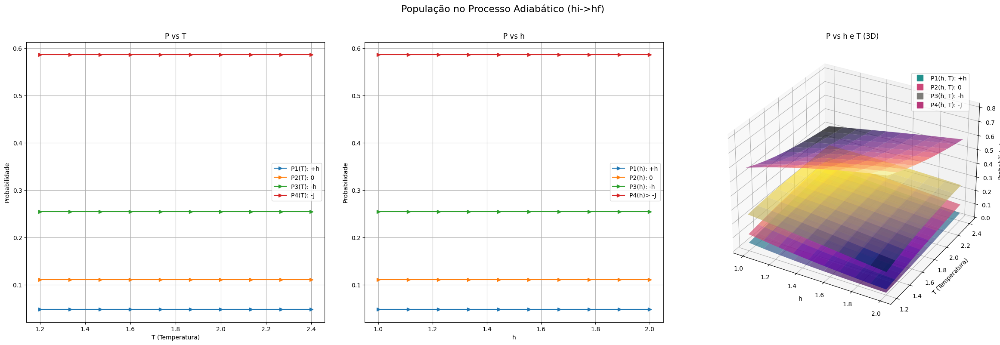

Ji = 2, Jf = 4, hi = 1, hf = 2, Tc = 1.2, Th = 2
População no Processo adiabático (hf -> hi), onde hi1 e hf2


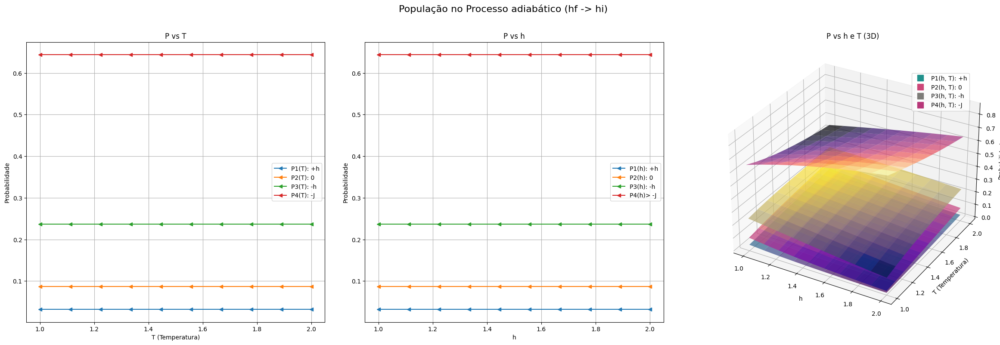

T_heating = 2.4000000000754147
T_heating = 2.355555555622591
T_heating = 2.311111111169767
T_heating = 2.2666666667169433
T_heating = 2.2222222222641195
T_heating = 2.1777777778112952
T_heating = 2.1333333333584714
T_heating = 2.0888888889056476
T_heating = 2.044444444452824
T_heating = 2.0
T_cooling = 1.000000000039855
T_cooling = 1.022222222257649
T_cooling = 1.0444444444754428
T_cooling = 1.0666666666932367
T_cooling = 1.0888888889110306
T_cooling = 1.1111111111288243
T_cooling = 1.1333333333466182
T_cooling = 1.1555555555644121
T_cooling = 1.177777777782206
T_cooling = 1.2


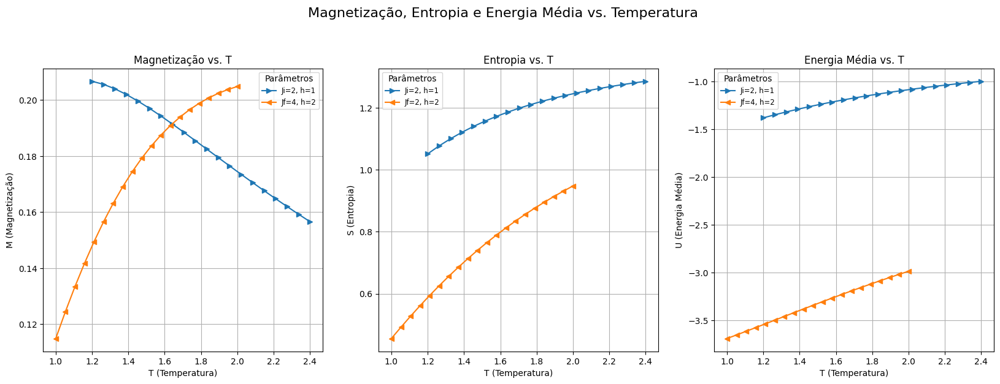

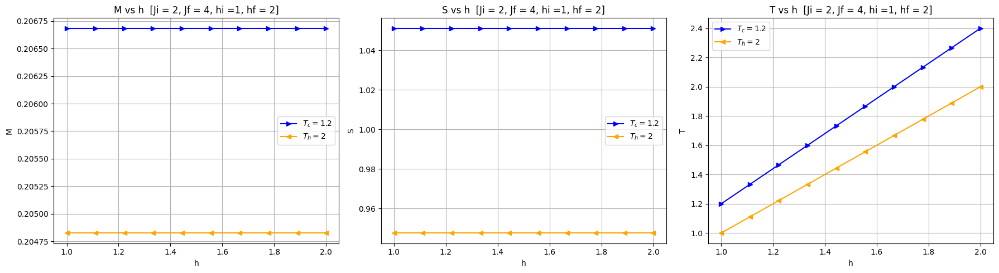

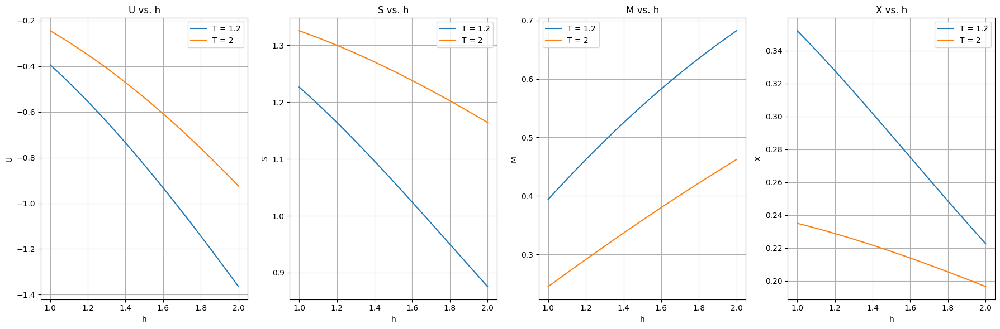

T_heating = 2.4000000000754147
T_heating = 2.355555555622591
T_heating = 2.311111111169767
T_heating = 2.2666666667169433
T_heating = 2.2222222222641195
T_heating = 2.1777777778112952
T_heating = 2.1333333333584714
T_heating = 2.0888888889056476
T_heating = 2.044444444452824
T_heating = 2.0
T_cooling = 1.000000000039855
T_cooling = 1.022222222257649
T_cooling = 1.0444444444754428
T_cooling = 1.0666666666932367
T_cooling = 1.0888888889110306
T_cooling = 1.1111111111288243
T_cooling = 1.1333333333466182
T_cooling = 1.1555555555644121
T_cooling = 1.177777777782206
T_cooling = 1.2


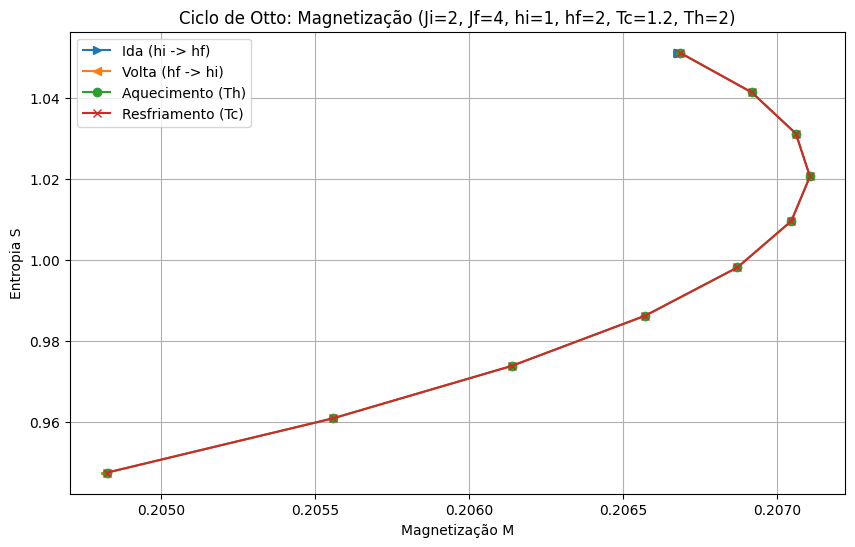

Terceiro caso:
Ji = 1.85,Jf = 9 , hi = 1, hf = 2, Tc = 0.5, Th = 3
T_heating = 2.9374894579832316
T_heating = 2.9444350737628726
T_heating = 2.9513806895425136
T_heating = 2.9583263053221542
T_heating = 2.9652719211017953
T_heating = 2.9722175368814363
T_heating = 2.9791631526610773
T_heating = 2.986108768440718
T_heating = 2.993054384220359
T_heating = 3.0
T_cooling = 0.5149999185095804
T_cooling = 0.5133332608974048
T_cooling = 0.5116666032852292
T_cooling = 0.5099999456730536
T_cooling = 0.508333288060878
T_cooling = 0.5066666304487024
T_cooling = 0.5049999728365268
T_cooling = 0.5033333152243512
T_cooling = 0.5016666576121755
T_cooling = 0.5
Máquina!
Eff?: 0.8290568072832253
Win: 6.1331134104, Wout: -6.1830687782, Qhot: 0.0602556632562985, Qcold: -0.010300295426372452, eff: 0.8290568077798657
T_heating = 2.9374894579832316
T_heating = 2.9444350737628726
T_heating = 2.9513806895425136
T_heating = 2.9583263053221542
T_heating = 2.9652719211017953
T_heating = 2.9722175368814363
T_heat

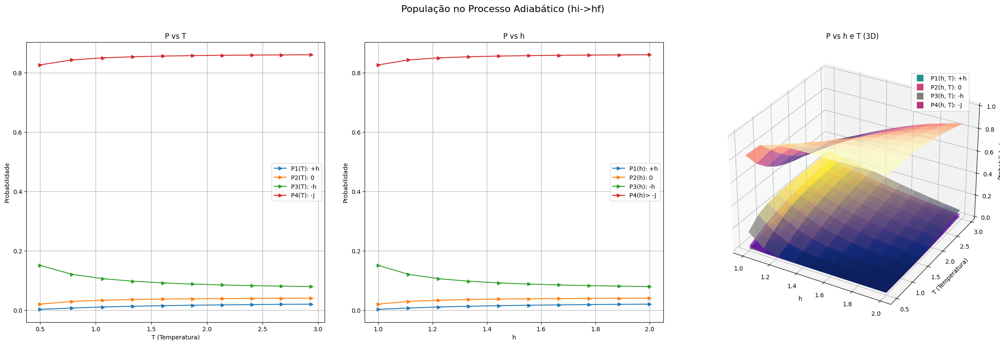

Ji = 1.85, Jf = 9, hi = 1, hf = 2, Tc = 0.5, Th = 3
População no Processo adiabático (hf -> hi), onde hi1 e hf2


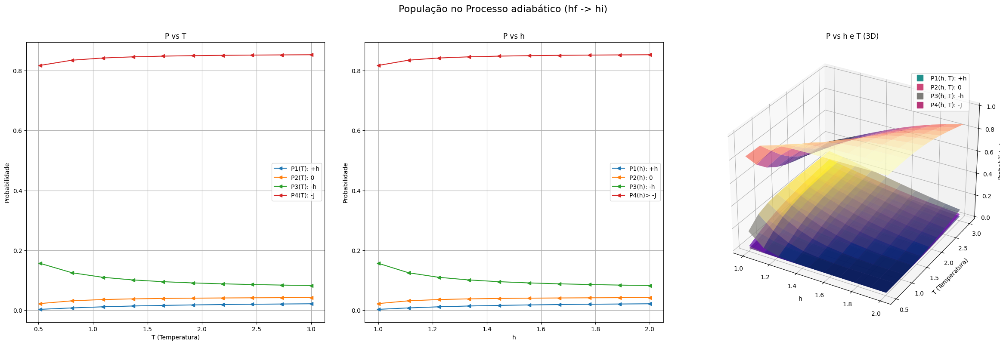

T_heating = 2.9374894579832316
T_heating = 2.9444350737628726
T_heating = 2.9513806895425136
T_heating = 2.9583263053221542
T_heating = 2.9652719211017953
T_heating = 2.9722175368814363
T_heating = 2.9791631526610773
T_heating = 2.986108768440718
T_heating = 2.993054384220359
T_heating = 3.0
T_cooling = 0.5149999185095804
T_cooling = 0.5133332608974048
T_cooling = 0.5116666032852292
T_cooling = 0.5099999456730536
T_cooling = 0.508333288060878
T_cooling = 0.5066666304487024
T_cooling = 0.5049999728365268
T_cooling = 0.5033333152243512
T_cooling = 0.5016666576121755
T_cooling = 0.5


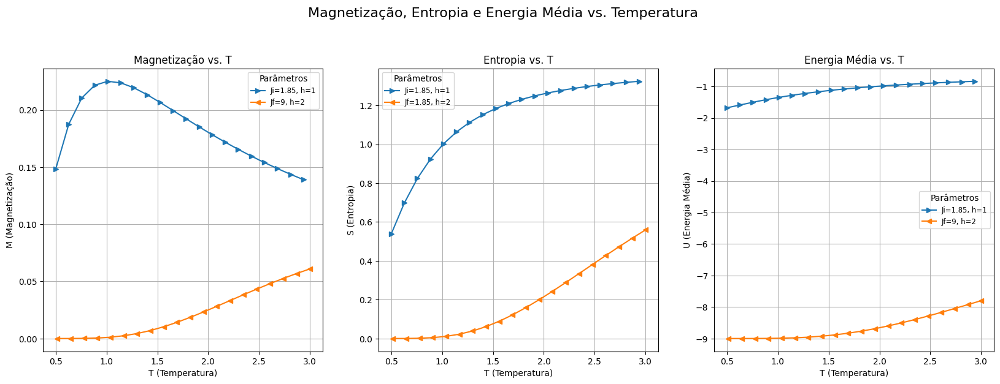

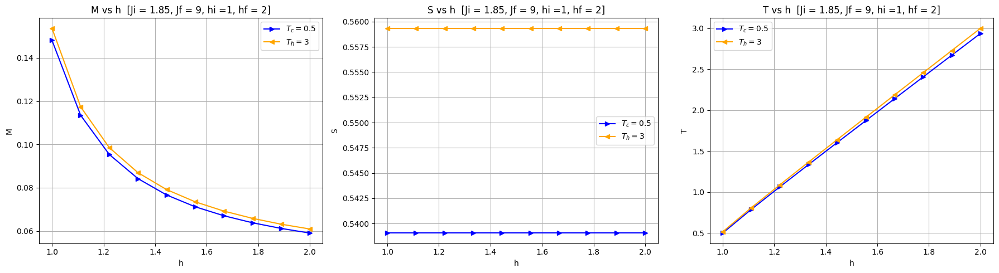

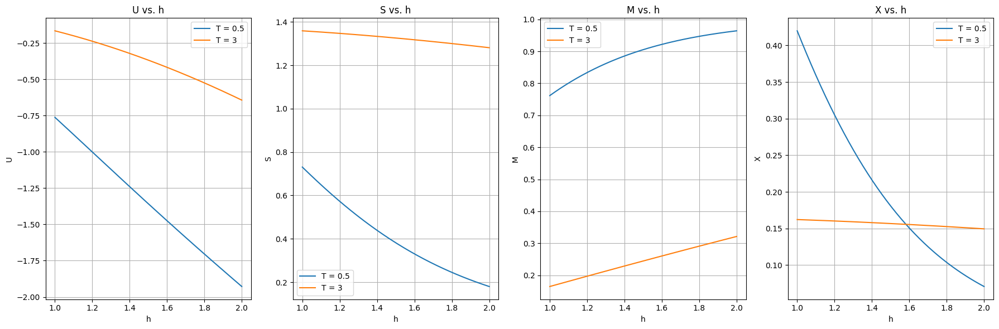

T_heating = 2.9374894579832316
T_heating = 2.9444350737628726
T_heating = 2.9513806895425136
T_heating = 2.9583263053221542
T_heating = 2.9652719211017953
T_heating = 2.9722175368814363
T_heating = 2.9791631526610773
T_heating = 2.986108768440718
T_heating = 2.993054384220359
T_heating = 3.0
T_cooling = 0.5149999185095804
T_cooling = 0.5133332608974048
T_cooling = 0.5116666032852292
T_cooling = 0.5099999456730536
T_cooling = 0.508333288060878
T_cooling = 0.5066666304487024
T_cooling = 0.5049999728365268
T_cooling = 0.5033333152243512
T_cooling = 0.5016666576121755
T_cooling = 0.5


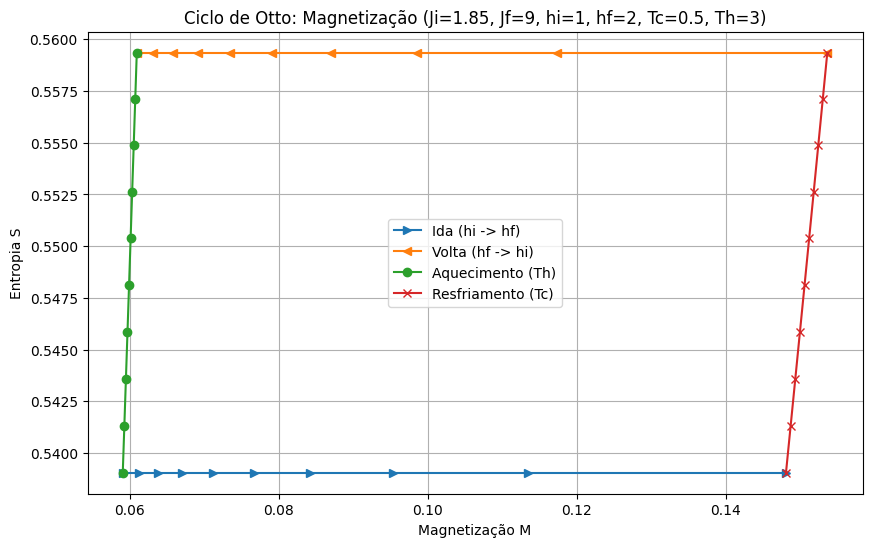

In [178]:
#primeiro caso:
print("Primeiro caso:")
Ji = 0.8
Jf = 1.8
hi = 1
hf = 2
Tc = 1.2
Th = 2
print(f"Ji = {Ji}, Jf = {Jf}, hi = {hi}, hf = {hf}, Tc = {Tc}, Th = {Th}")
engineOrWhat(Ji, Jf, hi, hf, Tc, Th)
plot_populacao(Ji, Jf, hi, hf, Tc, Th)
generate_MSU_plots(Ji, Jf, hi, hf, Tc, Th)
plot_BTeBSeBM_Spinning(Ji, Jf, hi, hf, Tc, [Th], calcula_T)
plot_FB_UB_SB_MB_XB(Ji, Jf, hi, hf, [Tc, Th])
plot_ciclo_M(Ji, Jf, hi, hf, Tc, Th)


#segundo caso:
print("Segundo caso:")
Ji = 2
Jf = 4
hi = 1
hf = 2
Tc = 1.2
Th = 2
print(f"Ji = {Ji},Jf = {Jf} , hi = {hi}, hf = {hf}, Tc = {Tc}, Th = {Th}")
engineOrWhat(Ji, Jf , hi, hf, Tc, Th)
plot_populacao(Ji, Jf, hi, hf, Tc, Th)
generate_MSU_plots(Ji, Jf, hi, hf, Tc, Th)
plot_BTeBSeBM_Spinning(Ji, Jf, hi, hf, Tc, [Th], calcula_T)
plot_FB_UB_SB_MB_XB(Ji, Jf, hi, hf, [Tc, Th])
plot_ciclo_M(Ji, Jf, hi, hf, Tc, Th)

#terceiro caso:
print("Terceiro caso:")
Ji = 1.85
Jf = 9
hi = 1
hf = 2
Tc = 0.5
Th = 3
print(f"Ji = {Ji},Jf = {Jf} , hi = {hi}, hf = {hf}, Tc = {Tc}, Th = {Th}")
engineOrWhat(Ji, Jf , hi, hf, Tc, Th)
plot_populacao(Ji, Jf, hi, hf, Tc, Th)
generate_MSU_plots(Ji, Jf, hi, hf, Tc, Th)
plot_BTeBSeBM_Spinning(Ji, Jf, hi, hf, Tc, [Th], calcula_T)
plot_FB_UB_SB_MB_XB(Ji, Jf, hi, hf, [Tc, Th])
plot_ciclo_M(Ji, Jf, hi, hf, Tc, Th)

Primeiro caso:
J = 0.8, hi = 1, hf = 2, Tc = 1.2, Th = 2
Refrigerador!
Eff?: 0.4913505349483241
Win: 0.4047843493, Wout: -0.3571113189, Qhot: -0.09702448050659773, Qcold: 0.049351450063102376, eff: -0.4913505353966163
------
T_values_(cold->add_cold) = : [1.2        1.31513769 1.43540249 1.55935951 1.6860136  1.81467323
 1.94485213 2.07620272 2.20847223 2.34147353]
------
T_values_(hot->add_cold) = : [2.         1.88433751 1.76928934 1.65502385 1.54177305 1.42986306
 1.31976185 1.21215368 1.10805308 1.00896612]
------
h_values_(i->f) = : [1.         1.11111111 1.22222222 1.33333333 1.44444444 1.55555556
 1.66666667 1.77777778 1.88888889 2.        ]
------
h_values_(f->i) = : [2.         1.88888889 1.77777778 1.66666667 1.55555556 1.44444444
 1.33333333 1.22222222 1.11111111 1.        ]
------
J = 0.8, hi = 1, hf = 2, Tc = 1.2, Th = 2
População no Processo Adiabático (hi->hf), onde hi: 1 e hf: 2


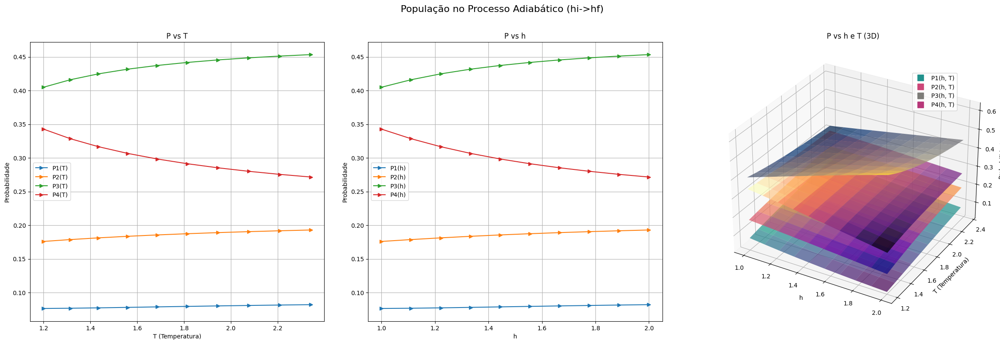

J = 0.8, hi = 1, hf = 2, Tc = 1.2, Th = 2
População no Processo adiabático (hf -> hi), onde hi1 e hf2


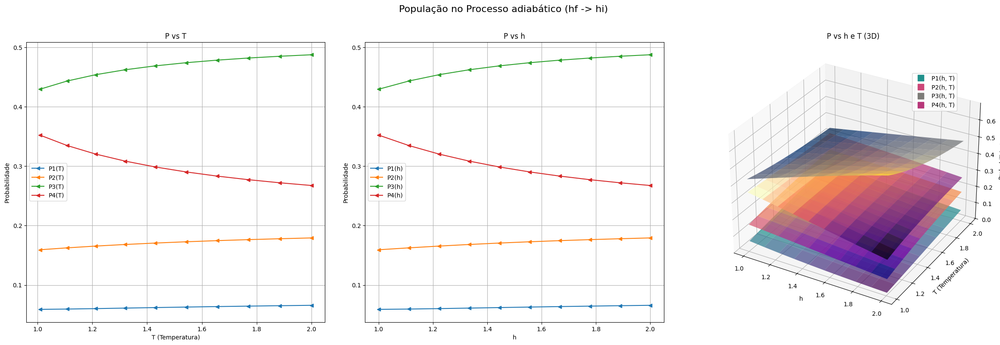

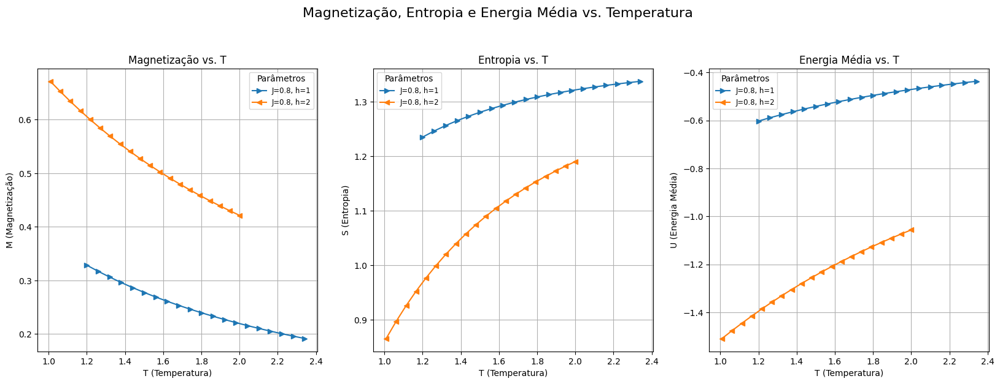

h_values: [1.         1.05263158 1.10526316 1.15789474 1.21052632 1.26315789
 1.31578947 1.36842105 1.42105263 1.47368421 1.52631579 1.57894737
 1.63157895 1.68421053 1.73684211 1.78947368 1.84210526 1.89473684
 1.94736842 2.        ]
h_values: [2.         1.94736842 1.89473684 1.84210526 1.78947368 1.73684211
 1.68421053 1.63157895 1.57894737 1.52631579 1.47368421 1.42105263
 1.36842105 1.31578947 1.26315789 1.21052632 1.15789474 1.10526316
 1.05263158 1.        ]


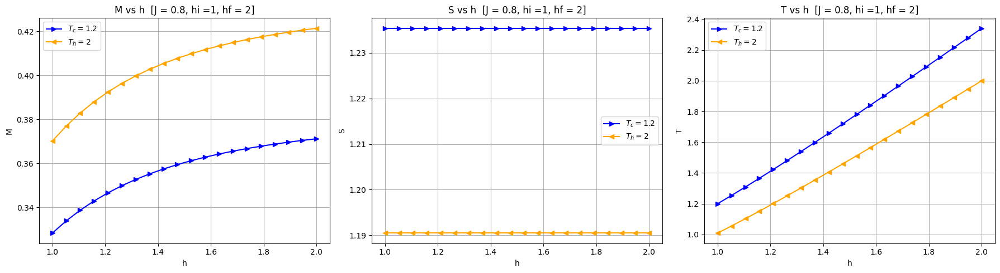

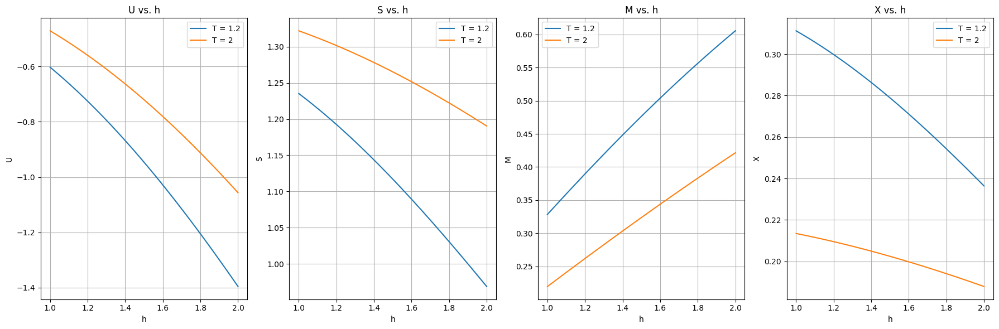

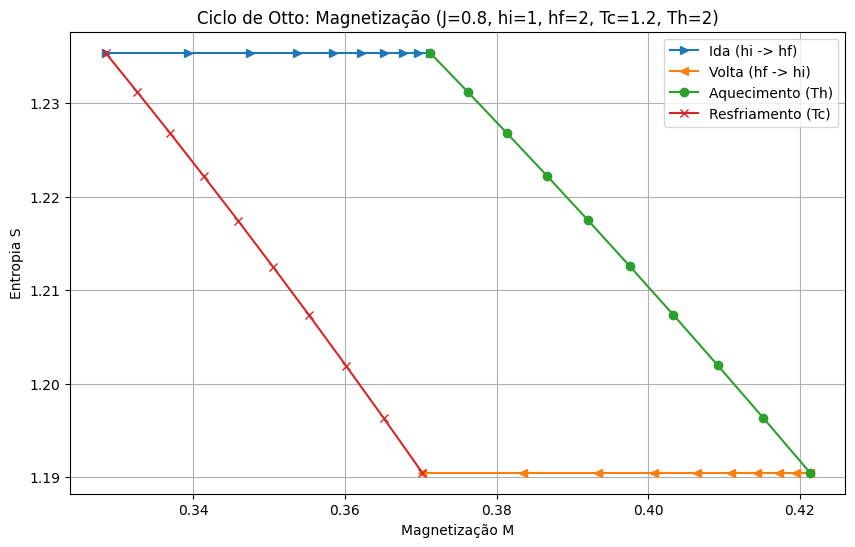

Segundo caso:
J = 2, hi = 1, hf = 2, Tc = 1.2, Th = 2
Máquina!
Eff?: 0.17881265440497257
Win: 0.2771165339, Wout: -0.313398201, Qhot: 0.20290324094082135, Qcold: -0.1666215738788177, eff: 0.17881265421770928
------
T_values_(cold->add_cold) = : [1.2        1.20422278 1.21097854 1.22106466 1.23536748 1.25479384
 1.28016238 1.31207346 1.35079925 1.39624014]
------
T_values_(hot->add_cold) = : [2.         1.92954044 1.86474524 1.80600551 1.75356364 1.70747662
 1.66760342 1.63362082 1.60506355 1.58137773]
------
h_values_(i->f) = : [1.         1.11111111 1.22222222 1.33333333 1.44444444 1.55555556
 1.66666667 1.77777778 1.88888889 2.        ]
------
h_values_(f->i) = : [2.         1.88888889 1.77777778 1.66666667 1.55555556 1.44444444
 1.33333333 1.22222222 1.11111111 1.        ]
------
J = 2, hi = 1, hf = 2, Tc = 1.2, Th = 2
População no Processo Adiabático (hi->hf), onde hi: 1 e hf: 2


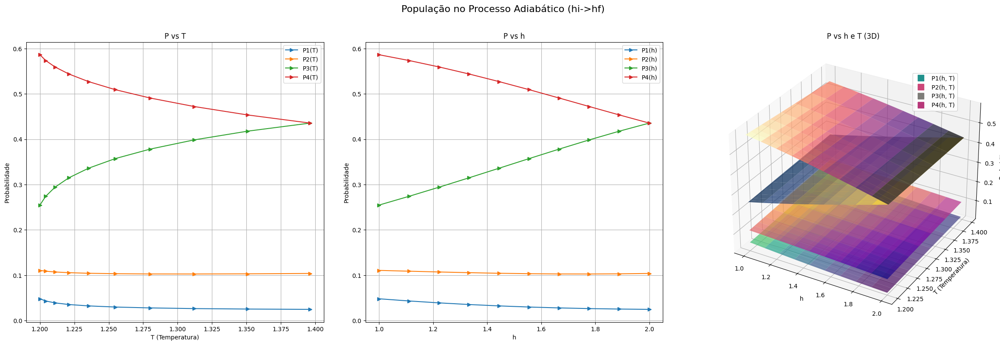

J = 2, hi = 1, hf = 2, Tc = 1.2, Th = 2
População no Processo adiabático (hf -> hi), onde hi1 e hf2


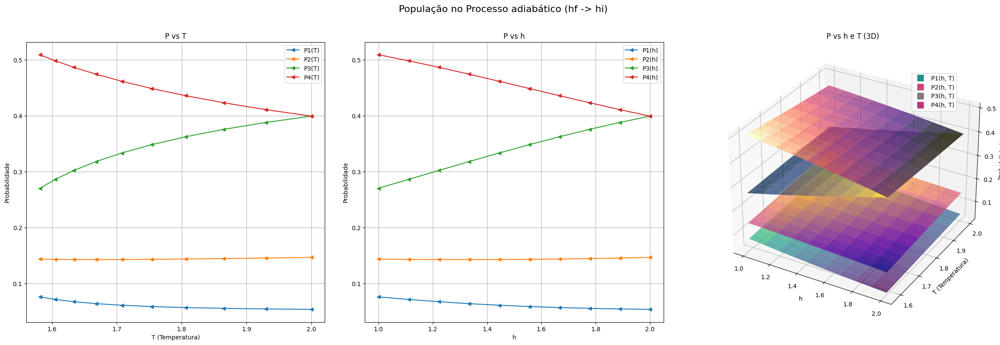

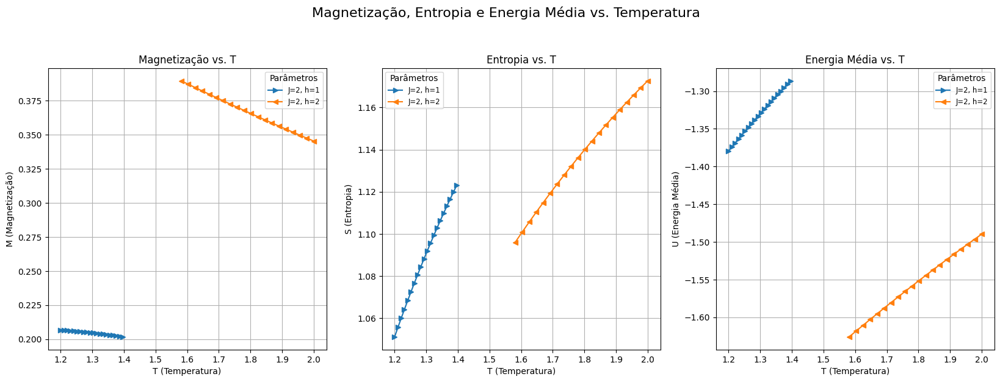

h_values: [1.         1.05263158 1.10526316 1.15789474 1.21052632 1.26315789
 1.31578947 1.36842105 1.42105263 1.47368421 1.52631579 1.57894737
 1.63157895 1.68421053 1.73684211 1.78947368 1.84210526 1.89473684
 1.94736842 2.        ]
h_values: [2.         1.94736842 1.89473684 1.84210526 1.78947368 1.73684211
 1.68421053 1.63157895 1.57894737 1.52631579 1.47368421 1.42105263
 1.36842105 1.31578947 1.26315789 1.21052632 1.15789474 1.10526316
 1.05263158 1.        ]


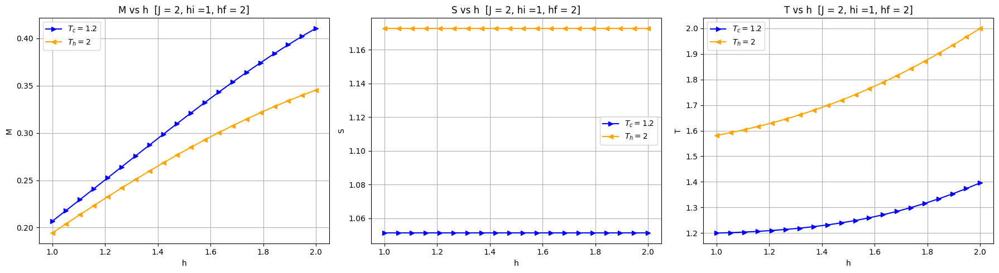

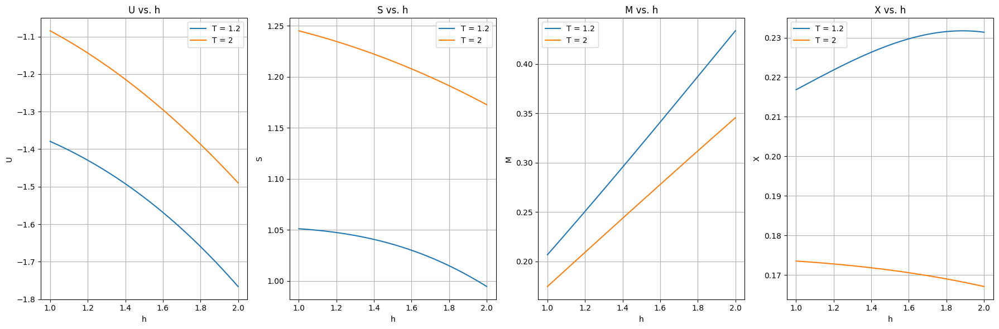

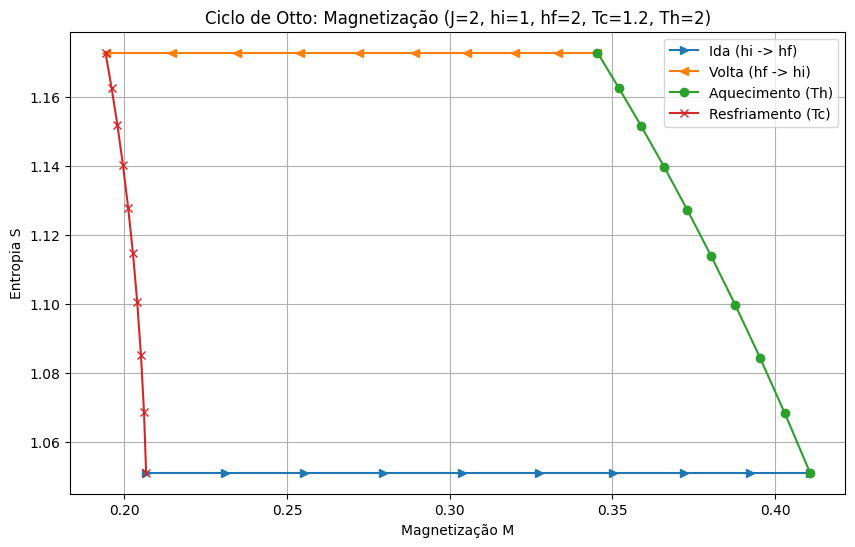

Terceiro caso:
J = 1, hi = 0.5, hf = 2, Tc = 0.05, Th = 1.5
Aquecedor!
Eff?: 1.1016914151949357
Win: 0.6200844519, Wout: 2.9998865557, Qhot: -3.2858302766745933, Qcold: -0.3341407309348676, eff: -1.1016914151978152
------
T_values_(cold->add_cold) = : [ 0.05        0.03333365  0.01666683 -0.09999905 -0.11666234 -0.13331971
 -0.14996637 -0.16659679 -0.18320533 -0.19978684]
------
T_values_(hot->add_cold) = : [1.5        1.3653122  1.23296368 1.10433467 0.98188649 0.87001413
 0.77583133 0.70741875 0.66711235 0.64805964]
------
h_values_(i->f) = : [0.5        0.66666667 0.83333333 1.         1.16666667 1.33333333
 1.5        1.66666667 1.83333333 2.        ]
------
h_values_(f->i) = : [2.         1.83333333 1.66666667 1.5        1.33333333 1.16666667
 1.         0.83333333 0.66666667 0.5       ]
------
J = 1, hi = 0.5, hf = 2, Tc = 0.05, Th = 1.5
População no Processo Adiabático (hi->hf), onde hi: 0.5 e hf: 2


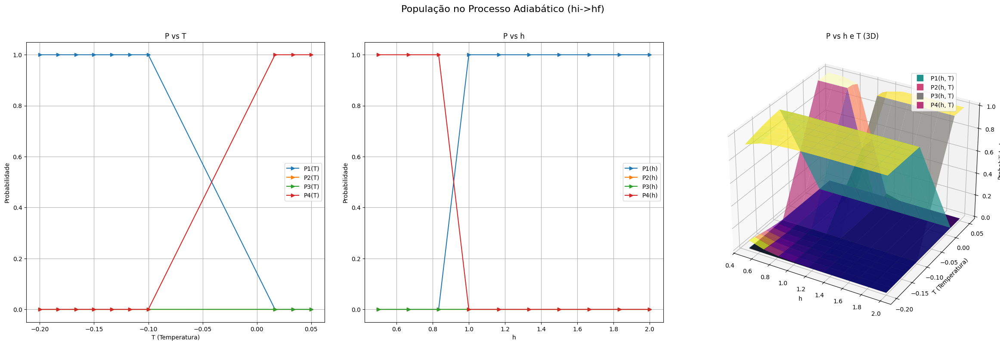

J = 1, hi = 0.5, hf = 2, Tc = 0.05, Th = 1.5
População no Processo adiabático (hf -> hi), onde hi0.5 e hf2


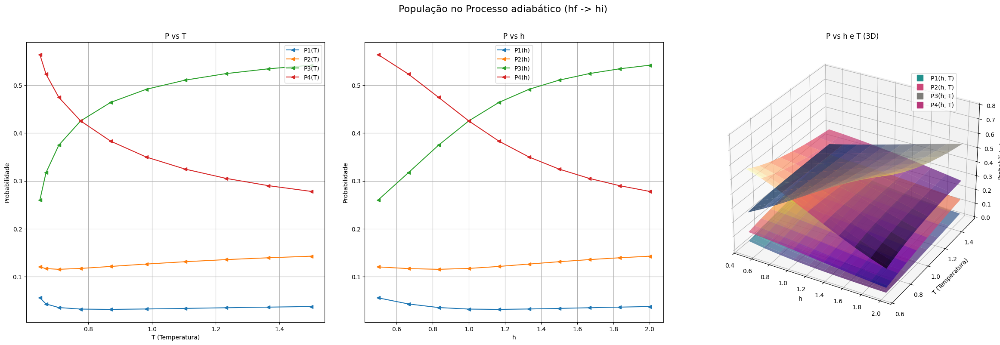

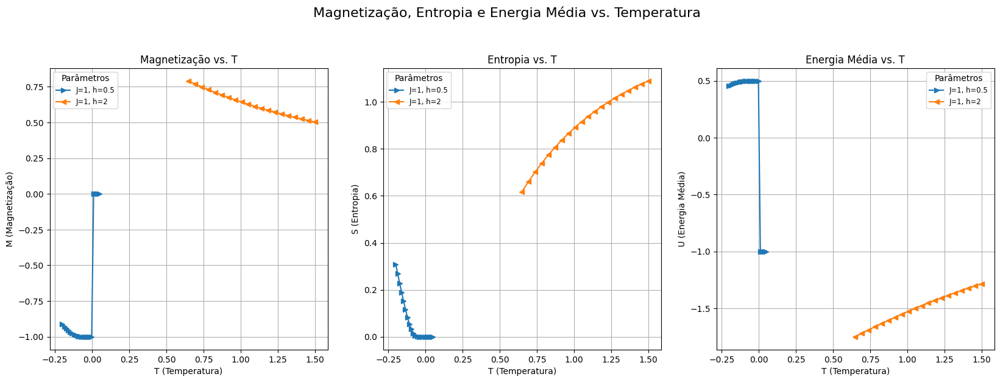

h_values: [0.5        0.57894737 0.65789474 0.73684211 0.81578947 0.89473684
 0.97368421 1.05263158 1.13157895 1.21052632 1.28947368 1.36842105
 1.44736842 1.52631579 1.60526316 1.68421053 1.76315789 1.84210526
 1.92105263 2.        ]
h_values: [2.         1.92105263 1.84210526 1.76315789 1.68421053 1.60526316
 1.52631579 1.44736842 1.36842105 1.28947368 1.21052632 1.13157895
 1.05263158 0.97368421 0.89473684 0.81578947 0.73684211 0.65789474
 0.57894737 0.5       ]


C:\Users\bolar\AppData\Local\Temp\ipykernel_33620\1067972659.py:18: RuntimeWarning: overflow encountered in exp
  numerador = (((-1) * ((J*np.exp(J/T)) + (2*h*np.sinh(h/T))))/T)
C:\Users\bolar\AppData\Local\Temp\ipykernel_33620\1067972659.py:18: RuntimeWarning: overflow encountered in sinh
  numerador = (((-1) * ((J*np.exp(J/T)) + (2*h*np.sinh(h/T))))/T)
C:\Users\bolar\AppData\Local\Temp\ipykernel_33620\1067972659.py:4: RuntimeWarning: overflow encountered in cosh
  Z = 1 + 2*(np.cosh(h/T)) + np.exp(J/T)
C:\Users\bolar\AppData\Local\Temp\ipykernel_33620\1067972659.py:4: RuntimeWarning: overflow encountered in exp
  Z = 1 + 2*(np.cosh(h/T)) + np.exp(J/T)
C:\Users\bolar\AppData\Local\Temp\ipykernel_33620\1067972659.py:20: RuntimeWarning: invalid value encountered in divide
  S = (np.log(Z(J, h, T)) + (numerador / denominador))
C:\Users\bolar\AppData\Local\Temp\ipykernel_33620\1793373168.py:26: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement fr

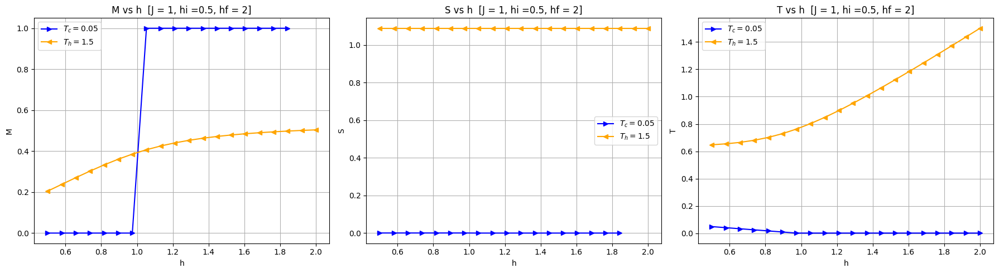

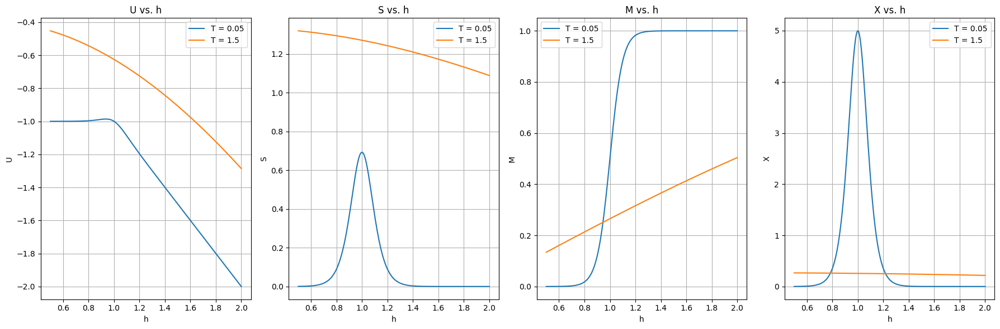

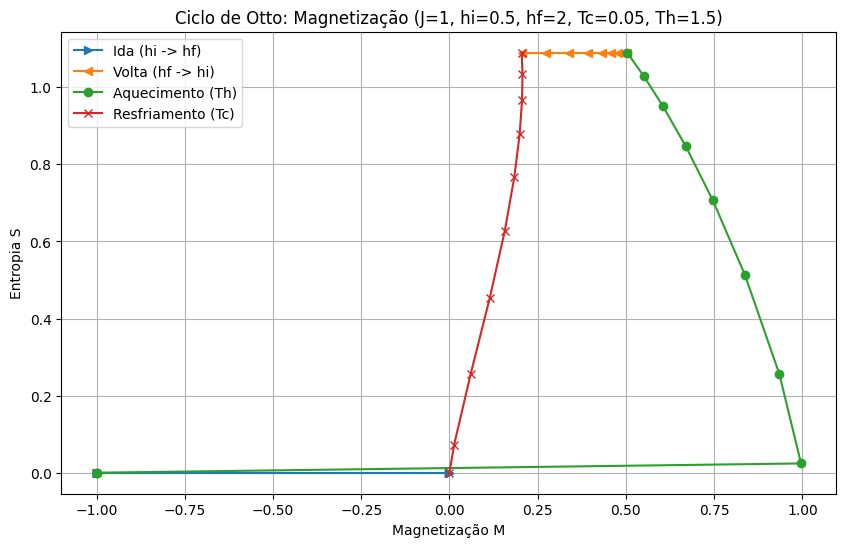

Quarto caso:
J = 2, hi = 1, hf = 2, Tc = 1.2, Th = 2
Máquina!
Eff?: 0.17881265440497257
Win: 0.2771165339, Wout: -0.313398201, Qhot: 0.20290324094082135, Qcold: -0.1666215738788177, eff: 0.17881265421770928
------
T_values_(cold->add_cold) = : [1.2        1.20422278 1.21097854 1.22106466 1.23536748 1.25479384
 1.28016238 1.31207346 1.35079925 1.39624014]
------
T_values_(hot->add_cold) = : [2.         1.92954044 1.86474524 1.80600551 1.75356364 1.70747662
 1.66760342 1.63362082 1.60506355 1.58137773]
------
h_values_(i->f) = : [1.         1.11111111 1.22222222 1.33333333 1.44444444 1.55555556
 1.66666667 1.77777778 1.88888889 2.        ]
------
h_values_(f->i) = : [2.         1.88888889 1.77777778 1.66666667 1.55555556 1.44444444
 1.33333333 1.22222222 1.11111111 1.        ]
------
J = 2, hi = 1, hf = 2, Tc = 1.2, Th = 2
População no Processo Adiabático (hi->hf), onde hi: 1 e hf: 2


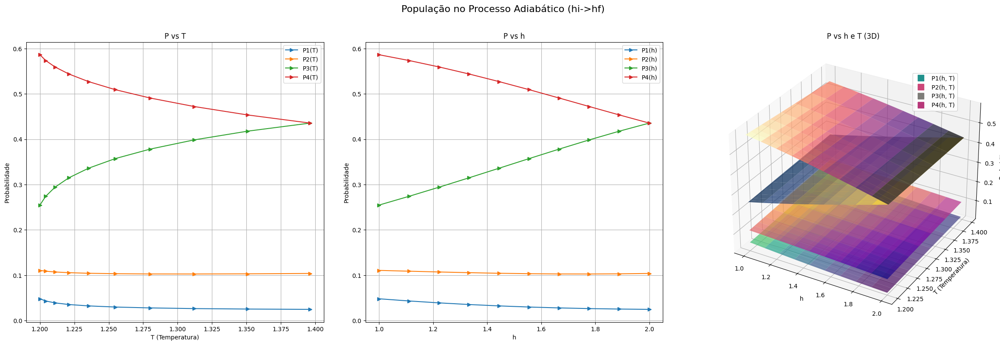

J = 2, hi = 1, hf = 2, Tc = 1.2, Th = 2
População no Processo adiabático (hf -> hi), onde hi1 e hf2


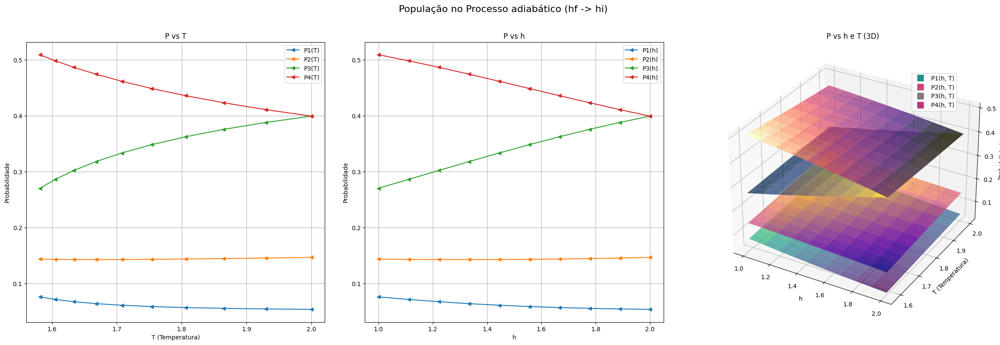

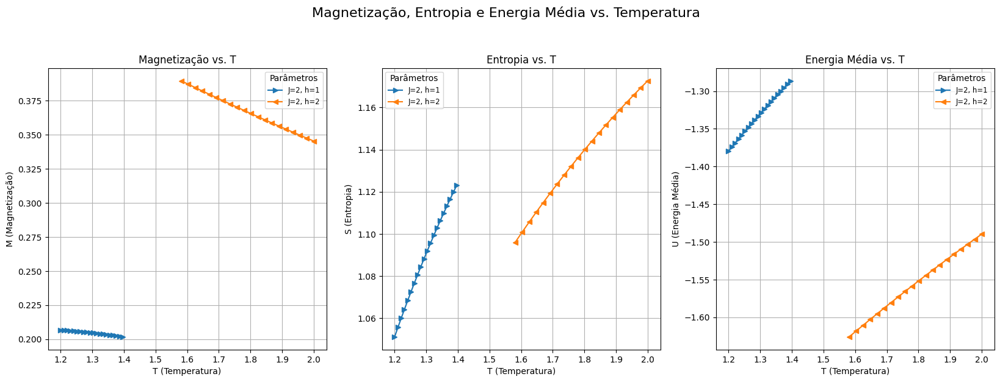

h_values: [1.         1.05263158 1.10526316 1.15789474 1.21052632 1.26315789
 1.31578947 1.36842105 1.42105263 1.47368421 1.52631579 1.57894737
 1.63157895 1.68421053 1.73684211 1.78947368 1.84210526 1.89473684
 1.94736842 2.        ]
h_values: [2.         1.94736842 1.89473684 1.84210526 1.78947368 1.73684211
 1.68421053 1.63157895 1.57894737 1.52631579 1.47368421 1.42105263
 1.36842105 1.31578947 1.26315789 1.21052632 1.15789474 1.10526316
 1.05263158 1.        ]


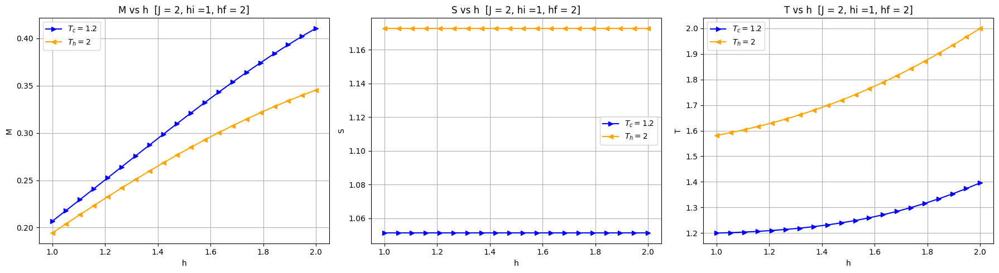

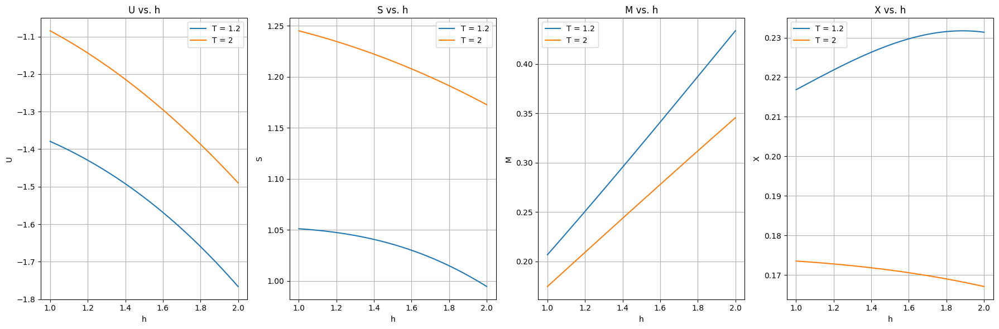

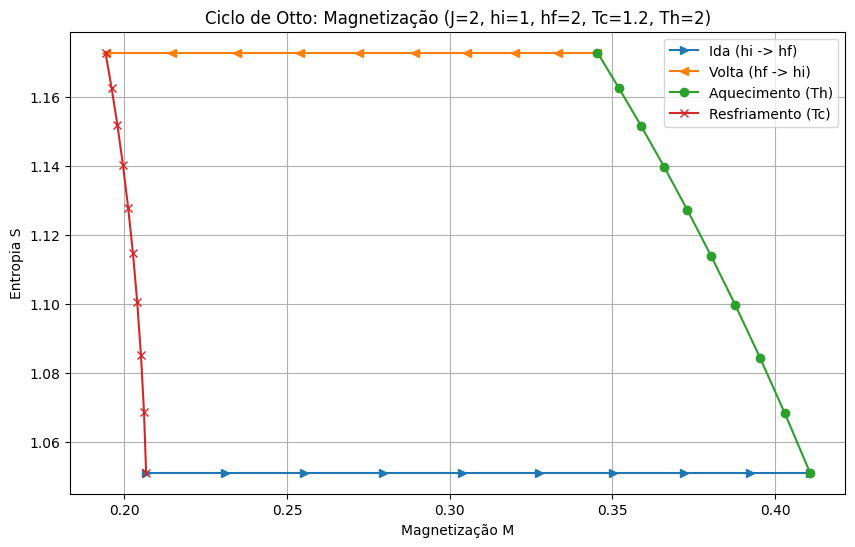

In [246]:

#primeiro caso:
print("Primeiro caso:")
J = 0.8
hi = 1
hf = 2
Tc = 1.2
Th = 2
print(f"J = {J}, hi = {hi}, hf = {hf}, Tc = {Tc}, Th = {Th}")
engineOrWhat(J, hi, hf, Tc, Th)
plot_populacao(J, hi, hf, Tc, Th)
generate_MSU_plots(J, hi, hf, Tc, Th)
plot_BTeBSeBM_Spinning(J, hi, hf, Tc, [Th], calcula_T)
plot_FB_UB_SB_MB_XB(J, hi, hf, [Tc, Th])
plot_ciclo_M(J, hi, hf, Tc, Th)



#segundo caso:
print("Segundo caso:")
J = 2
hi = 1
hf = 2
Tc = 1.2
Th = 2
print(f"J = {J}, hi = {hi}, hf = {hf}, Tc = {Tc}, Th = {Th}")
engineOrWhat(J, hi, hf, Tc, Th)
plot_populacao(J, hi, hf, Tc, Th)
generate_MSU_plots(J, hi, hf, Tc, Th)
plot_BTeBSeBM_Spinning(J, hi, hf, Tc, [Th], calcula_T)
plot_FB_UB_SB_MB_XB(J, hi, hf, [Tc, Th])
plot_ciclo_M(J, hi, hf, Tc, Th)

#terceiro caso:
print("Terceiro caso:")
J = 1
hi = 0.5
hf = 2
Tc = 0.05
Th = 1.5
print(f"J = {J}, hi = {hi}, hf = {hf}, Tc = {Tc}, Th = {Th}")
engineOrWhat(J, hi, hf, Tc, Th)
plot_populacao(J, hi, hf, Tc, Th)
generate_MSU_plots(J, hi, hf, Tc, Th)
plot_BTeBSeBM_Spinning(J, hi, hf, Tc, [Th], calcula_T)
plot_FB_UB_SB_MB_XB(J, hi, hf, [Tc, Th])
plot_ciclo_M(J, hi,hf, Tc, Th)

#quarto caso:
print("Quarto caso:")
J = 2
hi = 1
hf = 2
Tc = 1.2
Th = 2
print(f"J = {J}, hi = {hi}, hf = {hf}, Tc = {Tc}, Th = {Th}")
engineOrWhat(J, hi, hf, Tc, Th)
plot_populacao(J, hi, hf, Tc, Th)
generate_MSU_plots(J, hi, hf, Tc, Th)
plot_BTeBSeBM_Spinning(J, hi, hf, Tc, [Th], calcula_T)
plot_FB_UB_SB_MB_XB(J, hi, hf, [Tc, Th])
plot_ciclo_M(J, hi,hf, Tc, Th)

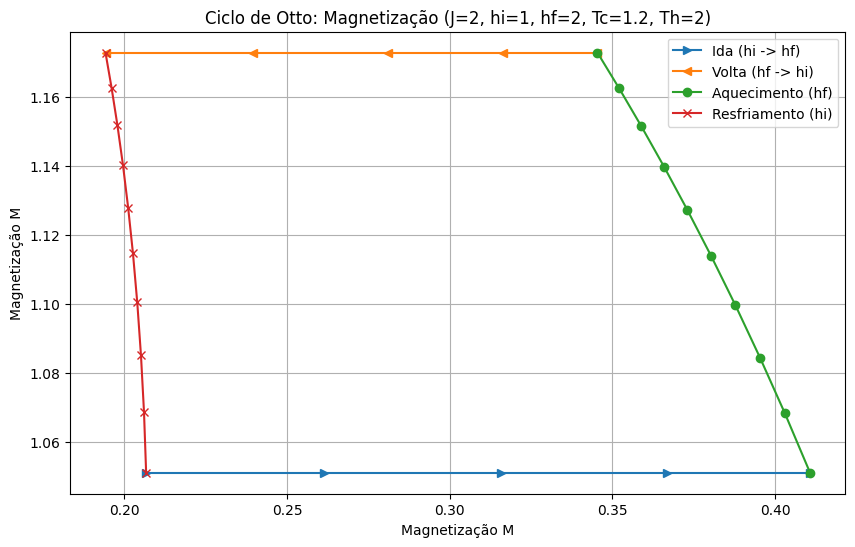

In [17]:
plot_ciclo_M(2, 1, 2, 1.2, 2)